In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-24 01:14:42,607] A new study created in memory with name: no-name-834639af-1d98-42f3-bf39-873a8c7de39a
[I 2025-05-24 01:16:34,851] Trial 0 finished with value: 0.0663404755294323 and parameters: {'lr': 0.09611347206227598, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4386777450732581}. Best is trial 0 with value: 0.0663404755294323.


Cross Validation Accuracies:
[0.05573149025440216, 0.05812397971749306, 0.0762452781200409, 0.07772889733314514, 0.06387273222208023]
Mean Cross Validation Accuracy:
0.0663404755294323
Standard Deviation of Cross Validation Accuracy:
0.00909892734955732


[I 2025-05-24 01:20:09,184] Trial 1 finished with value: 2.3190051317214966 and parameters: {'lr': 0.1390135533383707, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.158814273582484}. Best is trial 0 with value: 0.0663404755294323.


Cross Validation Accuracies:
[2.2155232429504395, 2.046894073486328, 1.833328366279602, 3.061844825744629, 2.4374351501464844]
Mean Cross Validation Accuracy:
2.3190051317214966
Standard Deviation of Cross Validation Accuracy:
0.42106325655134375


[I 2025-05-24 01:23:08,589] Trial 2 finished with value: 0.10423232465982438 and parameters: {'lr': 0.09776597136889212, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4225149790102888}. Best is trial 0 with value: 0.0663404755294323.


Cross Validation Accuracies:
[0.09036526083946228, 0.07557860761880875, 0.1095808669924736, 0.14333438873291016, 0.10230249911546707]
Mean Cross Validation Accuracy:
0.10423232465982438
Standard Deviation of Cross Validation Accuracy:
0.02269199641175754


[I 2025-05-24 01:25:20,946] Trial 3 finished with value: 0.0604073204100132 and parameters: {'lr': 0.00665137762359058, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.3481040529408675}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.05120478942990303, 0.04919479787349701, 0.06911543756723404, 0.07661311328411102, 0.05590846389532089]
Mean Cross Validation Accuracy:
0.0604073204100132
Standard Deviation of Cross Validation Accuracy:
0.010668701655905503


[I 2025-05-24 01:31:06,633] Trial 4 finished with value: 0.23698459267616273 and parameters: {'lr': 0.01858430757565702, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3645719717745386}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.2714492976665497, 0.23467889428138733, 0.2271706461906433, 0.282153844833374, 0.16947028040885925]
Mean Cross Validation Accuracy:
0.23698459267616273
Standard Deviation of Cross Validation Accuracy:
0.039718734577404186


[I 2025-05-24 01:33:28,330] Trial 5 finished with value: 0.06516146957874298 and parameters: {'lr': 0.14188735066231348, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3226827454323691}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.046074505895376205, 0.057221103459596634, 0.07721615582704544, 0.0844338908791542, 0.06086169183254242]
Mean Cross Validation Accuracy:
0.06516146957874298
Standard Deviation of Cross Validation Accuracy:
0.013875095450111527


[I 2025-05-24 01:39:04,587] Trial 6 finished with value: 1.7660640001296997 and parameters: {'lr': 0.0963135723532871, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4537506875968549}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[2.02870512008667, 1.7628592252731323, 1.5094109773635864, 1.8281025886535645, 1.7012420892715454]
Mean Cross Validation Accuracy:
1.7660640001296997
Standard Deviation of Cross Validation Accuracy:
0.16906334266330586


[I 2025-05-24 01:43:19,995] Trial 7 finished with value: 0.06077863350510597 and parameters: {'lr': 0.028373670325973207, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3887782128680205}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.05030292645096779, 0.05055038630962372, 0.0694279596209526, 0.07856132090091705, 0.055050574243068695]
Mean Cross Validation Accuracy:
0.06077863350510597
Standard Deviation of Cross Validation Accuracy:
0.011297813550956017


[I 2025-05-24 01:48:24,955] Trial 8 finished with value: 0.06975705772638321 and parameters: {'lr': 0.0012767435275377202, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3729367099368289}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[0.06442853808403015, 0.061361491680145264, 0.07231535017490387, 0.08439680188894272, 0.06628310680389404]
Mean Cross Validation Accuracy:
0.06975705772638321
Standard Deviation of Cross Validation Accuracy:
0.008146336050334558


[I 2025-05-24 01:54:00,296] Trial 9 finished with value: 5.7544232368469235 and parameters: {'lr': 0.9226812954578291, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.19139939804067582}. Best is trial 3 with value: 0.0604073204100132.


Cross Validation Accuracies:
[5.556447505950928, 6.391087055206299, 5.774102687835693, 5.566640377044678, 5.4838385581970215]
Mean Cross Validation Accuracy:
5.7544232368469235
Standard Deviation of Cross Validation Accuracy:
0.3326863264934534


[I 2025-05-24 01:56:17,823] Trial 10 finished with value: 0.060248592495918275 and parameters: {'lr': 0.0032164097542874844, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.24555548430445945}. Best is trial 10 with value: 0.060248592495918275.


Cross Validation Accuracies:
[0.04928794875741005, 0.04962216690182686, 0.06901229918003082, 0.0776141807436943, 0.055706366896629333]
Mean Cross Validation Accuracy:
0.060248592495918275
Standard Deviation of Cross Validation Accuracy:
0.011243261586395225


[I 2025-05-24 01:58:39,155] Trial 11 finished with value: 0.060080526024103166 and parameters: {'lr': 0.0035096842754242623, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.23454704121931963}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.04899641498923302, 0.04965163394808769, 0.06912282109260559, 0.0768270418047905, 0.055804718285799026]
Mean Cross Validation Accuracy:
0.060080526024103166
Standard Deviation of Cross Validation Accuracy:
0.011064454167107596


[I 2025-05-24 02:00:57,185] Trial 12 finished with value: 0.060348210483789445 and parameters: {'lr': 0.0014380248768641104, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.24063368290453022}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.0498889721930027, 0.04984690248966217, 0.06866779923439026, 0.07785842567682266, 0.05547895282506943]
Mean Cross Validation Accuracy:
0.060348210483789445
Standard Deviation of Cross Validation Accuracy:
0.01112839609686355


[I 2025-05-24 02:03:19,816] Trial 13 finished with value: 0.06016390472650528 and parameters: {'lr': 0.004661013959236443, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.260316184623758}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.04998728260397911, 0.04935288056731224, 0.06851087510585785, 0.07753445208072662, 0.055434033274650574]
Mean Cross Validation Accuracy:
0.06016390472650528
Standard Deviation of Cross Validation Accuracy:
0.011083513838539203


[I 2025-05-24 02:05:48,155] Trial 14 finished with value: 0.06018711403012276 and parameters: {'lr': 0.00782085485037581, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.10582200016575657}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.04970979318022728, 0.0509929321706295, 0.06768601387739182, 0.07693956792354584, 0.05560726299881935]
Mean Cross Validation Accuracy:
0.06018711403012276
Standard Deviation of Cross Validation Accuracy:
0.010508667642443148


[I 2025-05-24 02:08:13,379] Trial 15 finished with value: 0.13821850568056107 and parameters: {'lr': 0.0037511769488984274, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2724842588051523}. Best is trial 11 with value: 0.060080526024103166.


Cross Validation Accuracies:
[0.0858163833618164, 0.1718171387910843, 0.15411610901355743, 0.15991544723510742, 0.11942745000123978]
Mean Cross Validation Accuracy:
0.13821850568056107
Standard Deviation of Cross Validation Accuracy:
0.0314688589195804


[I 2025-05-24 02:10:31,097] Trial 16 finished with value: 0.05857744812965393 and parameters: {'lr': 0.012583806596462462, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18933335146113747}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.049439966678619385, 0.050125375390052795, 0.06591598689556122, 0.07494895160198212, 0.05245696008205414]
Mean Cross Validation Accuracy:
0.05857744812965393
Standard Deviation of Cross Validation Accuracy:
0.010141713385493585


[I 2025-05-24 02:12:59,939] Trial 17 finished with value: 0.060726651549339296 and parameters: {'lr': 0.009814597976152082, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18412453852619687}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.052225783467292786, 0.05157947167754173, 0.06873369216918945, 0.07566684484481812, 0.055427465587854385]
Mean Cross Validation Accuracy:
0.060726651549339296
Standard Deviation of Cross Validation Accuracy:
0.009709161702268378


[I 2025-05-24 02:15:24,552] Trial 18 finished with value: 0.1414507582783699 and parameters: {'lr': 0.017440625467641732, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.13942296288726902}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.08137976378202438, 0.1647060066461563, 0.15428997576236725, 0.17598561942577362, 0.13089242577552795]
Mean Cross Validation Accuracy:
0.1414507582783699
Standard Deviation of Cross Validation Accuracy:
0.03352107242240263


[I 2025-05-24 02:18:12,876] Trial 19 finished with value: 0.07244054451584817 and parameters: {'lr': 0.002547398073104068, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.29535250660317175}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05222160741686821, 0.07308634370565414, 0.08288931846618652, 0.09024223685264587, 0.06376321613788605]
Mean Cross Validation Accuracy:
0.07244054451584817
Standard Deviation of Cross Validation Accuracy:
0.013495151936190422


[I 2025-05-24 02:20:46,588] Trial 20 finished with value: 0.0688962146639824 and parameters: {'lr': 0.03926751404504221, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2010060098795629}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06688518822193146, 0.06363406032323837, 0.06287848204374313, 0.0764666348695755, 0.07461670786142349]
Mean Cross Validation Accuracy:
0.0688962146639824
Standard Deviation of Cross Validation Accuracy:
0.00562108363318592


[I 2025-05-24 02:23:16,239] Trial 21 finished with value: 0.060177265852689746 and parameters: {'lr': 0.005087260405951382, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.49717370750713086}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05065624415874481, 0.04938729107379913, 0.06818271428346634, 0.07748402655124664, 0.05517605319619179]
Mean Cross Validation Accuracy:
0.060177265852689746
Standard Deviation of Cross Validation Accuracy:
0.010915096960779762


[I 2025-05-24 02:25:40,624] Trial 22 finished with value: 0.06028738394379616 and parameters: {'lr': 0.0020184900841142515, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2271012950176699}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04961559548974037, 0.049565110355615616, 0.06922563165426254, 0.07745205610990524, 0.055578526109457016]
Mean Cross Validation Accuracy:
0.06028738394379616
Standard Deviation of Cross Validation Accuracy:
0.011185220646152556


[I 2025-05-24 02:28:05,286] Trial 23 finished with value: 0.06075650453567505 and parameters: {'lr': 0.012633827453728395, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.27598167929498907}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05270371213555336, 0.04929168522357941, 0.07148482650518417, 0.07632235437631607, 0.05397994443774223]
Mean Cross Validation Accuracy:
0.06075650453567505
Standard Deviation of Cross Validation Accuracy:
0.010950834558171266


[I 2025-05-24 02:29:52,821] Trial 24 finished with value: 0.06703053191304206 and parameters: {'lr': 0.038160249595684745, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.21080114943222245}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0713140219449997, 0.057289525866508484, 0.06148723140358925, 0.08228890597820282, 0.0627729743719101]
Mean Cross Validation Accuracy:
0.06703053191304206
Standard Deviation of Cross Validation Accuracy:
0.008887164244223283


[I 2025-05-24 02:32:06,042] Trial 25 finished with value: 0.06103661805391312 and parameters: {'lr': 0.005651190695839962, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.15447783055179862}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05136324465274811, 0.049365222454071045, 0.06883767247200012, 0.07926729321479797, 0.056349657475948334]
Mean Cross Validation Accuracy:
0.06103661805391312
Standard Deviation of Cross Validation Accuracy:
0.011357615898782935


[I 2025-05-24 02:34:17,774] Trial 26 finished with value: 0.060104161500930786 and parameters: {'lr': 0.002199065923582203, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2573187582821934}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.049374714493751526, 0.04947832599282265, 0.06865815073251724, 0.07711952179670334, 0.05589009448885918]
Mean Cross Validation Accuracy:
0.060104161500930786
Standard Deviation of Cross Validation Accuracy:
0.011031599991628775


[I 2025-05-24 02:36:39,213] Trial 27 finished with value: 0.0602863110601902 and parameters: {'lr': 0.0020865839215953572, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.314605723561593}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05007452890276909, 0.04961460828781128, 0.06903525441884995, 0.07699605822563171, 0.05571110546588898]
Mean Cross Validation Accuracy:
0.0602863110601902
Standard Deviation of Cross Validation Accuracy:
0.010907409420653158


[I 2025-05-24 02:39:56,011] Trial 28 finished with value: 0.07356517612934113 and parameters: {'lr': 0.0012217302937193165, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.10769299897165457}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06703439354896545, 0.08343540132045746, 0.07577437162399292, 0.08350000530481339, 0.05808170884847641]
Mean Cross Validation Accuracy:
0.07356517612934113
Standard Deviation of Cross Validation Accuracy:
0.00983251342183166


[I 2025-05-24 02:42:20,255] Trial 29 finished with value: 0.06181840375065804 and parameters: {'lr': 0.012584570793616466, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22256368938138893}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05160243809223175, 0.05003950372338295, 0.06906575709581375, 0.07738222926855087, 0.06100209057331085]
Mean Cross Validation Accuracy:
0.06181840375065804
Standard Deviation of Cross Validation Accuracy:
0.010378165566718897


[I 2025-05-24 02:44:32,394] Trial 30 finished with value: 0.06482661068439484 and parameters: {'lr': 0.054041265396306874, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.1737285151008117}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06151125207543373, 0.04764775186777115, 0.07115989923477173, 0.08277756720781326, 0.06103658303618431]
Mean Cross Validation Accuracy:
0.06482661068439484
Standard Deviation of Cross Validation Accuracy:
0.011686030005863376


[I 2025-05-24 02:47:15,370] Trial 31 finished with value: 0.06020777747035026 and parameters: {'lr': 0.004126819050143067, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2650414499478294}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05029670149087906, 0.048795055598020554, 0.06849055737257004, 0.0780213475227356, 0.05543522536754608]
Mean Cross Validation Accuracy:
0.06020777747035026
Standard Deviation of Cross Validation Accuracy:
0.011288796411485504


[I 2025-05-24 02:49:33,005] Trial 32 finished with value: 0.060436681658029553 and parameters: {'lr': 0.002769689064667865, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2616488478574927}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050189223140478134, 0.04988900199532509, 0.06863117218017578, 0.07739534229040146, 0.05607866868376732]
Mean Cross Validation Accuracy:
0.060436681658029553
Standard Deviation of Cross Validation Accuracy:
0.010862799591093538


[I 2025-05-24 02:51:43,187] Trial 33 finished with value: 0.06125041171908378 and parameters: {'lr': 0.0010037408001855469, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.29457936994038064}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05372806638479233, 0.05002914369106293, 0.06934433430433273, 0.07761798799037933, 0.05553252622485161]
Mean Cross Validation Accuracy:
0.06125041171908378
Standard Deviation of Cross Validation Accuracy:
0.01047478769066801


[I 2025-05-24 02:54:21,975] Trial 34 finished with value: 0.06043914631009102 and parameters: {'lr': 0.00802496925508273, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.243766134156234}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05040942132472992, 0.050341393798589706, 0.06849808245897293, 0.07827161252498627, 0.05467522144317627]
Mean Cross Validation Accuracy:
0.06043914631009102
Standard Deviation of Cross Validation Accuracy:
0.011124083082160814


[I 2025-05-24 02:56:36,357] Trial 35 finished with value: 0.06034991890192032 and parameters: {'lr': 0.001819992302974783, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3294253323818063}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0500563345849514, 0.04946891963481903, 0.06878947466611862, 0.07776504755020142, 0.055669818073511124]
Mean Cross Validation Accuracy:
0.06034991890192032
Standard Deviation of Cross Validation Accuracy:
0.011142442947921945


[I 2025-05-24 02:59:45,425] Trial 36 finished with value: 0.07497927397489548 and parameters: {'lr': 0.005168868996997178, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.15834339612274212}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06275928020477295, 0.06535421311855316, 0.06972522288560867, 0.09520319104194641, 0.08185446262359619]
Mean Cross Validation Accuracy:
0.07497927397489548
Standard Deviation of Cross Validation Accuracy:
0.012048652518594263


[I 2025-05-24 03:01:55,100] Trial 37 finished with value: 0.06220525726675987 and parameters: {'lr': 0.021155365917566882, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2248742715232805}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04856157302856445, 0.05230605974793434, 0.0672784149646759, 0.08009877055883408, 0.06278146803379059]
Mean Cross Validation Accuracy:
0.06220525726675987
Standard Deviation of Cross Validation Accuracy:
0.011228454897428288


[I 2025-05-24 03:04:55,954] Trial 38 finished with value: 0.06046527624130249 and parameters: {'lr': 0.012362478271155237, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2006015278939784}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.049345847219228745, 0.04805497080087662, 0.06806445866823196, 0.07985585182905197, 0.057005252689123154]
Mean Cross Validation Accuracy:
0.06046527624130249
Standard Deviation of Cross Validation Accuracy:
0.012028060035310893


[I 2025-05-24 03:07:18,808] Trial 39 finished with value: 4.064578819274902 and parameters: {'lr': 0.39238543088624483, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.29637581285328674}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[4.547480583190918, 2.8041739463806152, 4.045146942138672, 3.367302894592285, 5.5587897300720215]
Mean Cross Validation Accuracy:
4.064578819274902
Standard Deviation of Cross Validation Accuracy:
0.9530007467095769


[I 2025-05-24 03:09:14,524] Trial 40 finished with value: 0.06382537931203842 and parameters: {'lr': 0.003969205292486996, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.33465859632945605}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05163729190826416, 0.05390852689743042, 0.07232318818569183, 0.08047609776258469, 0.06078179180622101]
Mean Cross Validation Accuracy:
0.06382537931203842
Standard Deviation of Cross Validation Accuracy:
0.011005598955561026


[I 2025-05-24 03:10:55,426] Trial 41 finished with value: 0.06019473075866699 and parameters: {'lr': 0.005568037910920602, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4786317717408524}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050697192549705505, 0.04979837313294411, 0.0677935928106308, 0.07749404013156891, 0.05519045516848564]
Mean Cross Validation Accuracy:
0.06019473075866699
Standard Deviation of Cross Validation Accuracy:
0.010773477315697494


[I 2025-05-24 03:12:38,525] Trial 42 finished with value: 0.061256276071071626 and parameters: {'lr': 0.007548342000792872, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.39464289062460467}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.051435161381959915, 0.049472883343696594, 0.06824938207864761, 0.08031853288412094, 0.05680542066693306]
Mean Cross Validation Accuracy:
0.061256276071071626
Standard Deviation of Cross Validation Accuracy:
0.011553232605402095


[I 2025-05-24 03:14:31,277] Trial 43 finished with value: 0.060115878283977506 and parameters: {'lr': 0.0045882659555312, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.45338346327807405}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05048877373337746, 0.04898534715175629, 0.06849055737257004, 0.07728193700313568, 0.05533277615904808]
Mean Cross Validation Accuracy:
0.060115878283977506
Standard Deviation of Cross Validation Accuracy:
0.010993241132964652


[I 2025-05-24 03:18:13,410] Trial 44 finished with value: 0.06736791729927064 and parameters: {'lr': 0.0028710176432494303, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.4299650546254363}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06061430275440216, 0.056036077439785004, 0.06780685484409332, 0.08323984593153, 0.06914250552654266]
Mean Cross Validation Accuracy:
0.06736791729927064
Standard Deviation of Cross Validation Accuracy:
0.009265871271217276


[I 2025-05-24 03:20:10,915] Trial 45 finished with value: 0.37229722142219546 and parameters: {'lr': 0.0017195757261512725, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35331220409389746}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.40502938628196716, 0.3960557281970978, 0.39874032139778137, 0.29652807116508484, 0.365132600069046]
Mean Cross Validation Accuracy:
0.37229722142219546
Standard Deviation of Cross Validation Accuracy:
0.040317228889688826


[I 2025-05-24 03:22:21,783] Trial 46 finished with value: 0.060743505507707594 and parameters: {'lr': 0.010046015274048168, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.40696262866928584}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.048731423914432526, 0.0516427606344223, 0.06858859956264496, 0.07862558960914612, 0.056129153817892075]
Mean Cross Validation Accuracy:
0.060743505507707594
Standard Deviation of Cross Validation Accuracy:
0.011222480434477608


[I 2025-05-24 03:26:10,042] Trial 47 finished with value: 0.06138894036412239 and parameters: {'lr': 0.024865309548099963, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.25367004959605854}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05855738744139671, 0.04304709658026695, 0.07224561274051666, 0.08194497227668762, 0.051149632781744]
Mean Cross Validation Accuracy:
0.06138894036412239
Standard Deviation of Cross Validation Accuracy:
0.014069130237444438


[I 2025-05-24 03:28:34,443] Trial 48 finished with value: 0.0638867311179638 and parameters: {'lr': 0.0037453457623558375, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3128306045760347}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.056927796453237534, 0.04976959526538849, 0.07522063702344894, 0.08001113682985306, 0.05750449001789093]
Mean Cross Validation Accuracy:
0.0638867311179638
Standard Deviation of Cross Validation Accuracy:
0.011635352856217583


[I 2025-05-24 03:30:30,101] Trial 49 finished with value: 0.060862661153078076 and parameters: {'lr': 0.016913301437573778, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13383226977287307}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05167745053768158, 0.04865730181336403, 0.06975455582141876, 0.07731609046459198, 0.056907907128334045]
Mean Cross Validation Accuracy:
0.060862661153078076
Standard Deviation of Cross Validation Accuracy:
0.01094312658209542


[I 2025-05-24 03:32:22,233] Trial 50 finished with value: 0.07000289410352707 and parameters: {'lr': 0.0027505256991501785, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18719569316027596}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.06197335571050644, 0.05138983950018883, 0.09219516068696976, 0.08216636627912521, 0.06228974834084511]
Mean Cross Validation Accuracy:
0.07000289410352707
Standard Deviation of Cross Validation Accuracy:
0.014905426243521916


[I 2025-05-24 03:34:07,874] Trial 51 finished with value: 0.06033792719244957 and parameters: {'lr': 0.004734883991904868, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4714782316595556}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050721004605293274, 0.048960041254758835, 0.06920428574085236, 0.07696911692619324, 0.055835187435150146]
Mean Cross Validation Accuracy:
0.06033792719244957
Standard Deviation of Cross Validation Accuracy:
0.010930918896863505


[I 2025-05-24 03:35:59,463] Trial 52 finished with value: 0.06023994013667107 and parameters: {'lr': 0.00639768255820573, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4534654500988202}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04988380894064903, 0.04991781711578369, 0.06767135858535767, 0.07770778238773346, 0.05601893365383148]
Mean Cross Validation Accuracy:
0.06023994013667107
Standard Deviation of Cross Validation Accuracy:
0.010880846160140376


[I 2025-05-24 03:37:35,420] Trial 53 finished with value: 0.06126395314931869 and parameters: {'lr': 0.009441667326419096, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4929191814488475}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.051815275102853775, 0.05095745623111725, 0.07038498669862747, 0.07858411222696304, 0.05457793548703194]
Mean Cross Validation Accuracy:
0.06126395314931869
Standard Deviation of Cross Validation Accuracy:
0.011165889048468793


[I 2025-05-24 03:39:21,979] Trial 54 finished with value: 0.06034421920776367 and parameters: {'lr': 0.002330131099244145, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.49226117524271057}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050339020788669586, 0.050123706459999084, 0.06822642683982849, 0.07693213224411011, 0.05609980970621109]
Mean Cross Validation Accuracy:
0.06034421920776367
Standard Deviation of Cross Validation Accuracy:
0.010581738461197233


[I 2025-05-24 03:41:15,107] Trial 55 finished with value: 0.06023600697517395 and parameters: {'lr': 0.0035444762328612277, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2326029634449647}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05021806061267853, 0.050020862370729446, 0.06839131563901901, 0.07731298357248306, 0.0552368126809597]
Mean Cross Validation Accuracy:
0.06023600697517395
Standard Deviation of Cross Validation Accuracy:
0.010842809242170414


[I 2025-05-24 03:42:52,071] Trial 56 finished with value: 0.06032423824071884 and parameters: {'lr': 0.0016182505381466493, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2781224831814467}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05002141371369362, 0.04975142329931259, 0.06867227703332901, 0.0777585506439209, 0.05541752651333809]
Mean Cross Validation Accuracy:
0.06032423824071884
Standard Deviation of Cross Validation Accuracy:
0.01109642671900176


[I 2025-05-24 03:46:13,242] Trial 57 finished with value: 0.06808652207255364 and parameters: {'lr': 0.006691518382290263, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4726777507685638}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.062300268560647964, 0.0527539886534214, 0.07369972765445709, 0.08991359919309616, 0.061765026301145554]
Mean Cross Validation Accuracy:
0.06808652207255364
Standard Deviation of Cross Validation Accuracy:
0.012778560107239007


[I 2025-05-24 03:48:57,551] Trial 58 finished with value: 0.060288825631141664 and parameters: {'lr': 0.004716510641384771, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4497277429015104}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05159471929073334, 0.04914021119475365, 0.06867089122533798, 0.07714934647083282, 0.05488895997405052]
Mean Cross Validation Accuracy:
0.060288825631141664
Standard Deviation of Cross Validation Accuracy:
0.010803460784723287


[I 2025-05-24 03:52:19,991] Trial 59 finished with value: 0.06360699757933616 and parameters: {'lr': 0.01455730967499716, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2117377543289437}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04666071757674217, 0.06508321315050125, 0.07248011231422424, 0.07592766731977463, 0.05788327753543854]
Mean Cross Validation Accuracy:
0.06360699757933616
Standard Deviation of Cross Validation Accuracy:
0.010513302596531946


[I 2025-05-24 03:54:57,023] Trial 60 finished with value: 0.06135954111814499 and parameters: {'lr': 0.009115540693819807, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1737493172822573}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05122634395956993, 0.050279613584280014, 0.06925895065069199, 0.08005204051733017, 0.055980756878852844]
Mean Cross Validation Accuracy:
0.06135954111814499
Standard Deviation of Cross Validation Accuracy:
0.01154285929442565


[I 2025-05-24 03:57:07,099] Trial 61 finished with value: 0.060055617988109586 and parameters: {'lr': 0.003319103496060317, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1152554366206567}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04979312792420387, 0.049351420253515244, 0.06823316961526871, 0.07714350521564484, 0.05575686693191528]
Mean Cross Validation Accuracy:
0.060055617988109586
Standard Deviation of Cross Validation Accuracy:
0.010929282251017263


[I 2025-05-24 03:59:19,163] Trial 62 finished with value: 0.0603411465883255 and parameters: {'lr': 0.002197443588460913, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.12539995889176347}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05063484609127045, 0.04933499917387962, 0.06861180812120438, 0.07757487893104553, 0.055549200624227524]
Mean Cross Validation Accuracy:
0.0603411465883255
Standard Deviation of Cross Validation Accuracy:
0.010988318060762862


[I 2025-05-24 04:01:30,772] Trial 63 finished with value: 0.06013099774718285 and parameters: {'lr': 0.0031786550904997594, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2824704808012052}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0496620275080204, 0.049318552017211914, 0.06893530488014221, 0.07813455909490585, 0.05460454523563385]
Mean Cross Validation Accuracy:
0.06013099774718285
Standard Deviation of Cross Validation Accuracy:
0.011477752769485382


[I 2025-05-24 04:03:40,565] Trial 64 finished with value: 0.05995095670223236 and parameters: {'lr': 0.00320862724948566, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2869428033379535}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0492803119122982, 0.04799806699156761, 0.06957987695932388, 0.07719933986663818, 0.05569718778133392]
Mean Cross Validation Accuracy:
0.05995095670223236
Standard Deviation of Cross Validation Accuracy:
0.011533010099746305


[I 2025-05-24 04:06:04,457] Trial 65 finished with value: 0.06024790480732918 and parameters: {'lr': 0.003248830136420171, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2838029912061083}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0508534200489521, 0.048499930649995804, 0.06865108758211136, 0.07763393223285675, 0.055601153522729874]
Mean Cross Validation Accuracy:
0.06024790480732918
Standard Deviation of Cross Validation Accuracy:
0.011142270581576002


[I 2025-05-24 04:08:19,100] Trial 66 finished with value: 0.060254880040884015 and parameters: {'lr': 0.001261920089000173, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3086929486551275}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05014854669570923, 0.049186721444129944, 0.06875286251306534, 0.07771637290716171, 0.05546989664435387]
Mean Cross Validation Accuracy:
0.060254880040884015
Standard Deviation of Cross Validation Accuracy:
0.011177277072063034


[I 2025-05-24 04:10:29,897] Trial 67 finished with value: 0.06026346161961556 and parameters: {'lr': 0.001480242849037198, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2441669158432837}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050004877150058746, 0.049897097051143646, 0.06859950721263885, 0.0772889256477356, 0.05552690103650093]
Mean Cross Validation Accuracy:
0.06026346161961556
Standard Deviation of Cross Validation Accuracy:
0.010904046563957711


[I 2025-05-24 04:12:59,257] Trial 68 finished with value: 0.07154315114021301 and parameters: {'lr': 0.002431722484951938, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.37298477183871226}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05974225699901581, 0.05205811560153961, 0.0844324380159378, 0.09638340026140213, 0.06509954482316971]
Mean Cross Validation Accuracy:
0.07154315114021301
Standard Deviation of Cross Validation Accuracy:
0.01639280005009282


[I 2025-05-24 04:15:24,147] Trial 69 finished with value: 0.06034475713968277 and parameters: {'lr': 0.001006347949651916, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.26234238758746425}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04966782405972481, 0.04951724037528038, 0.06957796961069107, 0.07726029306650162, 0.05570045858621597]
Mean Cross Validation Accuracy:
0.06034475713968277
Standard Deviation of Cross Validation Accuracy:
0.011173084592513668


[I 2025-05-24 04:17:42,625] Trial 70 finished with value: 0.09197816401720046 and parameters: {'lr': 0.056321937555938346, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.286459732586009}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.090122751891613, 0.07874702662229538, 0.0940416157245636, 0.11018666625022888, 0.08679275959730148]
Mean Cross Validation Accuracy:
0.09197816401720046
Standard Deviation of Cross Validation Accuracy:
0.010403858480730707


[I 2025-05-24 04:19:51,543] Trial 71 finished with value: 0.060343355685472486 and parameters: {'lr': 0.0030240399775611766, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.26848805615251287}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05041820928454399, 0.04980887472629547, 0.06878771632909775, 0.07756388187408447, 0.05513809621334076]
Mean Cross Validation Accuracy:
0.060343355685472486
Standard Deviation of Cross Validation Accuracy:
0.010994837836217708


[I 2025-05-24 04:22:08,585] Trial 72 finished with value: 0.06012117341160774 and parameters: {'lr': 0.004283734823020672, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2552404032946885}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04943995177745819, 0.049115587025880814, 0.06863424926996231, 0.07771597802639008, 0.05570010095834732]
Mean Cross Validation Accuracy:
0.06012117341160774
Standard Deviation of Cross Validation Accuracy:
0.011285450092317678


[I 2025-05-24 04:24:24,500] Trial 73 finished with value: 0.06047673150897026 and parameters: {'lr': 0.004094127042213769, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2529240509540616}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05189770087599754, 0.04905140772461891, 0.06976034492254257, 0.0766139030456543, 0.05506030097603798]
Mean Cross Validation Accuracy:
0.06047673150897026
Standard Deviation of Cross Validation Accuracy:
0.01077097296546468


[I 2025-05-24 04:26:37,528] Trial 74 finished with value: 0.060128945112228396 and parameters: {'lr': 0.0019412065961147606, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2165137808979884}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04999455437064171, 0.048946086317300797, 0.06880894303321838, 0.07714725285768509, 0.05574788898229599]
Mean Cross Validation Accuracy:
0.060128945112228396
Standard Deviation of Cross Validation Accuracy:
0.01106273945974981


[I 2025-05-24 04:29:17,957] Trial 75 finished with value: 0.06011576652526855 and parameters: {'lr': 0.0019587812357464117, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2101555463244163}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04978245124220848, 0.049516461789608, 0.06858164817094803, 0.07726964354515076, 0.055428627878427505]
Mean Cross Validation Accuracy:
0.06011576652526855
Standard Deviation of Cross Validation Accuracy:
0.011018335474699664


[I 2025-05-24 04:31:44,639] Trial 76 finished with value: 0.06003864407539368 and parameters: {'lr': 0.0064776450987943214, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23262017892950096}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05077330023050308, 0.04916521534323692, 0.06789635866880417, 0.07673869282007217, 0.055619653314352036]
Mean Cross Validation Accuracy:
0.06003864407539368
Standard Deviation of Cross Validation Accuracy:
0.010623001788662653


[I 2025-05-24 04:34:29,414] Trial 77 finished with value: 0.0634428769350052 and parameters: {'lr': 0.0063086956010021955, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1938252022719909}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050356969237327576, 0.054596614092588425, 0.07890442758798599, 0.07468120008707047, 0.05867517367005348]
Mean Cross Validation Accuracy:
0.0634428769350052
Standard Deviation of Cross Validation Accuracy:
0.011292367305723194


[I 2025-05-24 04:37:02,928] Trial 78 finished with value: 0.06652219370007514 and parameters: {'lr': 0.29346805024476047, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23318345670657825}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050969526171684265, 0.045842286199331284, 0.08479862660169601, 0.08509408682584763, 0.06590644270181656]
Mean Cross Validation Accuracy:
0.06652219370007514
Standard Deviation of Cross Validation Accuracy:
0.0164247764347793


[I 2025-05-24 04:39:52,934] Trial 79 finished with value: 0.06145017519593239 and parameters: {'lr': 0.007817095069339808, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1506764151414296}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.053342580795288086, 0.05058427155017853, 0.06828169524669647, 0.0794379934668541, 0.05560433492064476]
Mean Cross Validation Accuracy:
0.06145017519593239
Standard Deviation of Cross Validation Accuracy:
0.010846253453428397


[I 2025-05-24 04:42:49,784] Trial 80 finished with value: 0.06147937625646591 and parameters: {'lr': 0.002332763377670883, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.20533899028932023}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05084580183029175, 0.05047814920544624, 0.07127177715301514, 0.08122088015079498, 0.05358027294278145]
Mean Cross Validation Accuracy:
0.06147937625646591
Standard Deviation of Cross Validation Accuracy:
0.012506908700345428


[I 2025-05-24 04:45:56,777] Trial 81 finished with value: 0.06028019189834595 and parameters: {'lr': 0.004048821109857787, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.23654161549098063}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04979489743709564, 0.04917408153414726, 0.06921445578336716, 0.07754583656787872, 0.05567168816924095]
Mean Cross Validation Accuracy:
0.06028019189834595
Standard Deviation of Cross Validation Accuracy:
0.011246767989105334


[I 2025-05-24 04:48:48,322] Trial 82 finished with value: 0.05998982489109039 and parameters: {'lr': 0.005131096835477821, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10079058989550779}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050174977630376816, 0.04893159866333008, 0.06907304376363754, 0.07745376229286194, 0.05431574210524559]
Mean Cross Validation Accuracy:
0.05998982489109039
Standard Deviation of Cross Validation Accuracy:
0.011298714831127255


[I 2025-05-24 04:51:25,553] Trial 83 finished with value: 0.0609616607427597 and parameters: {'lr': 0.005579491563195683, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10406146631562349}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04954634606838226, 0.051926229149103165, 0.06865500658750534, 0.07857809960842133, 0.05610262230038643]
Mean Cross Validation Accuracy:
0.0609616607427597
Standard Deviation of Cross Validation Accuracy:
0.011000774303453581


[I 2025-05-24 04:54:05,437] Trial 84 finished with value: 0.06074306070804596 and parameters: {'lr': 0.011203542545839239, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11710132505426077}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04973021522164345, 0.049015093594789505, 0.06968564540147781, 0.07925289869308472, 0.056031450629234314]
Mean Cross Validation Accuracy:
0.06074306070804596
Standard Deviation of Cross Validation Accuracy:
0.011862640271738377


[I 2025-05-24 04:57:24,552] Trial 85 finished with value: 0.08261916190385818 and parameters: {'lr': 0.0034318743629979595, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.13824317777863165}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.10409820824861526, 0.0643736943602562, 0.08387774974107742, 0.08680369704961777, 0.07394246011972427]
Mean Cross Validation Accuracy:
0.08261916190385818
Standard Deviation of Cross Validation Accuracy:
0.013331361891012802


[I 2025-05-24 04:59:52,940] Trial 86 finished with value: 0.06028575524687767 and parameters: {'lr': 0.0026818660852105103, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17425075202346935}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05022308975458145, 0.0486145056784153, 0.06943648308515549, 0.07789243012666702, 0.05526226758956909]
Mean Cross Validation Accuracy:
0.06028575524687767
Standard Deviation of Cross Validation Accuracy:
0.011458111116891405


[I 2025-05-24 05:03:14,188] Trial 87 finished with value: 0.06028334870934486 and parameters: {'lr': 0.0014156180255726172, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.17930285852716676}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050117358565330505, 0.04969428479671478, 0.06843329966068268, 0.07745558768510818, 0.05571621283888817]
Mean Cross Validation Accuracy:
0.06028334870934486
Standard Deviation of Cross Validation Accuracy:
0.010932903110913505


[I 2025-05-24 05:05:52,111] Trial 88 finished with value: 0.06053644865751266 and parameters: {'lr': 0.0017995455289515673, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2185448977167548}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05014009773731232, 0.0492059700191021, 0.06942315399646759, 0.07768658548593521, 0.05622643604874611]
Mean Cross Validation Accuracy:
0.06053644865751266
Standard Deviation of Cross Validation Accuracy:
0.01120839678396675


[I 2025-05-24 05:08:40,630] Trial 89 finished with value: 0.05999241471290588 and parameters: {'lr': 0.0065250666433205725, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11596655204300417}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05007677152752876, 0.04762886464595795, 0.06767754256725311, 0.0780864804983139, 0.05649241432547569]
Mean Cross Validation Accuracy:
0.05999241471290588
Standard Deviation of Cross Validation Accuracy:
0.011400734709078993


[I 2025-05-24 05:11:25,045] Trial 90 finished with value: 0.06011657267808914 and parameters: {'lr': 0.006724885398005415, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12049033314380747}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.0496179424226284, 0.04935239255428314, 0.0692470595240593, 0.07683202624320984, 0.05553344264626503]
Mean Cross Validation Accuracy:
0.06011657267808914
Standard Deviation of Cross Validation Accuracy:
0.011044148403560721


[I 2025-05-24 05:14:05,755] Trial 91 finished with value: 0.060458201169967654 and parameters: {'lr': 0.005254591411642742, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11354146417775046}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.050712838768959045, 0.049115654081106186, 0.07034401595592499, 0.07664178311824799, 0.05547671392560005]
Mean Cross Validation Accuracy:
0.060458201169967654
Standard Deviation of Cross Validation Accuracy:
0.011027949370710647


[I 2025-05-24 05:16:39,143] Trial 92 finished with value: 0.06003008708357811 and parameters: {'lr': 0.004675174325005113, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12736486939196728}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.049077436327934265, 0.04936295375227928, 0.06877393275499344, 0.07767990976572037, 0.055256202816963196]
Mean Cross Validation Accuracy:
0.06003008708357811
Standard Deviation of Cross Validation Accuracy:
0.011353495857315819


[I 2025-05-24 05:19:23,492] Trial 93 finished with value: 0.06026511862874031 and parameters: {'lr': 0.0035656906307564686, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.14816821823253734}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05036449059844017, 0.0502324216067791, 0.06769192218780518, 0.07784780114889145, 0.05518895760178566]
Mean Cross Validation Accuracy:
0.06026511862874031
Standard Deviation of Cross Validation Accuracy:
0.010851294774447651


[I 2025-05-24 05:21:58,917] Trial 94 finished with value: 0.05982970893383026 and parameters: {'lr': 0.007892615548430707, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1314428006868377}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.047164011746644974, 0.04861903563141823, 0.06828338652849197, 0.07854761928319931, 0.05653449147939682]
Mean Cross Validation Accuracy:
0.05982970893383026
Standard Deviation of Cross Validation Accuracy:
0.01198984880575558


[I 2025-05-24 05:24:32,293] Trial 95 finished with value: 0.059876096248626706 and parameters: {'lr': 0.007704874525542525, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.1257000062448301}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05104102939367294, 0.0491432324051857, 0.0666031539440155, 0.07748179137706757, 0.055111274123191833]
Mean Cross Validation Accuracy:
0.059876096248626706
Standard Deviation of Cross Validation Accuracy:
0.010688031705539381


[I 2025-05-24 05:26:46,126] Trial 96 finished with value: 0.06083782911300659 and parameters: {'lr': 0.008698904366284954, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.12862925180305426}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04739874228835106, 0.05084040015935898, 0.07152318954467773, 0.07889778912067413, 0.055529024451971054]
Mean Cross Validation Accuracy:
0.06083782911300659
Standard Deviation of Cross Validation Accuracy:
0.012239935705110288


[I 2025-05-24 05:29:13,574] Trial 97 finished with value: 0.05999933108687401 and parameters: {'lr': 0.006546693594126075, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.16392635528071786}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.04881248623132706, 0.049686942249536514, 0.06962300837039948, 0.0762166678905487, 0.05565755069255829]
Mean Cross Validation Accuracy:
0.05999933108687401
Standard Deviation of Cross Validation Accuracy:
0.01100871559999849


[I 2025-05-24 05:32:11,187] Trial 98 finished with value: 0.0628356009721756 and parameters: {'lr': 0.011427941287431511, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.10132338127302247}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.047710176557302475, 0.05690063536167145, 0.07019950449466705, 0.07932575792074203, 0.06004193052649498]
Mean Cross Validation Accuracy:
0.0628356009721756
Standard Deviation of Cross Validation Accuracy:
0.010935805652661282


[I 2025-05-24 05:34:45,037] Trial 99 finished with value: 0.061500614136457445 and parameters: {'lr': 0.00610882928492973, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.16726658797302402}. Best is trial 16 with value: 0.05857744812965393.


Cross Validation Accuracies:
[0.05104614421725273, 0.04751218482851982, 0.07257089763879776, 0.07981345057487488, 0.056560393422842026]
Mean Cross Validation Accuracy:
0.061500614136457445
Standard Deviation of Cross Validation Accuracy:
0.012548219250048006
Number of finished trials: 100
Best trial: {'lr': 0.012583806596462462, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18933335146113747}
Best hyperparameters:  {'lr': 0.012583806596462462, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.18933335146113747}
Fold 1:
Epoch 1/100
84/84 [==============================] - 15s 30ms/step - loss: 0.1070 - val_loss: 0.1477
Epoch 2/100
84/84 [==============================] - 1s 9ms/step - loss: 0.0729 - val_loss: 0.1390
Epoch 3/100
84/84 [==============================] - 1s 10ms/step - loss: 0.0711 - val_loss: 0.1277
Epoch 4/100
84/84 [==============================] - 1s 10ms/step - loss: 0.0730 - val_lo

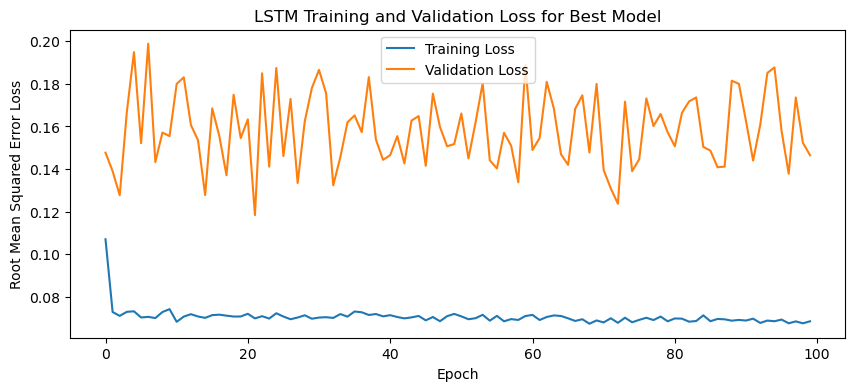

1/1 - 4s - loss: 0.0444 - 4s/epoch - 4s/step
Test Loss: 0.04444485157728195
1/1 [==============================] - 0s 33ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

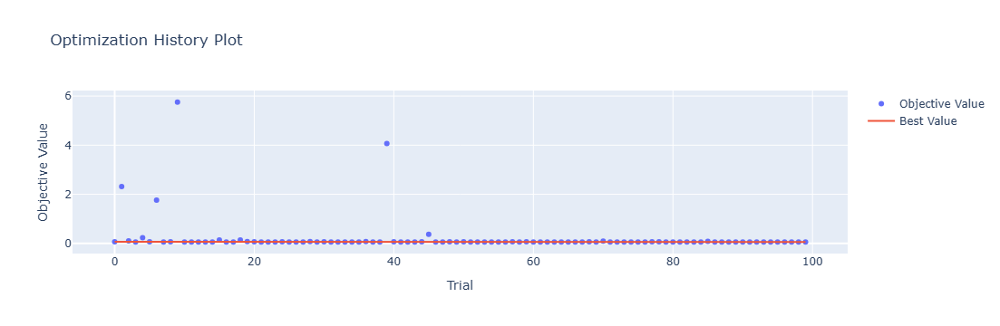

In [4]:
optuna.visualization.plot_optimization_history(study)

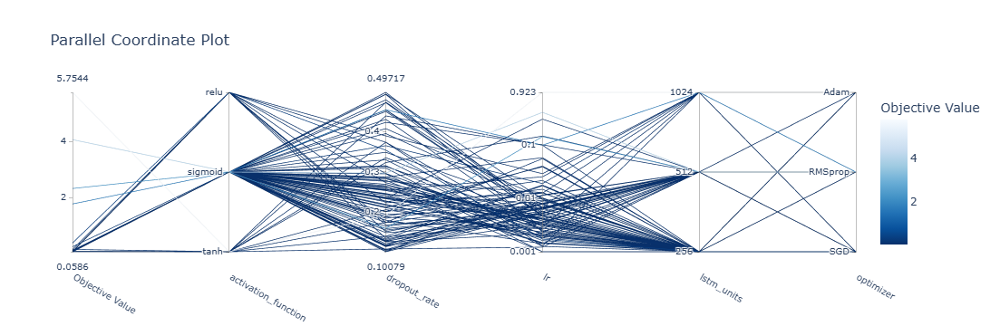

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

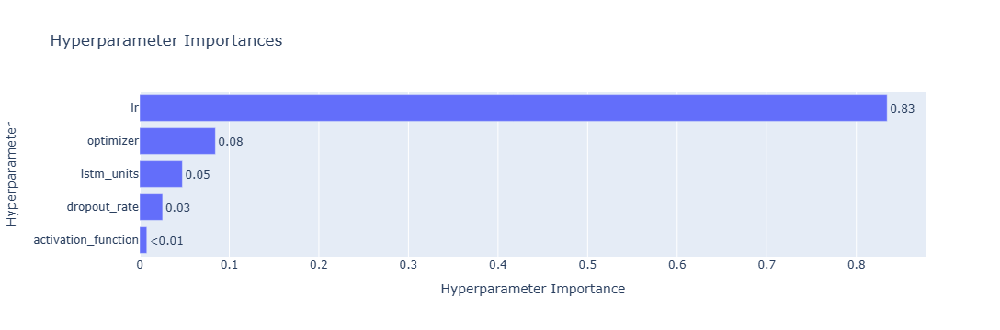

In [6]:
optuna.visualization.plot_param_importances(study)

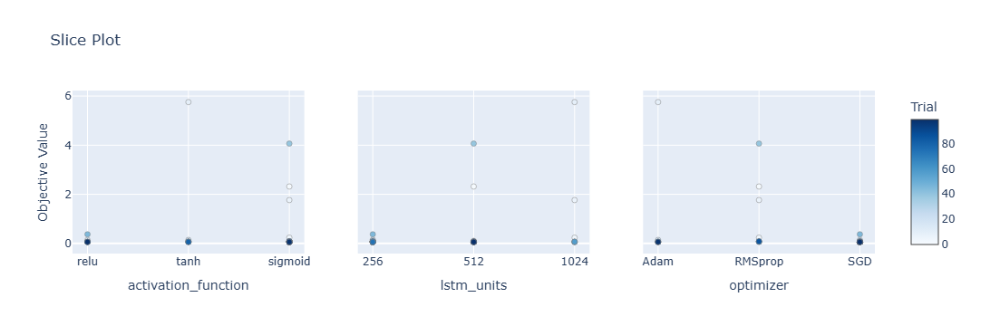

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

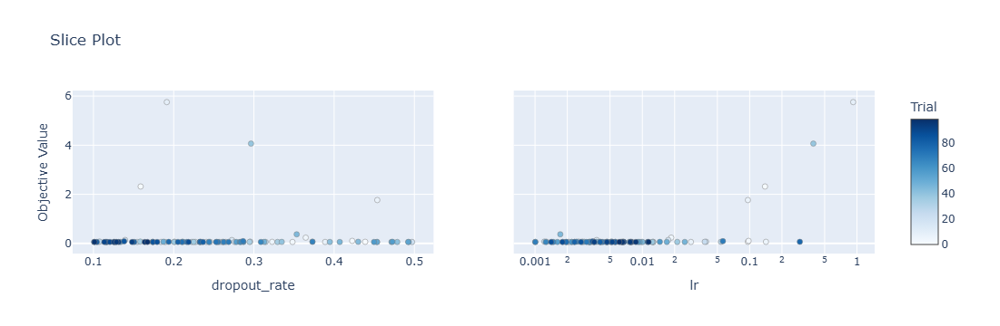

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 50s 404ms/step - loss: 0.1344 - accuracy: 0.6429 - mae: 0.1088 - rmse: 0.1344 - mape: 22.5633 - pearson: 0.6846 - val_loss: 0.0700 - val_accuracy: 0.4000 - val_mae: 0.0583 - val_rmse: 0.0700 - val_mape: 13.0434 - val_pearson: 0.8038
Epoch 2/100
84/84 [==============================] - 21s 248ms/step - loss: 0.0729 - accuracy: 0.6786 - mae: 0.0575 - rmse: 0.0729 - mape: 13.0339 - pearson: 0.7970 - val_loss: 0.0858 - val_accuracy: 0.6000 - val_mae: 0.0669 - val_rmse: 0.0858 - val_mape: 15.4914 - val_pearson: 0.7192
Epoch 3/100
84/84 [==============================] - 21s 256ms/step - loss: 0.0737 - accuracy: 0.7381 - mae: 0.0576 - rmse: 0.0737 - mape: 13.0119 - pearson: 0.7952

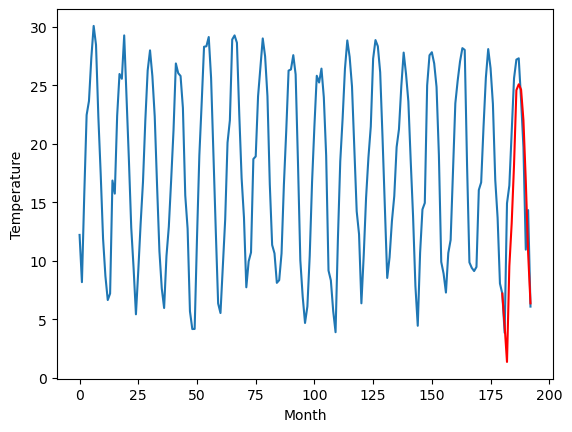

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		11.34		-1.53
12.78		8.28		-4.50
17.84		16.46		-1.38
19.24		20.15		0.91
23.26		25.14		1.88
26.74		31.50		4.76
27.96		31.99		4.03
28.30		31.54		3.24
26.17		28.92		2.75
23.54		23.76		0.22
18.03		17.56		-0.47
17.79		13.30		-4.49
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 11.341348669528962, 8.275449535846711, 16.45942284822464, 20.146725437641145, 25.136155388355256, 31.497462532520295, 31.99467047214508, 31.538435093164445, 28.924437872171403, 23.756076208353043, 17.56359039902687, 13.29681145310402]


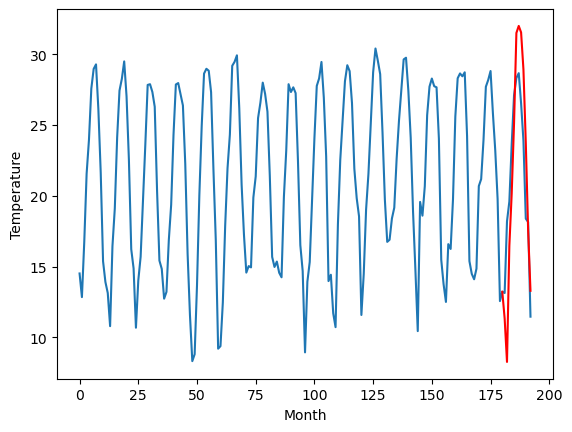

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		13.65		-1.69
16.20		10.58		-5.62
22.18		18.77		-3.41
23.82		22.46		-1.36
27.80		27.44		-0.36
31.94		33.80		1.86
33.70		34.30		0.60
33.98		33.84		-0.14
30.41		31.22		0.81
26.53		26.05		-0.48
18.17		19.86		1.69
20.35		15.58		-4.77
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 13.64722510099411, 10.582357127666473, 18.77335043668747, 22.456661899089813, 27.44093914747238, 33.799422938823696, 34.29704685926437, 33.8372972202301, 31.218799610137935, 26.05261518478393, 19.85721256256103, 15.584286231994625]


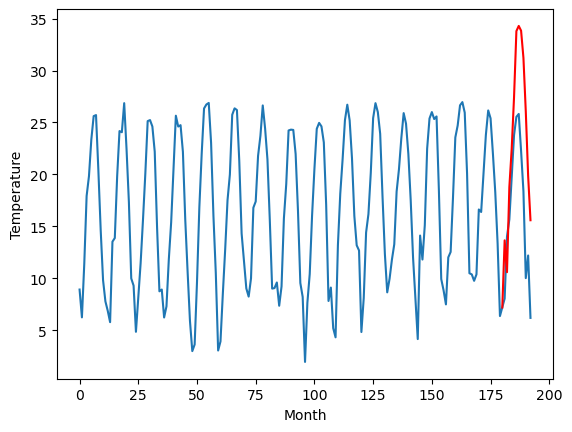

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		8.02		-0.98
7.43		4.97		-2.46
15.34		13.16		-2.18
17.13		16.84		-0.29
21.10		21.82		0.72
24.38		28.17		3.79
25.01		28.67		3.66
25.06		28.22		3.16
22.55		25.58		3.03
20.24		20.42		0.18
12.15		14.24		2.09
14.92		9.98		-4.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 8.024993870258331, 4.9707431530952455, 13.162998173236847, 16.842253897190094, 21.816487047672272, 28.165230486392975, 28.668230805397034, 28.21658695101738, 25.579232815504074, 20.41810667872429, 14.242189530134201, 9.980881336927414]


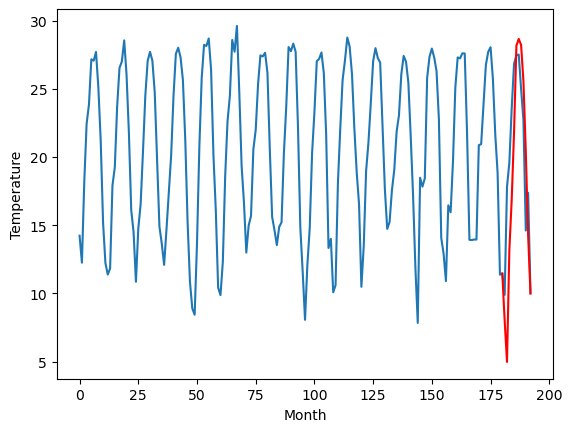

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		13.34		-0.01
10.26		10.29		0.03
20.16		18.49		-1.67
22.09		22.16		0.07
25.95		27.14		1.19
31.15		33.49		2.34
31.58		34.01		2.43
32.34		33.55		1.21
30.33		30.93		0.60
25.98		25.77		-0.21
18.41		19.58		1.17
20.74		15.32		-5.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 13.339486997127533, 10.292964379787445, 18.488708894252778, 22.157458941936493, 27.14397112607956, 33.492351691722874, 34.006975929737095, 33.54963878870011, 30.92505172967911, 25.76787571191788, 19.58301119089127, 15.315124552249912]


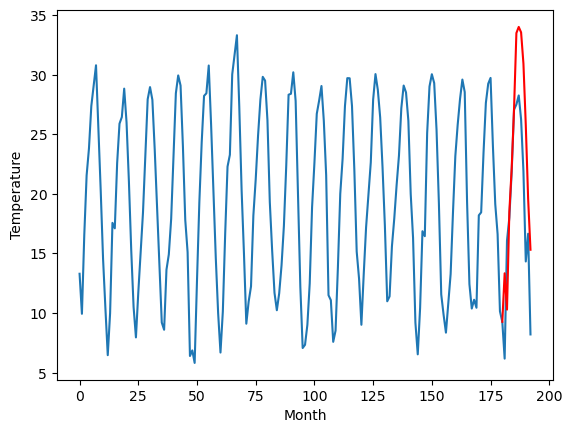

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		12.42		0.90
12.17		9.37		-2.80
17.07		17.56		0.49
20.44		21.24		0.80
23.95		26.22		2.27
28.52		32.57		4.05
30.51		33.08		2.57
30.99		32.62		1.63
27.98		30.00		2.02
24.38		24.85		0.47
16.21		18.66		2.45
17.26		14.39		-2.87
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 12.420833277702332, 9.369170594215394, 17.557059693336488, 21.23725335597992, 26.221850562095643, 32.57416932582855, 33.0837056517601, 32.624672192335126, 30.00391437411308, 24.851107138395307, 18.662426012754437, 14.388031023740766]


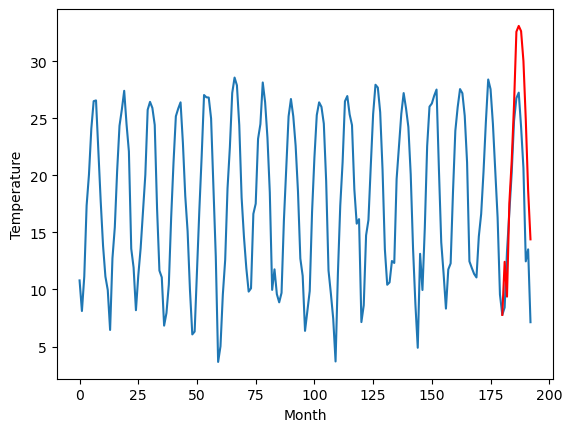

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		9.91		-0.30
10.85		6.86		-3.99
17.83		15.05		-2.78
18.86		18.73		-0.13
22.57		23.70		1.13
26.90		30.06		3.16
28.52		30.58		2.06
28.46		30.12		1.66
24.41		27.50		3.09
21.18		22.34		1.16
12.53		16.14		3.61
14.47		11.87		-2.60
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 9.912121453285216, 6.857726492881774, 15.046199240684508, 18.727991976737975, 23.704610743522643, 30.059696116447448, 30.576339461803435, 30.121330448389052, 27.49655384659767, 22.339676805734634, 16.1433538877964, 11.872465082406997]


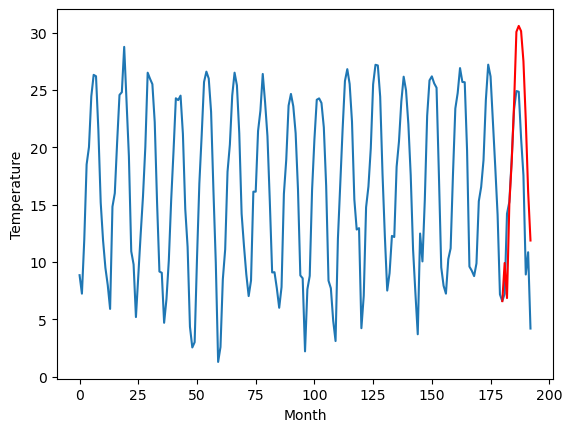

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		7.98		0.07
8.53		4.92		-3.61
15.05		13.11		-1.94
18.68		16.79		-1.89
21.70		21.77		0.07
26.49		28.12		1.63
28.61		28.64		0.03
28.56		28.19		-0.37
24.05		25.56		1.51
20.20		20.40		0.20
10.70		14.21		3.51
12.76		9.94		-2.82
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 7.975389516353607, 4.919183528423309, 13.112681186199188, 16.79330042600632, 21.767192161083223, 28.121280467510225, 28.641600942611696, 28.185251778364183, 25.557039564847948, 20.402824229002, 14.208214110136034, 9.939110106229784]


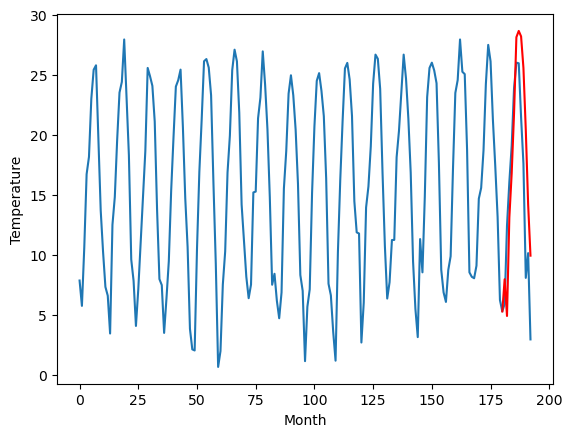

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		6.99		-0.09
2.81		3.93		1.12
15.28		12.13		-3.15
17.88		15.81		-2.07
22.57		20.79		-1.78
28.76		27.14		-1.62
29.33		27.66		-1.67
29.27		27.21		-2.06
25.53		24.59		-0.94
21.57		19.42		-2.15
11.53		13.22		1.69
13.33		8.95		-4.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 6.991509253978729, 3.932109887599945, 12.13171773672104, 15.809052283763886, 20.788571174144746, 27.13998919248581, 27.65967195749283, 27.205028886795045, 24.585190172195436, 19.420715684890748, 13.22115122795105, 8.948619241714479]


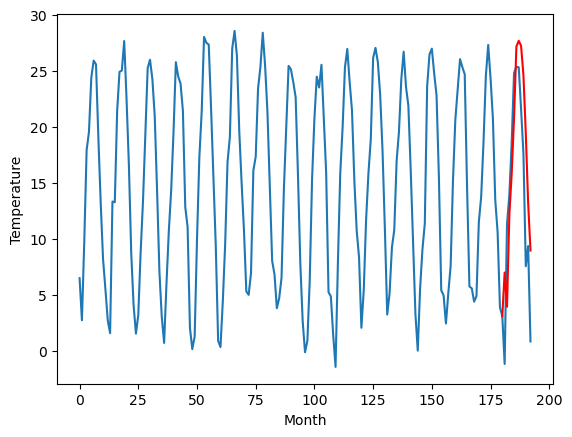

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		5.62		0.72
2.73		2.55		-0.18
13.48		10.75		-2.73
16.54		14.43		-2.11
21.01		19.42		-1.59
27.49		25.78		-1.71
28.50		26.31		-2.19
29.10		25.85		-3.25
25.24		23.24		-2.00
20.77		18.07		-2.70
10.11		11.86		1.75
11.34		7.59		-3.75
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 5.6176175379753115, 2.551916530132294, 10.75168555021286, 14.432950427532196, 19.422357013225557, 25.77936928510666, 26.305923631191256, 25.848898490667345, 23.2356713616848, 18.06925805449486, 11.859542211294176, 7.587108453512194]


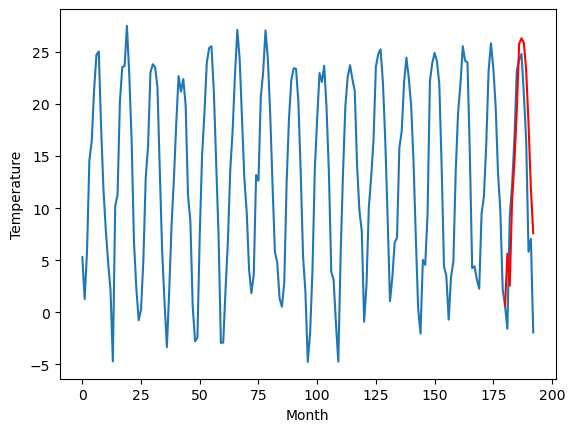

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		4.41		0.73
-0.63		1.33		1.96
11.10		9.53		-1.57
15.07		13.22		-1.85
20.22		18.22		-2.00
27.53		24.58		-2.95
28.12		25.11		-3.01
28.83		24.66		-4.17
24.78		22.05		-2.73
20.43		16.88		-3.55
9.57		10.66		1.09
8.67		6.39		-2.28
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 4.413494029045105, 1.3317402982711792, 9.529728808403014, 13.21862069606781, 18.215752520561217, 24.579000391960143, 25.11146483659744, 24.65811977624893, 22.051903584003448, 16.881253101825713, 10.664121010303496, 6.39170966386795]


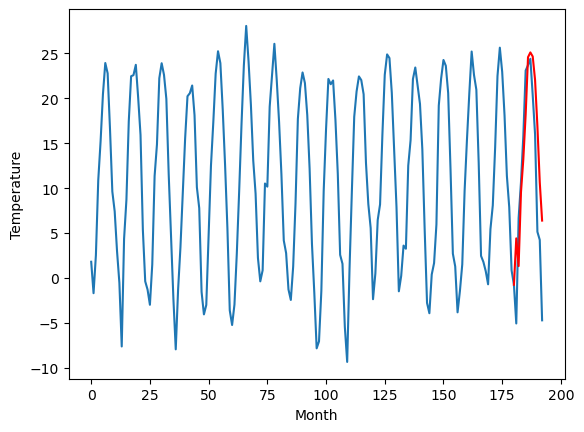

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   4.420821
1                 1   12.87  11.341349
2                 2   15.34  13.647225
3                 3    9.00   8.024994
4                 4   13.35  13.339487
5                 5   11.52  12.420833
6                 6   10.21   9.912121
7                 7    7.91   7.975390
8                 8    7.08   6.991509
9                 9    4.90   5.617618
10               10    3.68   4.413494


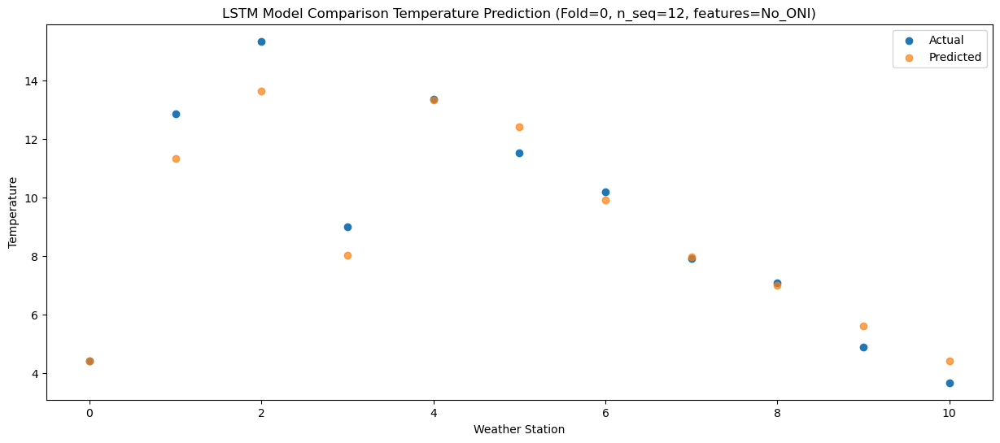

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   1.348935
1                 1   12.78   8.275450
2                 2   16.20  10.582357
3                 3    7.43   4.970743
4                 4   10.26  10.292964
5                 5   12.17   9.369171
6                 6   10.85   6.857726
7                 7    8.53   4.919184
8                 8    2.81   3.932110
9                 9    2.73   2.551917
10               10   -0.63   1.331740


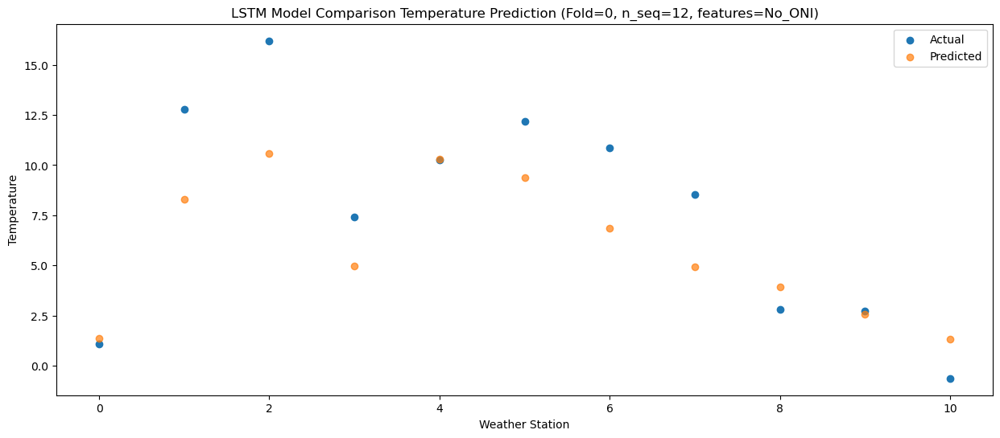

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15   9.531287
1                 1   17.84  16.459423
2                 2   22.18  18.773350
3                 3   15.34  13.162998
4                 4   20.16  18.488709
5                 5   17.07  17.557060
6                 6   17.83  15.046199
7                 7   15.05  13.112681
8                 8   15.28  12.131718
9                 9   13.48  10.751686
10               10   11.10   9.529729


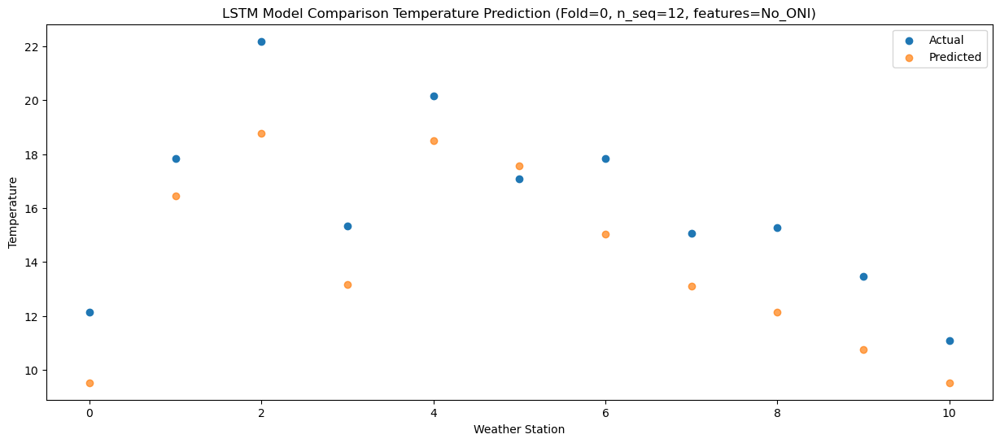

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  13.217917
1                 1   19.24  20.146725
2                 2   23.82  22.456662
3                 3   17.13  16.842254
4                 4   22.09  22.157459
5                 5   20.44  21.237253
6                 6   18.86  18.727992
7                 7   18.68  16.793300
8                 8   17.88  15.809052
9                 9   16.54  14.432950
10               10   15.07  13.218621


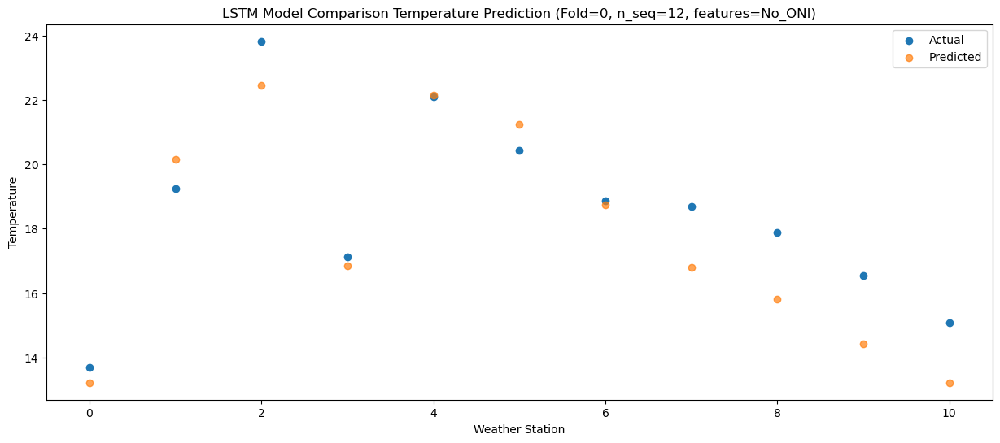

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  18.218957
1                 1   23.26  25.136155
2                 2   27.80  27.440939
3                 3   21.10  21.816487
4                 4   25.95  27.143971
5                 5   23.95  26.221851
6                 6   22.57  23.704611
7                 7   21.70  21.767192
8                 8   22.57  20.788571
9                 9   21.01  19.422357
10               10   20.22  18.215753


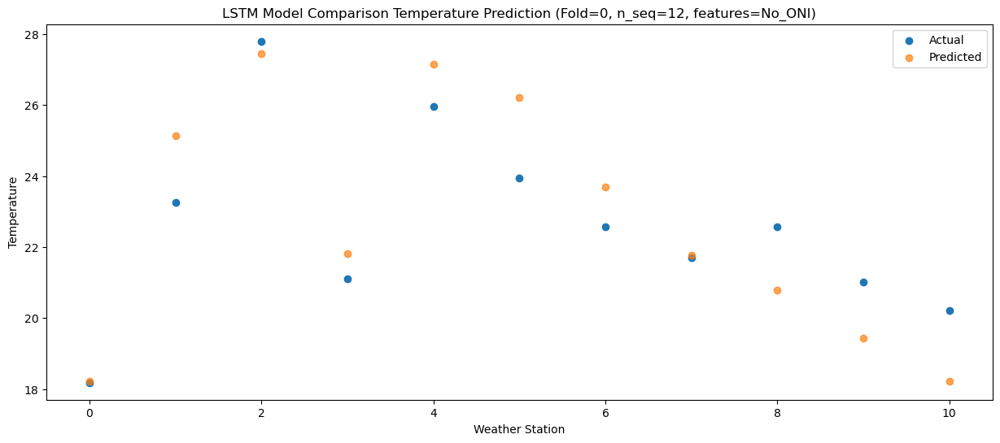

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  24.586328
1                 1   26.74  31.497463
2                 2   31.94  33.799423
3                 3   24.38  28.165230
4                 4   31.15  33.492352
5                 5   28.52  32.574169
6                 6   26.90  30.059696
7                 7   26.49  28.121280
8                 8   28.76  27.139989
9                 9   27.49  25.779369
10               10   27.53  24.579000


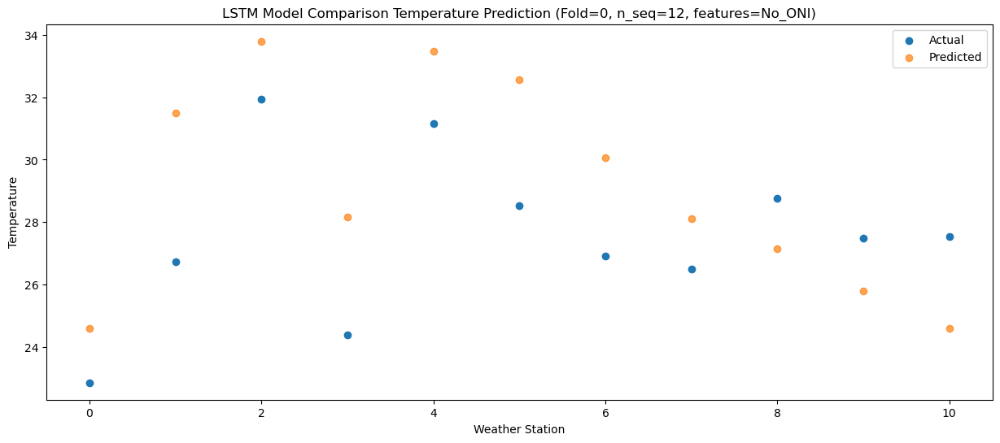

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.44  25.087868
1                 1   27.96  31.994670
2                 2   33.70  34.297047
3                 3   25.01  28.668231
4                 4   31.58  34.006976
5                 5   30.51  33.083706
6                 6   28.52  30.576339
7                 7   28.61  28.641601
8                 8   29.33  27.659672
9                 9   28.50  26.305924
10               10   28.12  25.111465


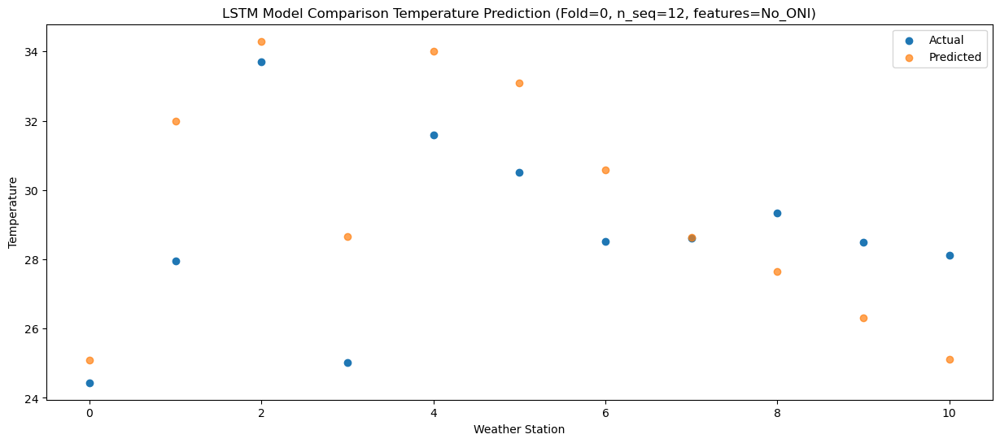

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.55  24.629015
1                 1   28.30  31.538435
2                 2   33.98  33.837297
3                 3   25.06  28.216587
4                 4   32.34  33.549639
5                 5   30.99  32.624672
6                 6   28.46  30.121330
7                 7   28.56  28.185252
8                 8   29.27  27.205029
9                 9   29.10  25.848898
10               10   28.83  24.658120


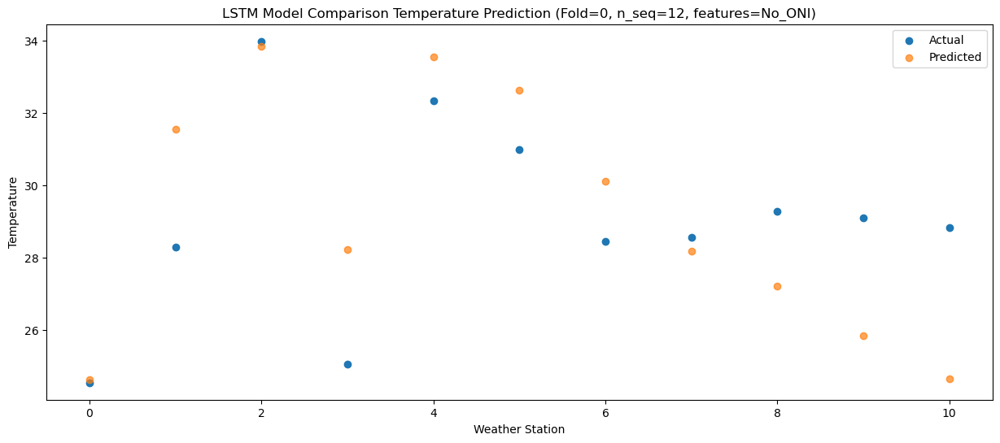

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   20.97  22.019257
1                 1   26.17  28.924438
2                 2   30.41  31.218800
3                 3   22.55  25.579233
4                 4   30.33  30.925052
5                 5   27.98  30.003914
6                 6   24.41  27.496554
7                 7   24.05  25.557040
8                 8   25.53  24.585190
9                 9   25.24  23.235671
10               10   24.78  22.051904


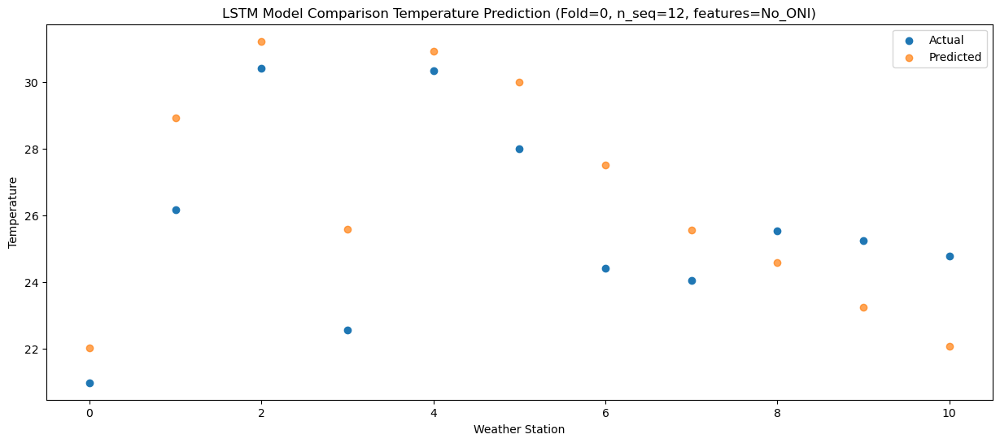

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.95  16.840056
1                 1   23.54  23.756076
2                 2   26.53  26.052615
3                 3   20.24  20.418107
4                 4   25.98  25.767876
5                 5   24.38  24.851107
6                 6   21.18  22.339677
7                 7   20.20  20.402824
8                 8   21.57  19.420716
9                 9   20.77  18.069258
10               10   20.43  16.881253


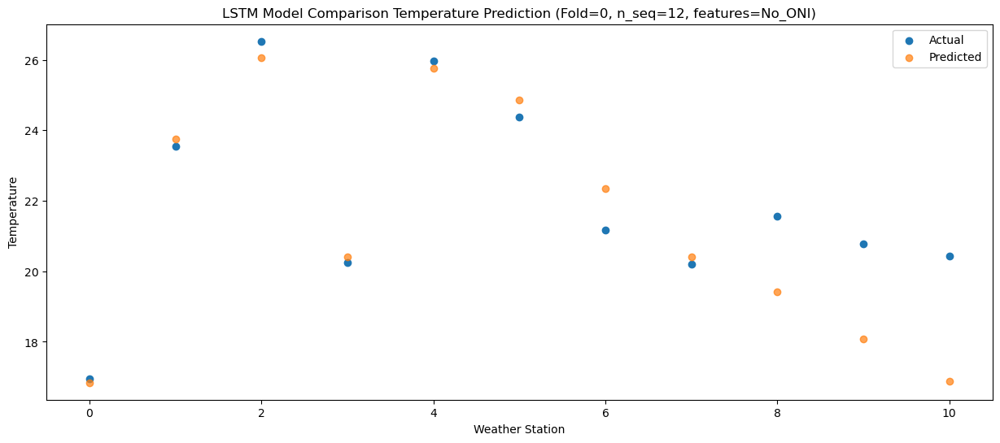

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    8.19  10.633325
1                 1   18.03  17.563590
2                 2   18.17  19.857213
3                 3   12.15  14.242190
4                 4   18.41  19.583011
5                 5   16.21  18.662426
6                 6   12.53  16.143354
7                 7   10.70  14.208214
8                 8   11.53  13.221151
9                 9   10.11  11.859542
10               10    9.57  10.664121


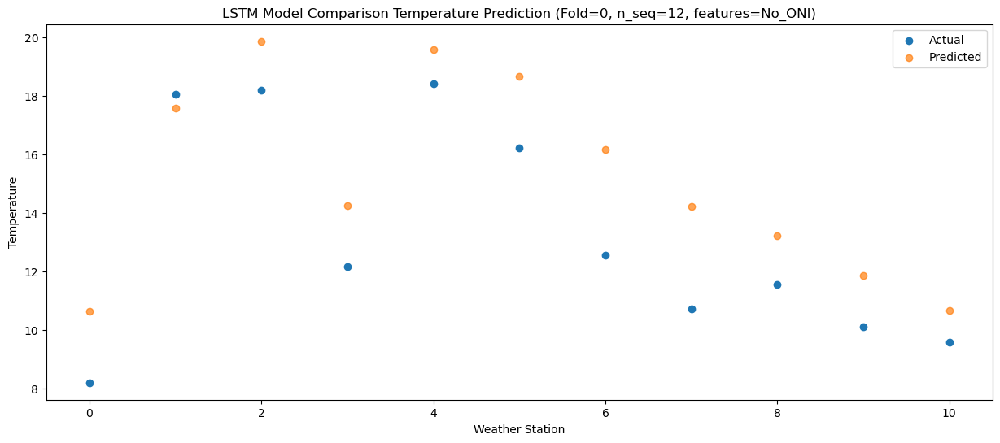

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   11.57   6.360297
1                 1   17.79  13.296811
2                 2   20.35  15.584286
3                 3   14.92   9.980881
4                 4   20.74  15.315125
5                 5   17.26  14.388031
6                 6   14.47  11.872465
7                 7   12.76   9.939110
8                 8   13.33   8.948619
9                 9   11.34   7.587108
10               10    8.67   6.391710


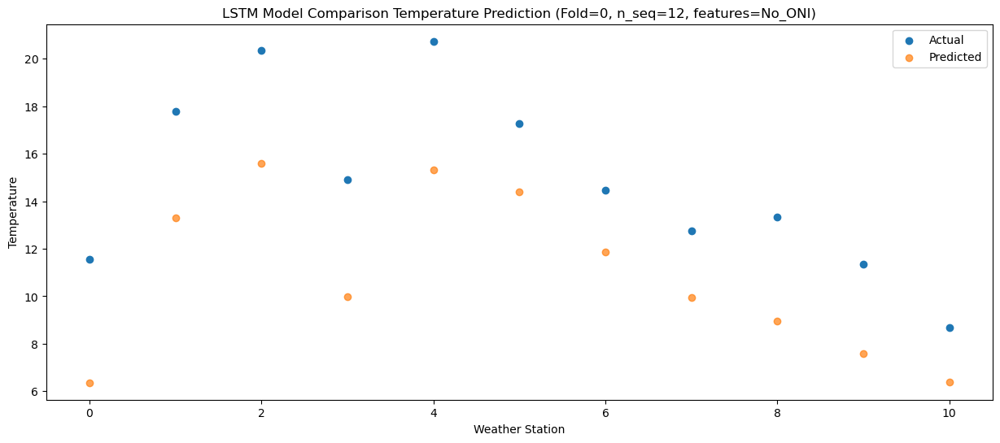

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]
 [24.44 27.96 33.7  25.01 31.58 30.51 28.52 28.61 29.33 28.5  28.12]
 [24.55 28.3  33.98 25.06 32.34 30.99 28.46 28.56 29.27 29.1  28.83]
 [20.97 26.17 30.41 22.55 30.33 27.98 24.41 24.05 25.53 25.24 24.78]
 [16.95 23.54 26.53 20.24 25.98 24.38 21.18 20.2  21.57 20.77 20.43]
 [ 8.19 18.03 18.17 12.15 18.41 16.21 12.53 10.7  11.53 10.11  9.57]
 [11.57 17.79 20.35 14.92 20.74 17.26 14.47 12.76 13.33 11.34  8.67]]
[[ 4.42082081 11.34134867 13.6472251   8.02499387 13.339487   12.42083328
   9.91212145  7.97538952  6.99150925  5.61761754  4.41349403]
 [ 1.34893499  8.27544954 10

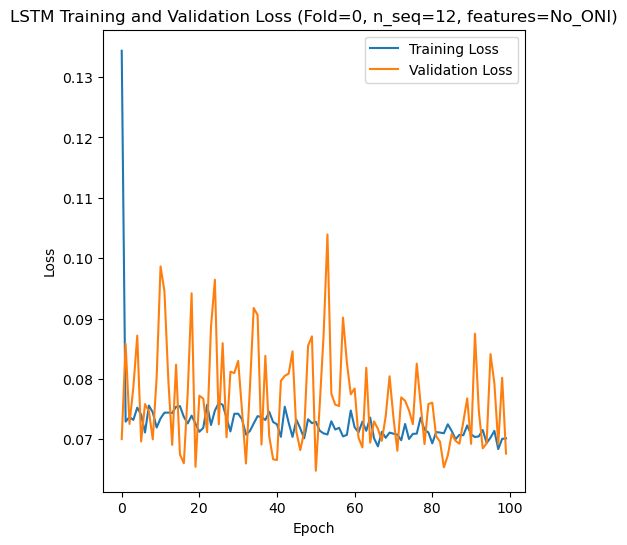

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 43s 358ms/step - loss: 0.1494 - accuracy: 0.5476 - mae: 0.1178 - rmse: 0.1494 - mape: 24.8757 - pearson: 0.6721 - val_loss: 0.0794 - val_accuracy: 0.8000 - val_mae: 0.0649 - val_rmse: 0.0794 - val_mape: 15.3303 - val_pearson: 0.7878
Epoch 2/100
84/84 [==============================] - 22s 267ms/step - loss: 0.0723 - accuracy: 0.6667 - mae: 0.0563 - rmse: 0.0723 - mape: 12.6855 - pearson: 0.8015 - val_loss: 0.0737 - val_accuracy: 0.8000 - val_mae: 0.0566 - val_rmse: 0.0737 - val_mape: 12.7216 - val_pearson: 0.8203
Epoch 3/100
84/84 [==============================] - 22s 261ms/step - loss: 0.0742 - accuracy: 0.6667 - mae: 0.0578 - rmse: 0.0742 - mape: 12.8939 - pearson: 0.7962

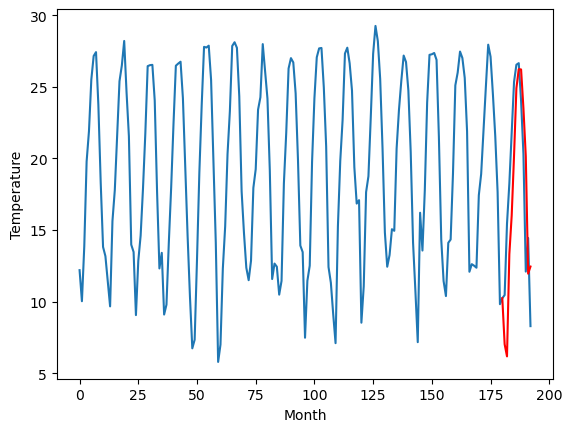

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		11.26		-0.74
12.66		10.42		-2.24
19.43		17.55		-1.88
21.57		20.26		-1.31
25.30		24.45		-0.85
29.44		29.16		-0.28
30.82		30.49		-0.33
31.09		30.46		-0.63
27.35		27.74		0.39
23.57		24.40		0.83
15.91		16.19		0.28
17.54		16.69		-0.85
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 11.264664006233215, 10.421273124217986, 17.551360976696014, 20.264320027828216, 24.45184291601181, 29.158471238613128, 30.49101687669754, 30.46126317307353, 27.74080704972148, 24.40409135147929, 16.19396065995097, 16.693554305285215]


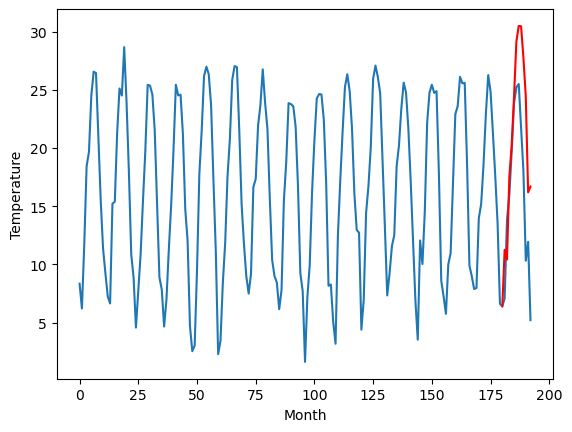

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		7.41		-1.36
9.26		6.58		-2.68
16.32		13.70		-2.62
17.72		16.41		-1.31
21.84		20.61		-1.23
25.72		25.31		-0.41
26.49		26.65		0.16
27.15		26.62		-0.53
24.13		23.89		-0.24
20.35		20.56		0.21
12.61		12.35		-0.26
15.21		12.85		-2.36
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 7.412472403049469, 6.580148375034332, 13.702745592594146, 16.41453663110733, 20.609094297885896, 25.31311241388321, 26.647127544879915, 26.61641108468175, 23.892044181376697, 20.558477038890125, 12.352319354563953, 12.849562848359348]


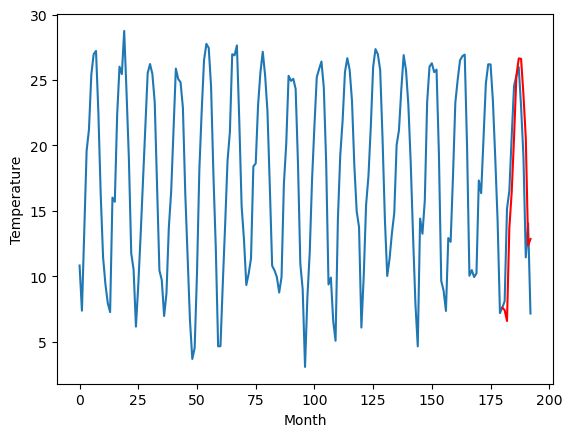

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		9.87		-0.85
9.13		9.04		-0.09
16.50		16.16		-0.34
18.84		18.86		0.02
22.73		23.05		0.32
26.62		27.75		1.13
26.50		29.09		2.59
27.47		29.06		1.59
24.46		26.34		1.88
21.77		22.99		1.22
14.61		14.79		0.18
17.98		15.28		-2.70
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 9.873552210330963, 9.038393683433533, 16.163425154685974, 18.860958762168885, 23.052913851737976, 27.75425691127777, 29.087297625541687, 29.063240226060152, 26.33549779251218, 22.98913877800107, 14.788411315232516, 15.28397976949811]


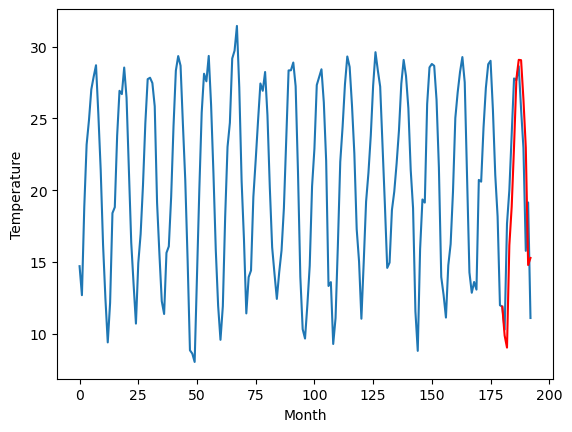

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		13.76		-0.94
13.00		12.93		-0.07
20.61		20.05		-0.56
22.91		22.74		-0.17
27.03		26.93		-0.10
30.50		31.63		1.13
30.59		32.96		2.37
31.56		32.94		1.38
27.98		30.21		2.23
24.94		26.86		1.92
17.39		18.66		1.27
21.27		19.16		-2.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 13.764925918579102, 12.931517801284791, 20.054537496566773, 22.744212350845338, 26.934026918411256, 31.63276120185852, 32.961798152923585, 32.93565282508731, 30.20683417007327, 26.862923237532378, 18.663676830977202, 19.157153460234404]


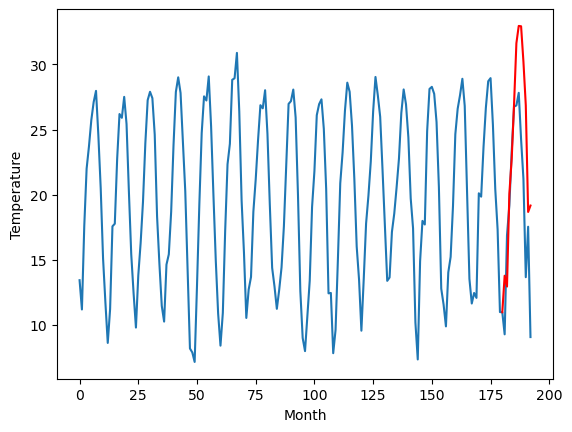

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		12.48		0.57
12.29		11.63		-0.66
19.63		18.75		-0.88
21.90		21.44		-0.46
27.49		25.63		-1.86
31.76		30.33		-1.43
31.10		31.66		0.56
30.51		31.63		1.12
30.15		28.91		-1.24
25.83		25.56		-0.27
19.36		17.38		-1.98
19.62		17.87		-1.75
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 12.483001692295074, 11.62877593755722, 18.749500615596773, 21.44399915456772, 25.633369309902193, 30.328296048641207, 31.658810479640962, 31.629776885807516, 28.908689668476583, 25.563580205738546, 17.378221204578878, 17.86613067060709]


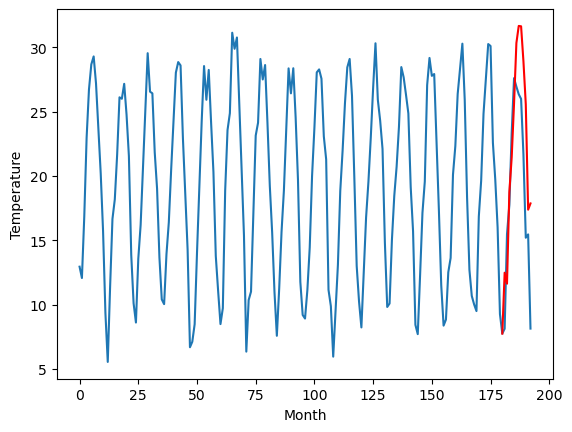

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		12.02		-0.73
13.53		11.17		-2.36
19.81		18.28		-1.53
22.38		20.98		-1.40
26.15		25.18		-0.97
30.16		29.87		-0.29
31.52		31.21		-0.31
31.78		31.18		-0.60
28.45		28.46		0.01
24.50		25.12		0.62
16.90		16.92		0.02
18.42		17.42		-1.00
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 12.0152197599411, 11.165132653713226, 18.280190122127532, 20.982128512859344, 25.1779035449028, 29.872387778759002, 31.20766509771347, 31.180883803218602, 28.462928452342748, 25.12351123318076, 16.9199990414083, 17.42025802358985]


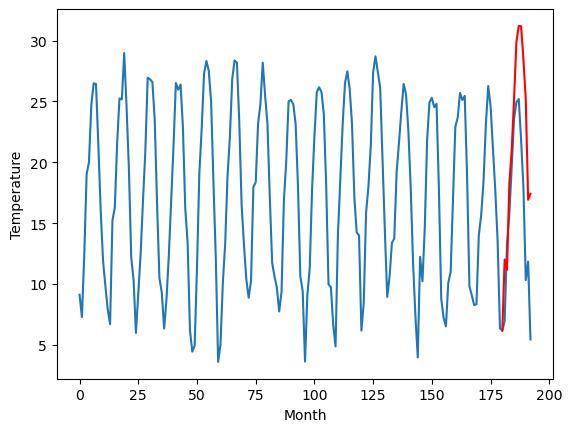

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		8.18		-0.63
5.81		7.34		1.53
17.13		14.45		-2.68
18.84		17.16		-1.68
23.50		21.35		-2.15
29.58		26.05		-3.53
30.57		27.38		-3.19
31.79		27.35		-4.44
28.08		24.62		-3.46
22.88		21.28		-1.60
13.58		13.09		-0.49
15.99		13.58		-2.41
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 8.181658322811126, 7.335645313262939, 14.454297657012939, 17.155719394683835, 21.349030609130857, 26.045720214843747, 27.37682950019836, 27.346692259311673, 24.619953567981717, 21.279475862979886, 13.086653406620023, 13.58338030695915]


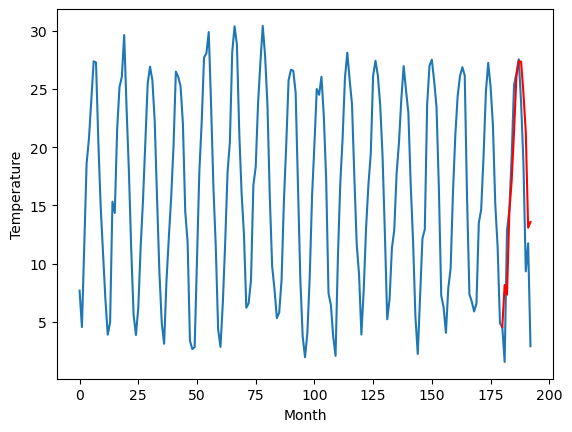

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		6.75		-0.59
2.56		5.89		3.33
15.12		13.01		-2.11
16.92		15.70		-1.22
21.73		19.89		-1.84
27.76		24.58		-3.18
29.27		25.91		-3.36
29.66		25.88		-3.78
27.15		23.15		-4.00
20.90		19.81		-1.09
13.15		11.62		-1.53
12.34		12.11		-0.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 6.750851156711579, 5.886500778198243, 13.006933631896974, 15.697455825805665, 19.889567317962648, 24.579830589294435, 25.91242319583893, 25.878611045479776, 23.15499063074589, 19.81001134455204, 11.623650985360147, 12.111996816992761]


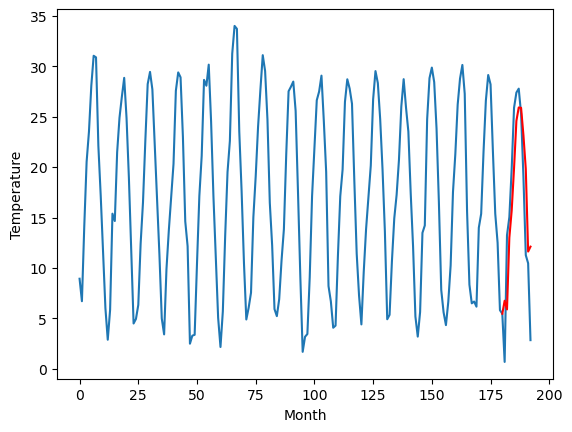

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		7.99		-1.05
4.67		7.12		2.45
15.38		14.24		-1.14
19.14		16.93		-2.21
23.69		21.12		-2.57
30.80		25.81		-4.99
31.47		27.15		-4.32
31.32		27.11		-4.21
29.37		24.40		-4.97
21.93		21.05		-0.88
15.68		12.87		-2.81
14.07		13.35		-0.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 7.994394950866699, 7.1180453824996945, 14.244299941062927, 16.934509091377258, 21.12373047351837, 25.813805871009826, 27.151730709075927, 27.113789666742086, 24.395570148080587, 21.051918376535177, 12.870280612558126, 13.3528479526937]


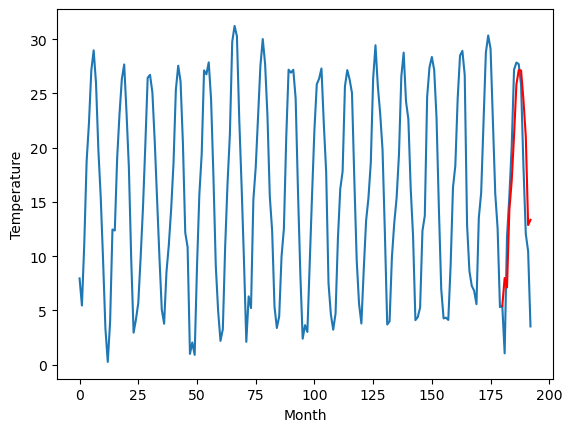

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		7.02		0.90
5.16		6.15		0.99
12.38		13.27		0.89
17.03		15.97		-1.06
21.57		20.17		-1.40
27.66		24.87		-2.79
29.89		26.21		-3.68
29.67		26.17		-3.50
25.97		23.45		-2.52
21.55		20.11		-1.44
12.23		11.90		-0.33
11.46		12.41		0.95
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 7.022471389770508, 6.150403342247009, 13.266239485740662, 15.974660716056825, 20.17348035335541, 24.872154078483582, 26.207734665870667, 26.174724812656642, 23.450653309971095, 20.10632061496377, 11.90240501895547, 12.407289917618037]


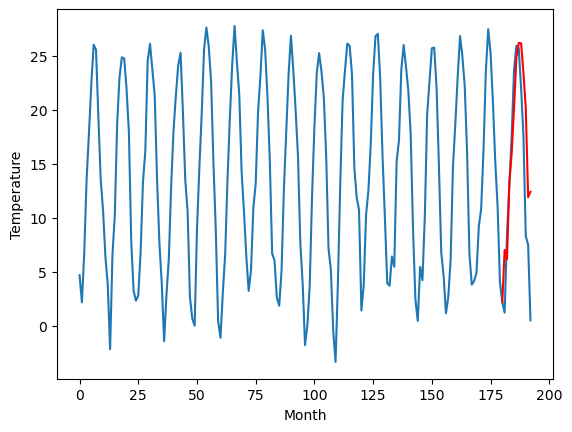

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   7.022714
1                 1   12.00  11.264664
2                 2    8.77   7.412472
3                 3   10.72   9.873552
4                 4   14.70  13.764926
5                 5   11.91  12.483002
6                 6   12.75  12.015220
7                 7    8.81   8.181658
8                 8    7.34   6.750851
9                 9    9.04   7.994395
10               10    6.12   7.022471


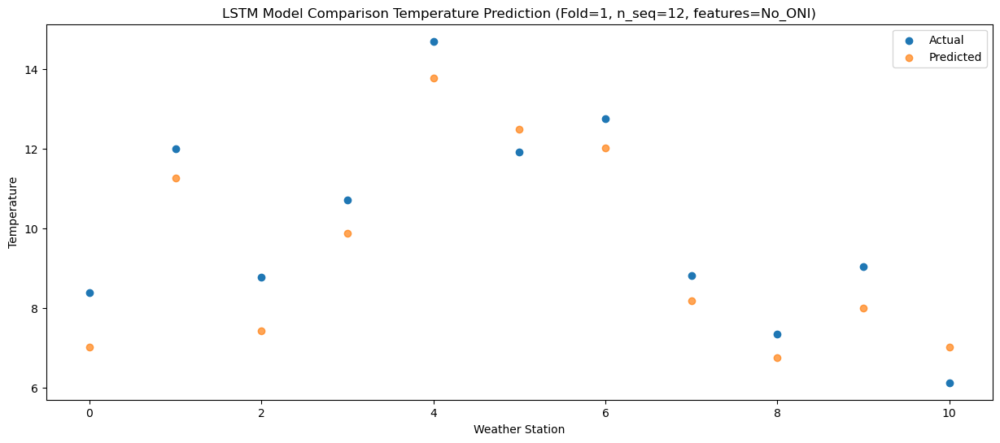

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   6.177222
1                 1   12.66  10.421273
2                 2    9.26   6.580148
3                 3    9.13   9.038394
4                 4   13.00  12.931518
5                 5   12.29  11.628776
6                 6   13.53  11.165133
7                 7    5.81   7.335645
8                 8    2.56   5.886501
9                 9    4.67   7.118045
10               10    5.16   6.150403


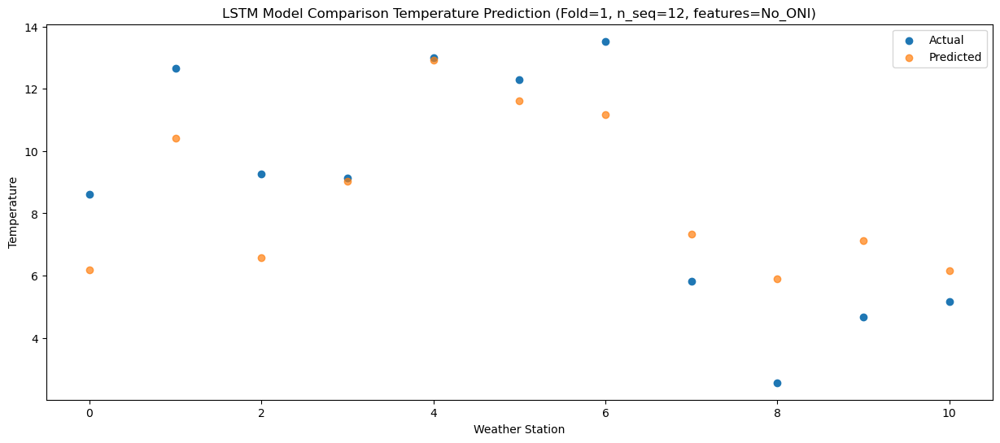

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  13.309039
1                 1   19.43  17.551361
2                 2   16.32  13.702746
3                 3   16.50  16.163425
4                 4   20.61  20.054537
5                 5   19.63  18.749501
6                 6   19.81  18.280190
7                 7   17.13  14.454298
8                 8   15.12  13.006934
9                 9   15.38  14.244300
10               10   12.38  13.266239


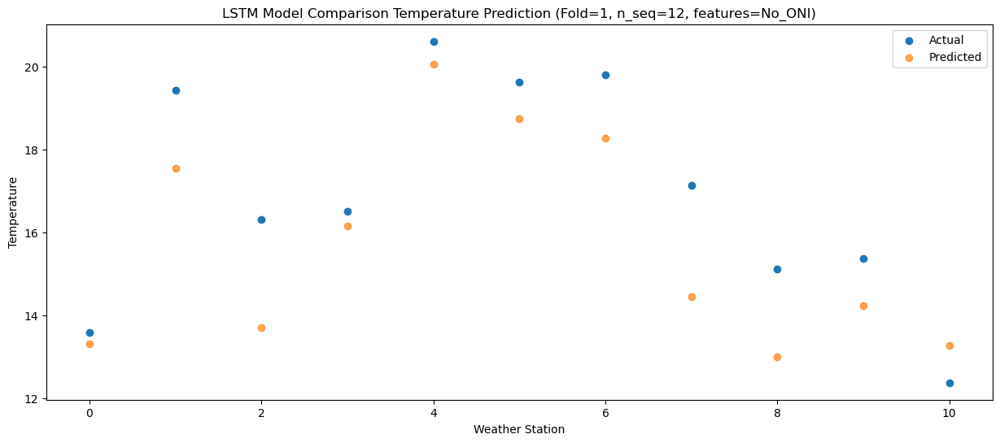

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  16.018212
1                 1   21.57  20.264320
2                 2   17.72  16.414537
3                 3   18.84  18.860959
4                 4   22.91  22.744212
5                 5   21.90  21.443999
6                 6   22.38  20.982129
7                 7   18.84  17.155719
8                 8   16.92  15.697456
9                 9   19.14  16.934509
10               10   17.03  15.974661


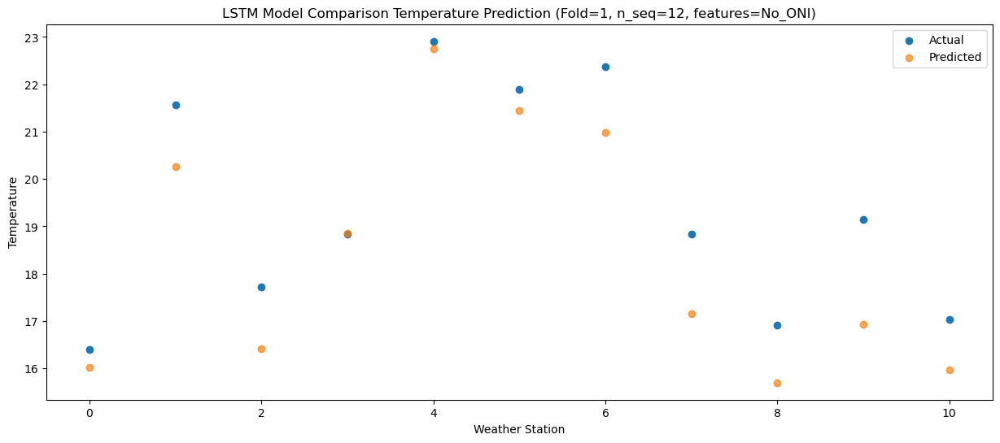

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  20.200152
1                 1   25.30  24.451843
2                 2   21.84  20.609094
3                 3   22.73  23.052914
4                 4   27.03  26.934027
5                 5   27.49  25.633369
6                 6   26.15  25.177904
7                 7   23.50  21.349031
8                 8   21.73  19.889567
9                 9   23.69  21.123730
10               10   21.57  20.173480


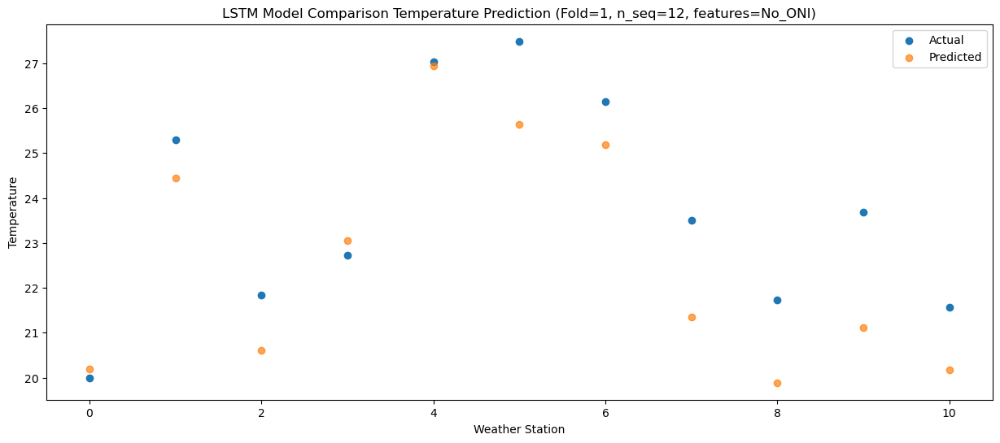

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  24.903738
1                 1   29.44  29.158471
2                 2   25.72  25.313112
3                 3   26.62  27.754257
4                 4   30.50  31.632761
5                 5   31.76  30.328296
6                 6   30.16  29.872388
7                 7   29.58  26.045720
8                 8   27.76  24.579831
9                 9   30.80  25.813806
10               10   27.66  24.872154


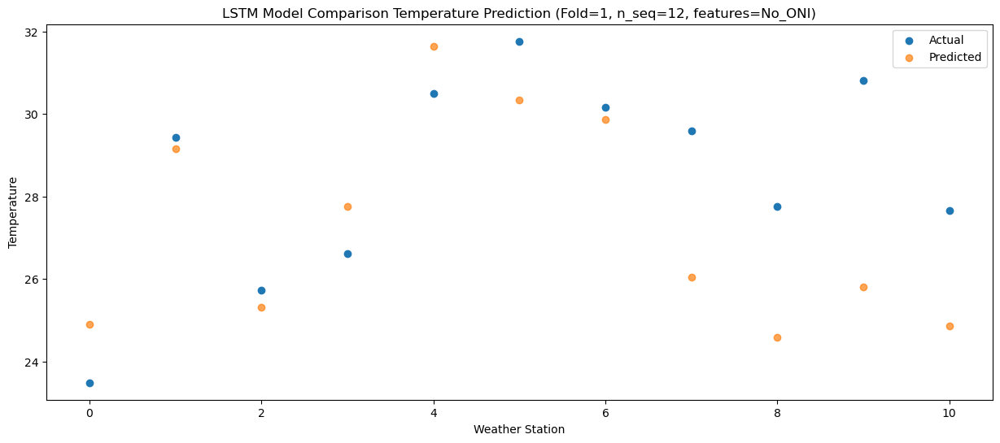

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.69  26.240277
1                 1   30.82  30.491017
2                 2   26.49  26.647128
3                 3   26.50  29.087298
4                 4   30.59  32.961798
5                 5   31.10  31.658810
6                 6   31.52  31.207665
7                 7   30.57  27.376830
8                 8   29.27  25.912423
9                 9   31.47  27.151731
10               10   29.89  26.207735


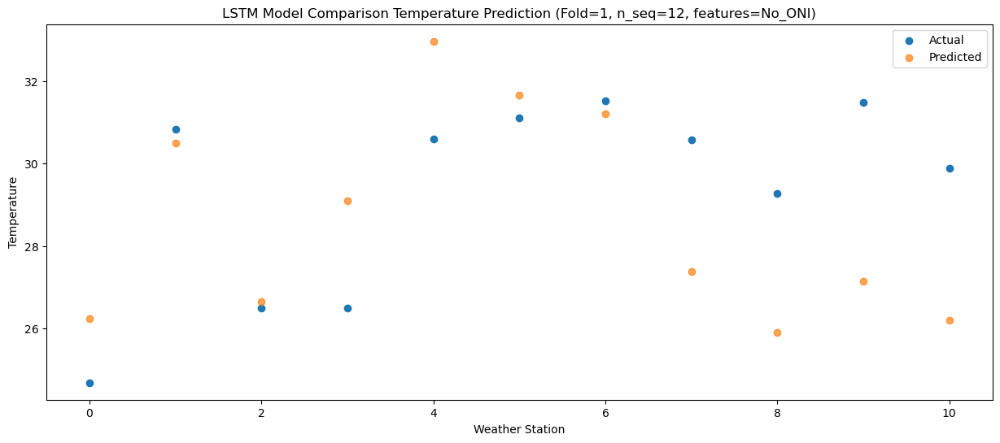

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.80  26.218658
1                 1   31.09  30.461263
2                 2   27.15  26.616411
3                 3   27.47  29.063240
4                 4   31.56  32.935653
5                 5   30.51  31.629777
6                 6   31.78  31.180884
7                 7   31.79  27.346692
8                 8   29.66  25.878611
9                 9   31.32  27.113790
10               10   29.67  26.174725


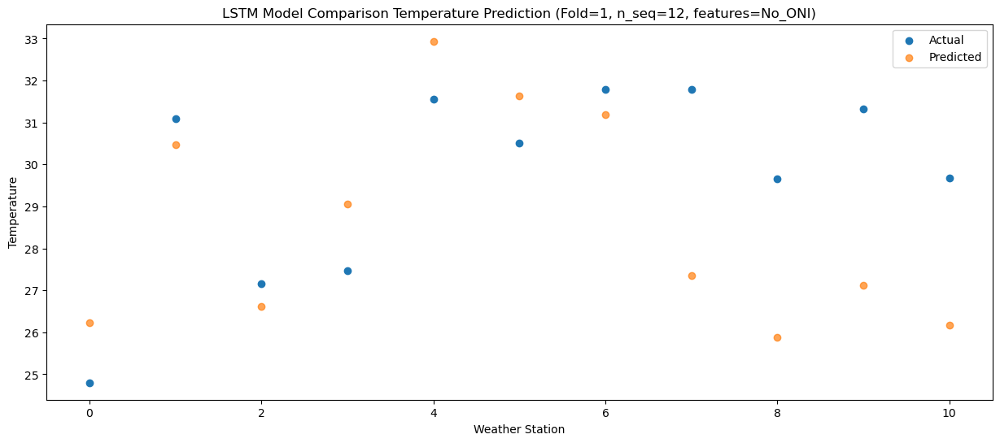

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   22.15  23.498872
1                 1   27.35  27.740807
2                 2   24.13  23.892044
3                 3   24.46  26.335498
4                 4   27.98  30.206834
5                 5   30.15  28.908690
6                 6   28.45  28.462928
7                 7   28.08  24.619954
8                 8   27.15  23.154991
9                 9   29.37  24.395570
10               10   25.97  23.450653


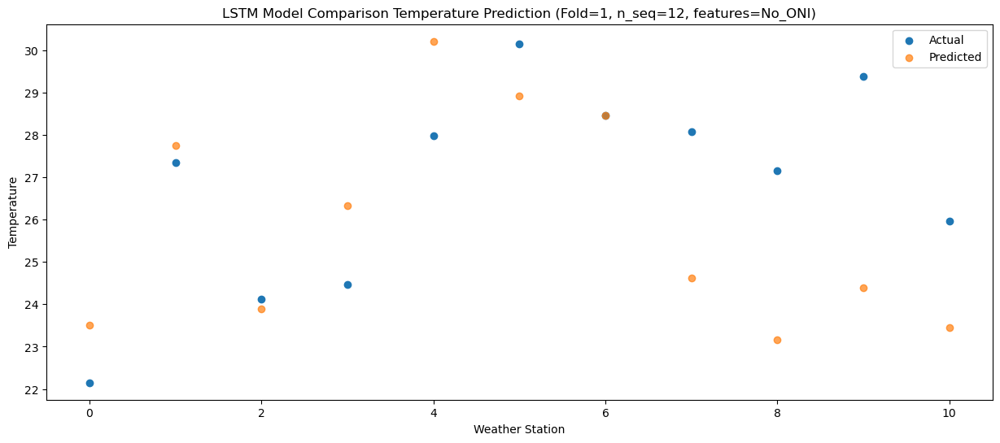

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   18.45  20.158446
1                 1   23.57  24.404091
2                 2   20.35  20.558477
3                 3   21.77  22.989139
4                 4   24.94  26.862923
5                 5   25.83  25.563580
6                 6   24.50  25.123511
7                 7   22.88  21.279476
8                 8   20.90  19.810011
9                 9   21.93  21.051918
10               10   21.55  20.106321


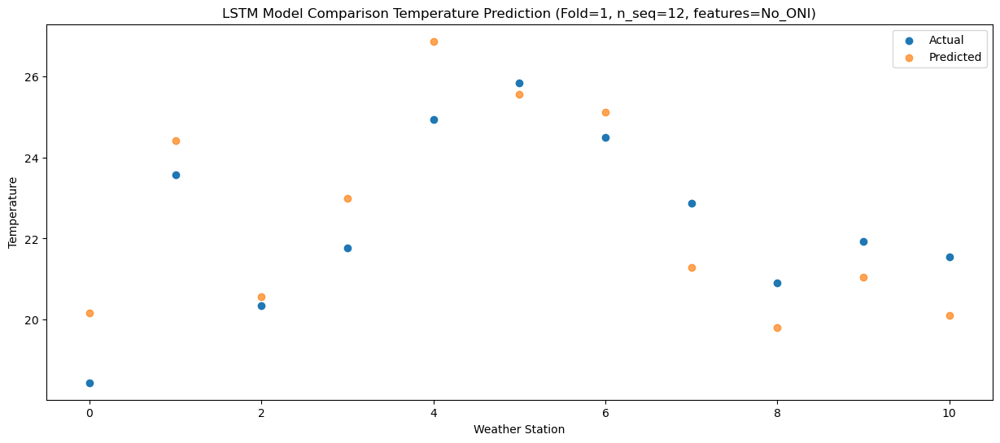

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   10.24  11.954853
1                 1   15.91  16.193961
2                 2   12.61  12.352319
3                 3   14.61  14.788411
4                 4   17.39  18.663677
5                 5   19.36  17.378221
6                 6   16.90  16.919999
7                 7   13.58  13.086653
8                 8   13.15  11.623651
9                 9   15.68  12.870281
10               10   12.23  11.902405


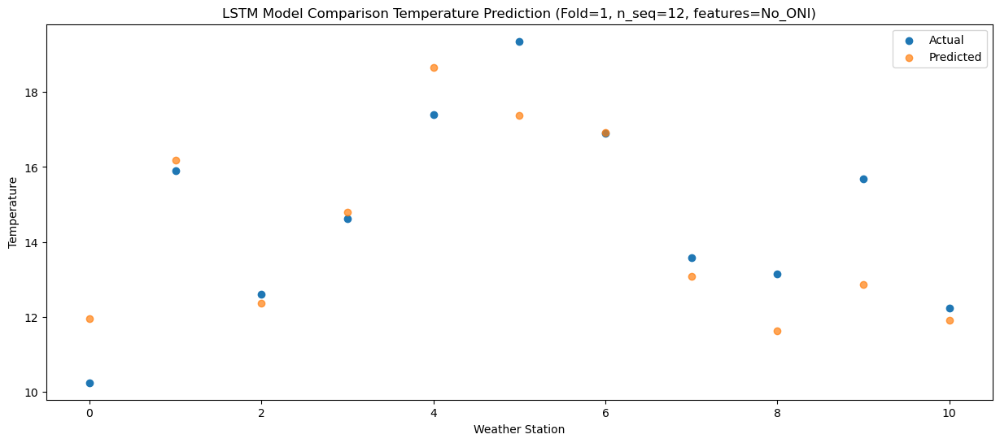

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   12.59  12.452081
1                 1   17.54  16.693554
2                 2   15.21  12.849563
3                 3   17.98  15.283980
4                 4   21.27  19.157153
5                 5   19.62  17.866131
6                 6   18.42  17.420258
7                 7   15.99  13.583380
8                 8   12.34  12.111997
9                 9   14.07  13.352848
10               10   11.46  12.407290


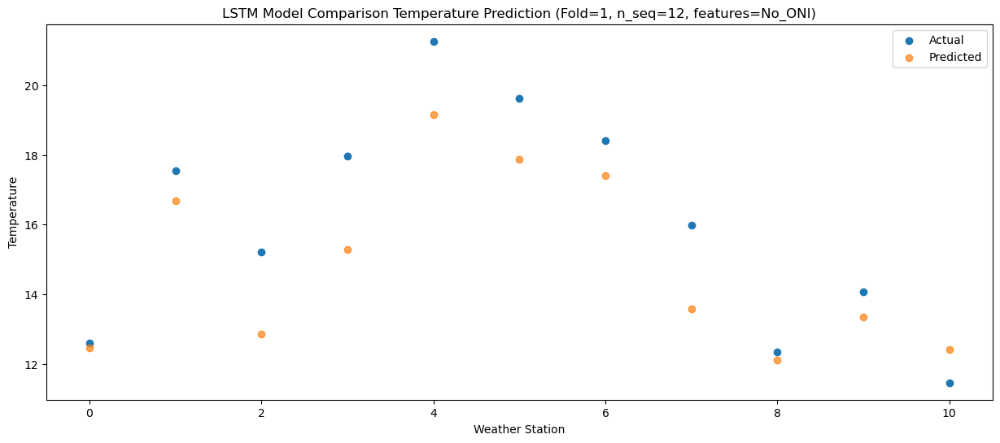

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]
 [24.69 30.82 26.49 26.5  30.59 31.1  31.52 30.57 29.27 31.47 29.89]
 [24.8  31.09 27.15 27.47 31.56 30.51 31.78 31.79 29.66 31.32 29.67]
 [22.15 27.35 24.13 24.46 27.98 30.15 28.45 28.08 27.15 29.37 25.97]
 [18.45 23.57 20.35 21.77 24.94 25.83 24.5  22.88 20.9  21.93 21.55]
 [10.24 15.91 12.61 14.61 17.39 19.36 16.9  13.58 13.15 15.68 12.23]
 [12.59 17.54 15.21 17.98 21.27 19.62 18.42 15.99 12.34 14.07 11.46]]
[[ 7.02271404 11.26466401  7.4124724   9.87355221 13.76492592 12.48300169
  12.01521976  8.18165832  6.75085116  7.99439495  7.02247139]
 [ 6.17722156 10.42127312  6

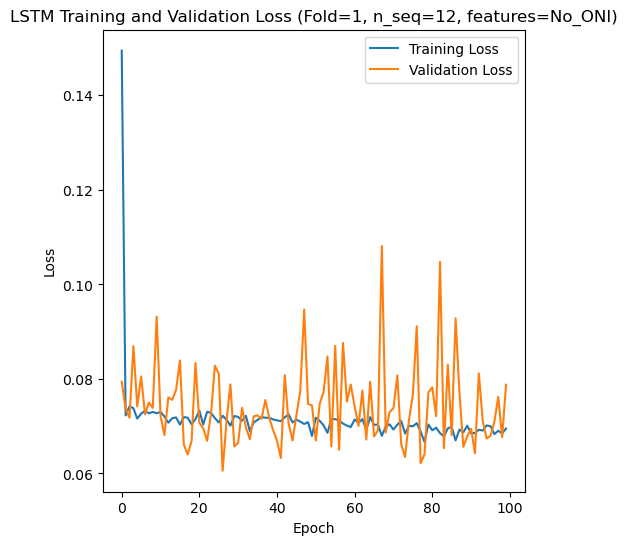

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 44s 356ms/step - loss: 0.1406 - accuracy: 0.6548 - mae: 0.1202 - rmse: 0.1406 - mape: 25.8124 - pearson: 0.6813 - val_loss: 0.0732 - val_accuracy: 0.9000 - val_mae: 0.0584 - val_rmse: 0.0732 - val_mape: 14.4006 - val_pearson: 0.8204
Epoch 2/100
84/84 [==============================] - 22s 260ms/step - loss: 0.0752 - accuracy: 0.6905 - mae: 0.0588 - rmse: 0.0752 - mape: 13.2107 - pearson: 0.7931 - val_loss: 0.0495 - val_accuracy: 0.9000 - val_mae: 0.0377 - val_rmse: 0.0495 - val_mape: 8.0562 - val_pearson: 0.9294
Epoch 3/100
84/84 [==============================] - 23s 276ms/step - loss: 0.0758 - accuracy: 0.7024 - mae: 0.0596 - rmse: 0.0758 - mape: 13.4295 - pearson: 0.7943 

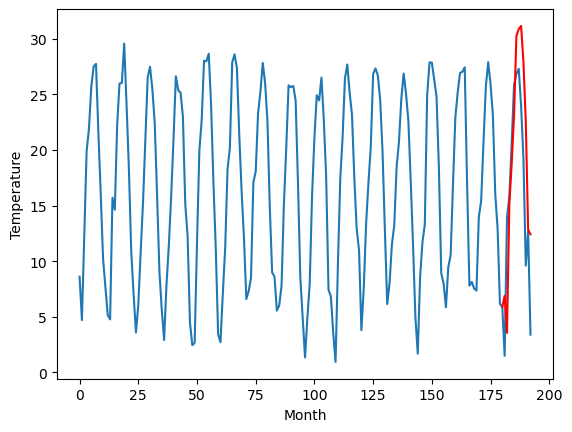

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		6.93		-1.60
4.49		3.59		-0.90
14.68		15.15		0.47
18.44		18.80		0.36
23.62		23.12		-0.50
30.87		30.27		-0.60
31.56		30.87		-0.69
32.32		31.15		-1.17
30.08		27.90		-2.18
21.82		22.54		0.72
15.11		12.84		-2.27
12.72		12.41		-0.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 6.9281319236755365, 3.5869008159637445, 15.154187307357788, 18.801720247268676, 23.115982160568237, 30.26653920173645, 30.869754121303558, 31.14535485267639, 27.89664183616638, 22.541042432785034, 12.839750394821166, 12.40956105351448]


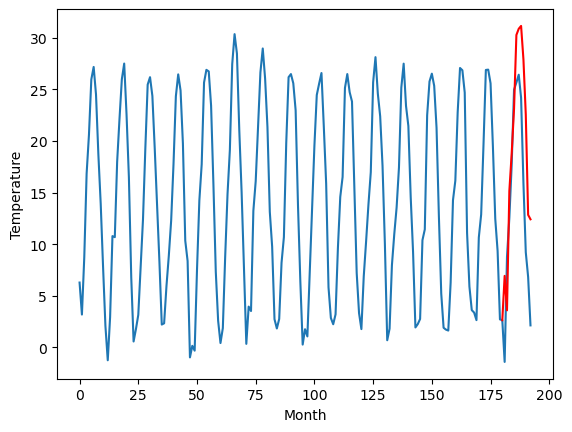

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		4.60		-2.34
9.67		1.28		-8.39
11.48		12.83		1.35
13.29		16.48		3.19
16.87		20.80		3.93
18.09		27.95		9.86
18.88		28.55		9.67
18.93		28.84		9.91
17.65		25.60		7.95
16.51		20.26		3.75
9.66		10.55		0.89
10.56		10.13		-0.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 4.601043848991394, 1.2824641752243044, 12.8310071516037, 16.478748230934144, 20.79955568790436, 27.945958523750306, 28.54794707775116, 28.84334036588669, 25.59977504491806, 20.255263059139253, 10.551171987056733, 10.127524583339692]


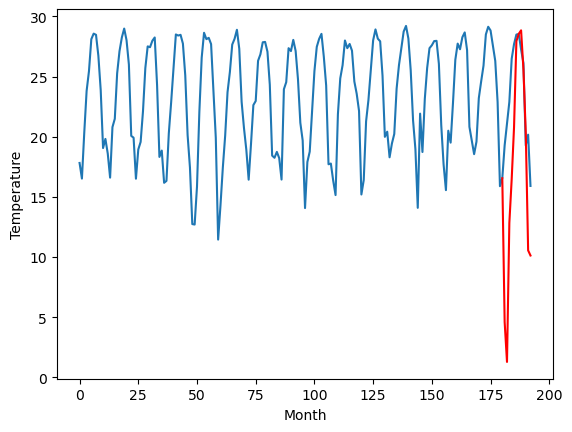

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		16.14		1.40
14.76		12.82		-1.94
18.87		24.39		5.52
23.37		28.03		4.66
28.63		32.35		3.72
34.20		39.50		5.30
36.20		40.10		3.90
37.26		40.39		3.13
34.09		37.14		3.05
30.26		31.80		1.54
22.18		22.10		-0.08
20.26		21.67		1.41
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 16.137991733551026, 12.819789953231812, 24.388390607833863, 28.032750673294068, 32.349117822647095, 39.49516350746155, 40.09818810939789, 40.385149903297425, 37.139868683815, 31.79966253757477, 22.096506066322327, 21.665725148916245]


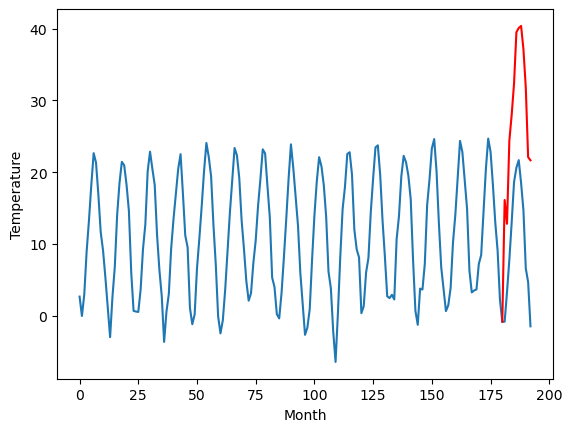

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		1.00		-2.03
2.29		-2.32		-4.61
9.62		9.23		-0.39
10.49		12.87		2.38
14.96		17.19		2.23
18.44		24.32		5.88
19.03		24.92		5.89
19.20		25.22		6.02
16.66		21.98		5.32
13.92		16.64		2.72
5.65		6.94		1.29
9.06		6.52		-2.54
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 0.9975687789916994, -2.319453783035278, 9.225706510543823, 12.87077706336975, 17.186869554519653, 24.321550302505493, 24.917228512763977, 25.215235434770584, 21.982314072847366, 16.643916093111038, 6.939908944368362, 6.52267395734787]


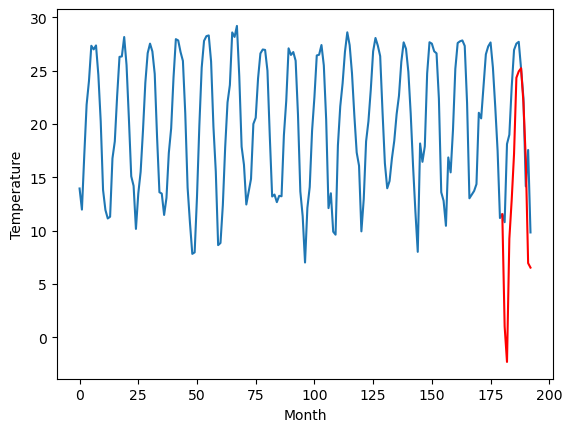

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		12.25		-1.10
11.00		8.93		-2.07
19.38		20.48		1.10
21.50		24.12		2.62
25.54		28.45		2.91
30.09		35.59		5.50
30.17		36.18		6.01
31.28		36.46		5.18
28.54		33.23		4.69
25.24		27.89		2.65
17.60		18.18		0.58
20.84		17.77		-3.07
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 12.2535826587677, 8.930222215652465, 20.478113832473753, 24.124889316558836, 28.445528450012205, 35.58860153198242, 36.1803769493103, 36.461132349967954, 33.22849852085113, 27.885915341377256, 18.1832347536087, 17.76793644070625]


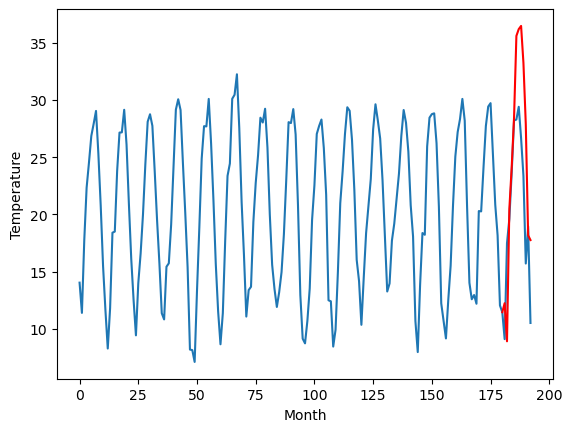

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		12.37		-0.98
10.24		9.04		-1.20
20.61		20.58		-0.03
22.31		24.23		1.92
26.39		28.55		2.16
31.95		35.69		3.74
32.84		36.28		3.44
33.40		36.56		3.16
31.13		33.33		2.20
26.62		27.98		1.36
18.65		18.27		-0.38
20.94		17.86		-3.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 12.368319320678712, 9.037842082977296, 20.581754970550538, 24.225987482070924, 28.548983144760133, 35.688940572738645, 36.280380475521085, 36.559929120540616, 33.33222912549972, 27.98236321210861, 18.269235122203824, 17.855756747722623]


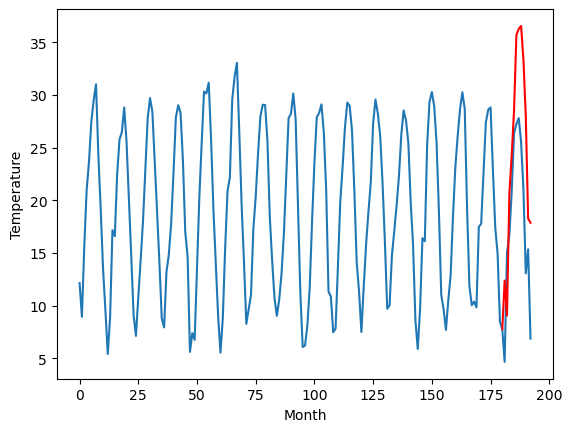

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		10.46		-2.22
15.60		7.13		-8.47
18.70		18.67		-0.03
25.36		22.32		-3.04
30.37		26.64		-3.73
35.36		33.77		-1.59
34.16		34.36		0.20
33.64		34.64		1.00
31.46		31.42		-0.04
24.90		26.06		1.16
19.50		16.35		-3.15
16.15		15.93		-0.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 10.456770195960999, 7.130118145942689, 18.665004506111146, 22.323639645576478, 26.635829224586487, 33.77098680973053, 34.362161769866944, 34.637652620077134, 31.41674874663353, 26.058573945760727, 16.35066626906395, 15.926690205335618]


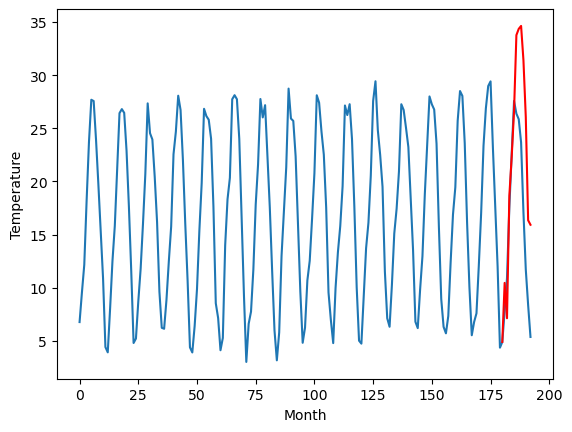

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		5.09		-1.62
5.79		1.76		-4.03
5.39		13.30		7.91
9.25		16.96		7.71
11.47		21.28		9.81
15.71		28.41		12.70
18.69		28.99		10.30
18.29		29.27		10.98
16.51		26.05		9.54
11.53		20.70		9.17
10.27		11.00		0.73
3.76		10.57		6.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 5.08510043144226, 1.7614546012878414, 13.2962131690979, 16.961582441329956, 21.27641942024231, 28.414545793533325, 28.994781572818756, 29.269501287937164, 26.04522736787796, 20.699385006427764, 11.003708202838897, 10.573460001945495]


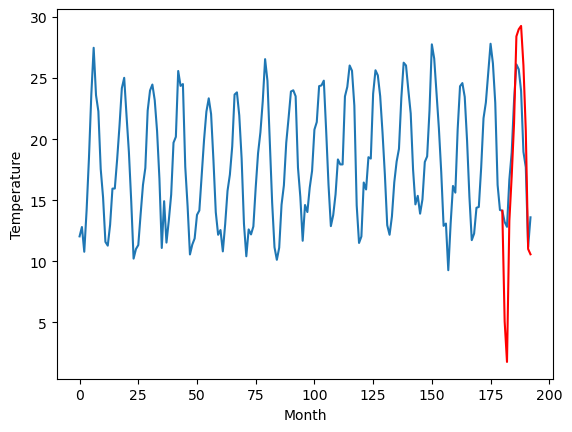

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		10.36		-1.27
12.13		7.04		-5.09
19.01		18.57		-0.44
21.80		22.22		0.42
25.82		26.54		0.72
30.11		33.67		3.56
31.68		34.26		2.58
31.77		34.56		2.79
27.66		31.33		3.67
24.38		25.99		1.61
15.47		16.26		0.79
17.39		15.85		-1.54
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 10.359195508956908, 7.037955322265624, 18.572203674316405, 22.220837392807006, 26.54156283378601, 33.671842374801635, 34.26153788805008, 34.55915040612221, 31.333572574853896, 25.98662871956825, 16.26479072213173, 15.845160880088805]


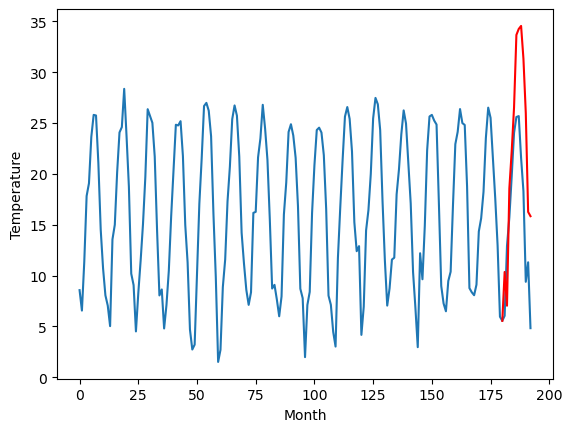

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		6.88		-2.02
10.25		3.57		-6.68
16.46		15.10		-1.36
18.43		18.75		0.32
23.34		23.08		-0.26
28.75		30.21		1.46
30.06		30.81		0.75
30.14		31.11		0.97
25.65		27.88		2.23
21.89		22.54		0.65
11.67		12.81		1.14
13.77		12.39		-1.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 6.884649105072022, 3.5652590465545657, 15.103759832382202, 18.75451476097107, 23.07522255897522, 30.209095067977906, 30.81026542901993, 31.10995591402054, 27.880612499713898, 22.539281494617462, 12.8127676320076, 12.386693991422653]


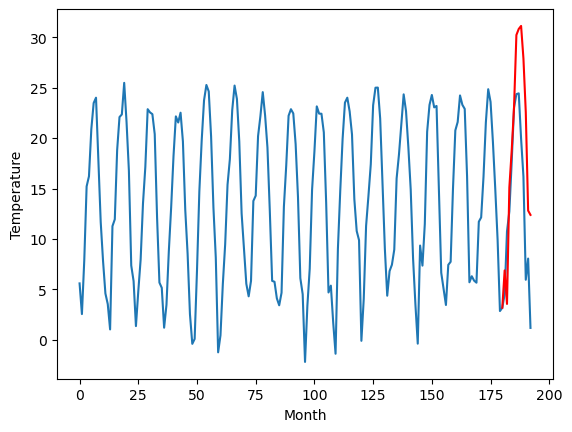

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   6.889702
1                 1    8.53   6.928132
2                 2    6.94   4.601044
3                 3   14.74  16.137992
4                 4    3.03   0.997569
5                 5   13.35  12.253583
6                 6   13.35  12.368319
7                 7   12.68  10.456770
8                 8    6.71   5.085100
9                 9   11.63  10.359196
10               10    8.90   6.884649


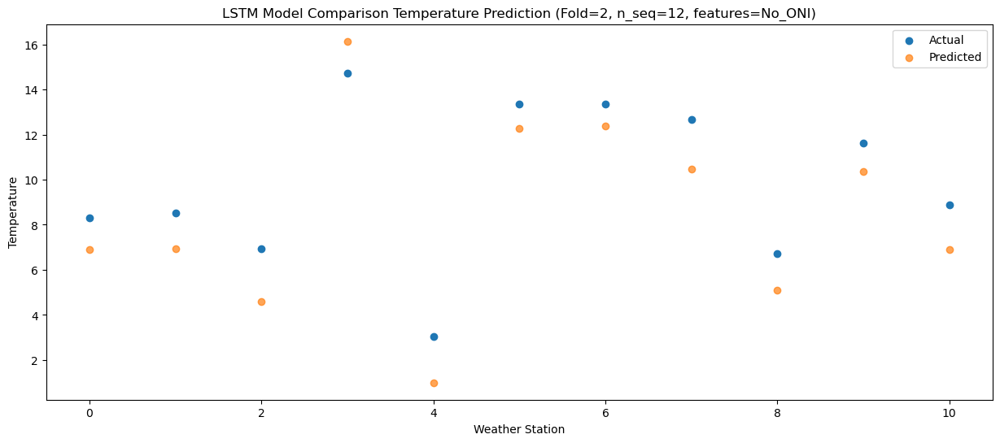

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   3.562943
1                 1    4.49   3.586901
2                 2    9.67   1.282464
3                 3   14.76  12.819790
4                 4    2.29  -2.319454
5                 5   11.00   8.930222
6                 6   10.24   9.037842
7                 7   15.60   7.130118
8                 8    5.79   1.761455
9                 9   12.13   7.037955
10               10   10.25   3.565259


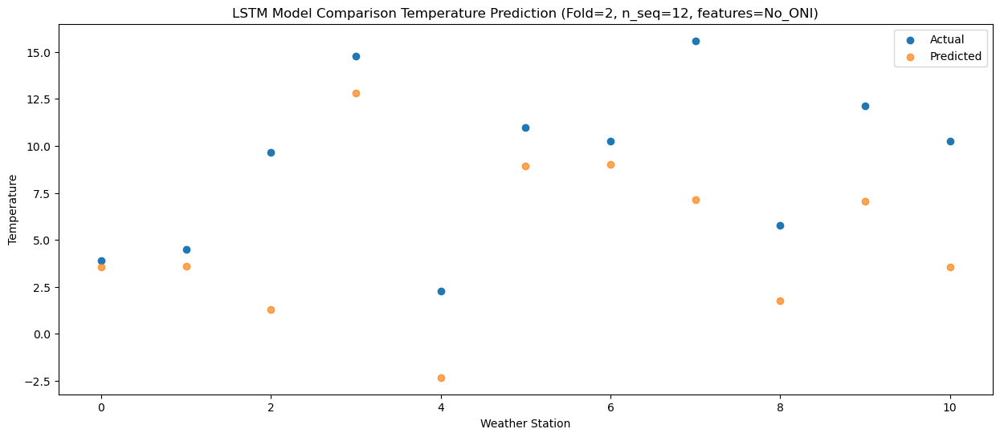

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  15.120192
1                 1   14.68  15.154187
2                 2   11.48  12.831007
3                 3   18.87  24.388391
4                 4    9.62   9.225707
5                 5   19.38  20.478114
6                 6   20.61  20.581755
7                 7   18.70  18.665005
8                 8    5.39  13.296213
9                 9   19.01  18.572204
10               10   16.46  15.103760


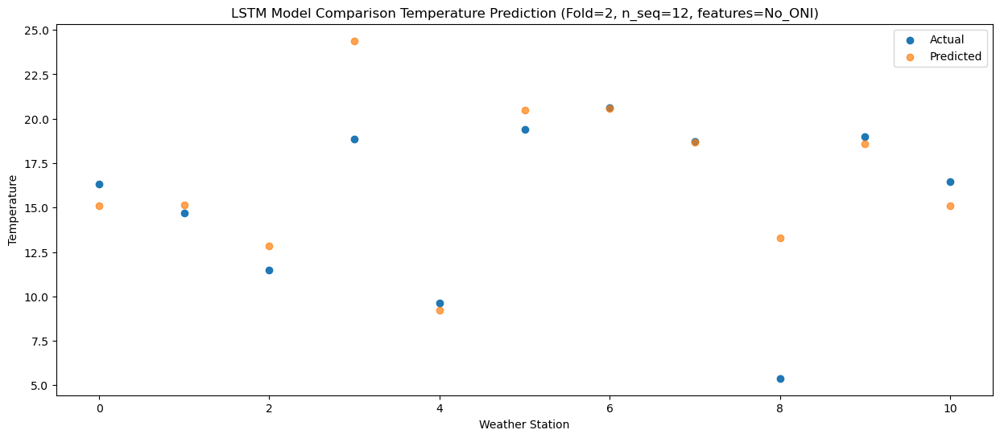

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  18.765033
1                 1   18.44  18.801720
2                 2   13.29  16.478748
3                 3   23.37  28.032751
4                 4   10.49  12.870777
5                 5   21.50  24.124889
6                 6   22.31  24.225987
7                 7   25.36  22.323640
8                 8    9.25  16.961582
9                 9   21.80  22.220837
10               10   18.43  18.754515


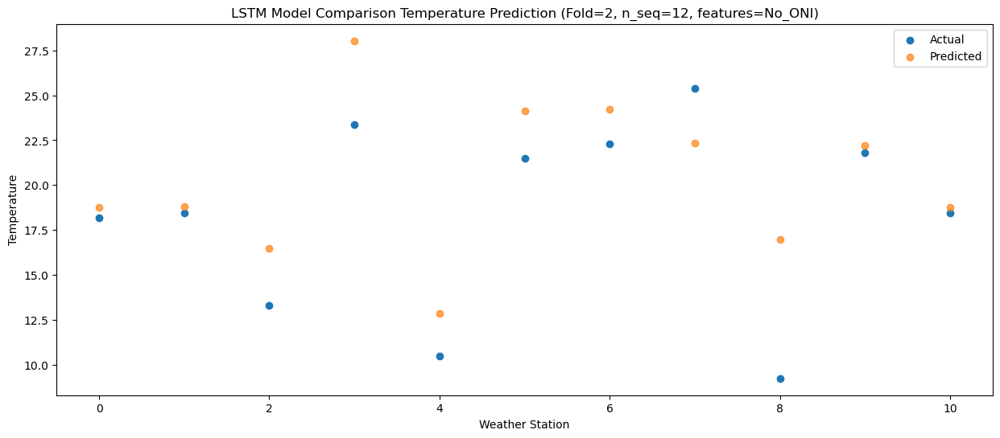

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  23.088173
1                 1   23.62  23.115982
2                 2   16.87  20.799556
3                 3   28.63  32.349118
4                 4   14.96  17.186870
5                 5   25.54  28.445528
6                 6   26.39  28.548983
7                 7   30.37  26.635829
8                 8   11.47  21.276419
9                 9   25.82  26.541563
10               10   23.34  23.075223


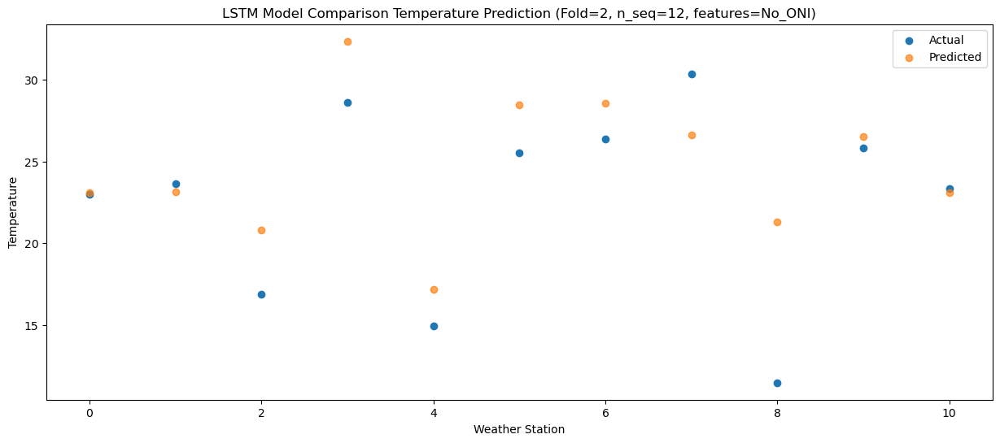

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  30.235989
1                 1   30.87  30.266539
2                 2   18.09  27.945959
3                 3   34.20  39.495164
4                 4   18.44  24.321550
5                 5   30.09  35.588602
6                 6   31.95  35.688941
7                 7   35.36  33.770987
8                 8   15.71  28.414546
9                 9   30.11  33.671842
10               10   28.75  30.209095


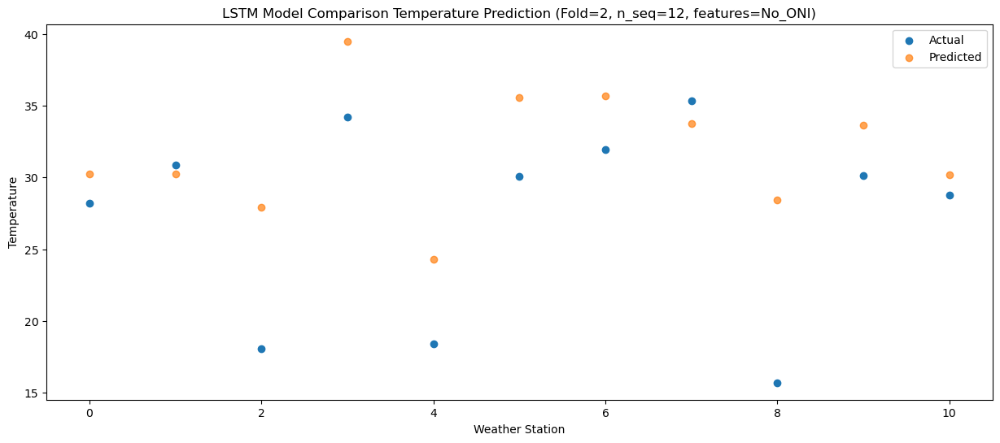

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   29.24  30.848110
1                 1   31.56  30.869754
2                 2   18.88  28.547947
3                 3   36.20  40.098188
4                 4   19.03  24.917229
5                 5   30.17  36.180377
6                 6   32.84  36.280380
7                 7   34.16  34.362162
8                 8   18.69  28.994782
9                 9   31.68  34.261538
10               10   30.06  30.810265


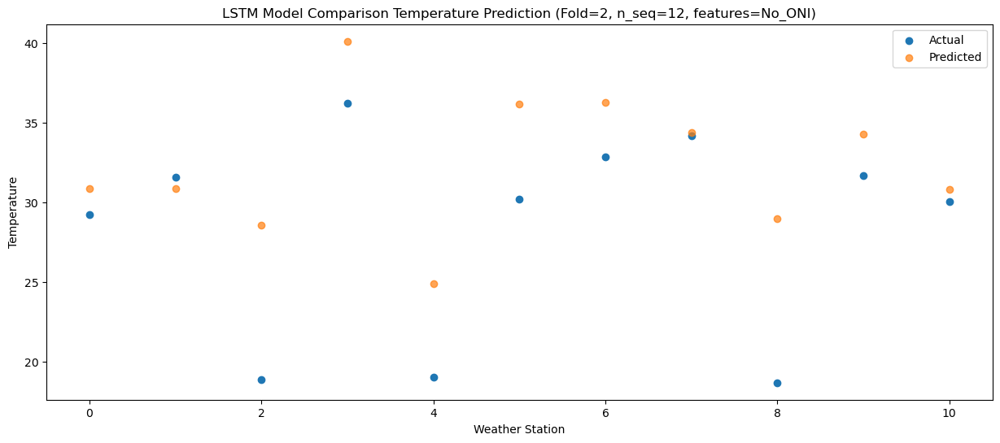

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   29.69  31.137370
1                 1   32.32  31.145355
2                 2   18.93  28.843340
3                 3   37.26  40.385150
4                 4   19.20  25.215235
5                 5   31.28  36.461132
6                 6   33.40  36.559929
7                 7   33.64  34.637653
8                 8   18.29  29.269501
9                 9   31.77  34.559150
10               10   30.14  31.109956


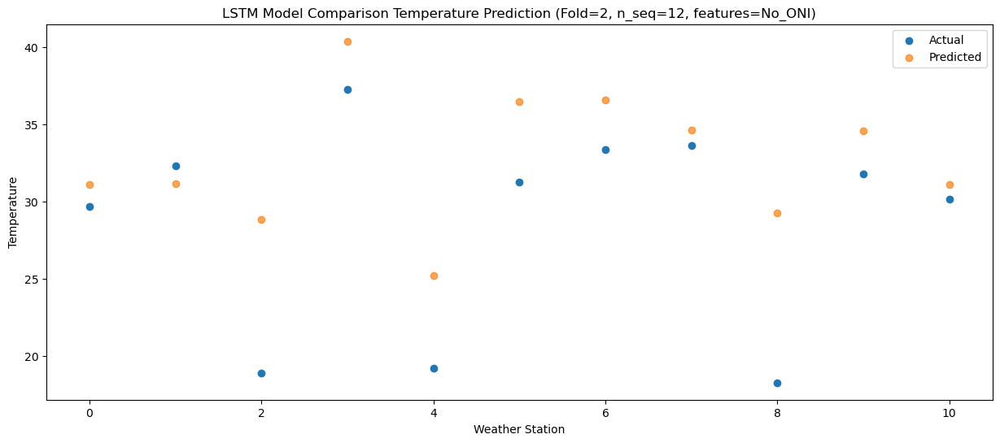

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   26.39  27.900140
1                 1   30.08  27.896642
2                 2   17.65  25.599775
3                 3   34.09  37.139869
4                 4   16.66  21.982314
5                 5   28.54  33.228499
6                 6   31.13  33.332229
7                 7   31.46  31.416749
8                 8   16.51  26.045227
9                 9   27.66  31.333573
10               10   25.65  27.880612


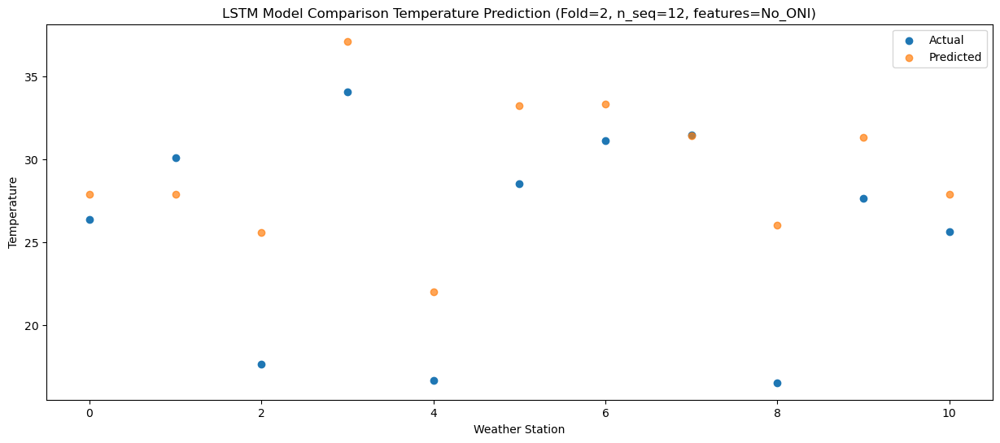

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.64  22.548133
1                 1   21.82  22.541042
2                 2   16.51  20.255263
3                 3   30.26  31.799663
4                 4   13.92  16.643916
5                 5   25.24  27.885915
6                 6   26.62  27.982363
7                 7   24.90  26.058574
8                 8   11.53  20.699385
9                 9   24.38  25.986629
10               10   21.89  22.539281


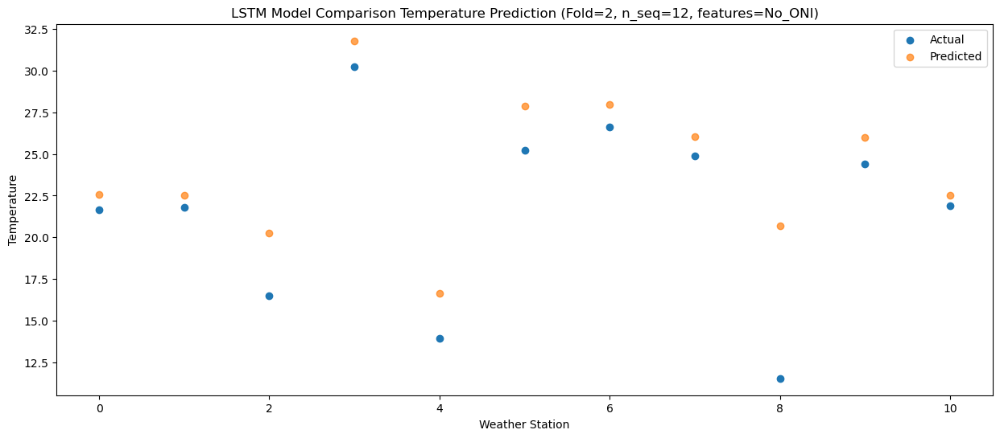

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.02  12.830402
1                 1   15.11  12.839750
2                 2    9.66  10.551172
3                 3   22.18  22.096506
4                 4    5.65   6.939909
5                 5   17.60  18.183235
6                 6   18.65  18.269235
7                 7   19.50  16.350666
8                 8   10.27  11.003708
9                 9   15.47  16.264791
10               10   11.67  12.812768


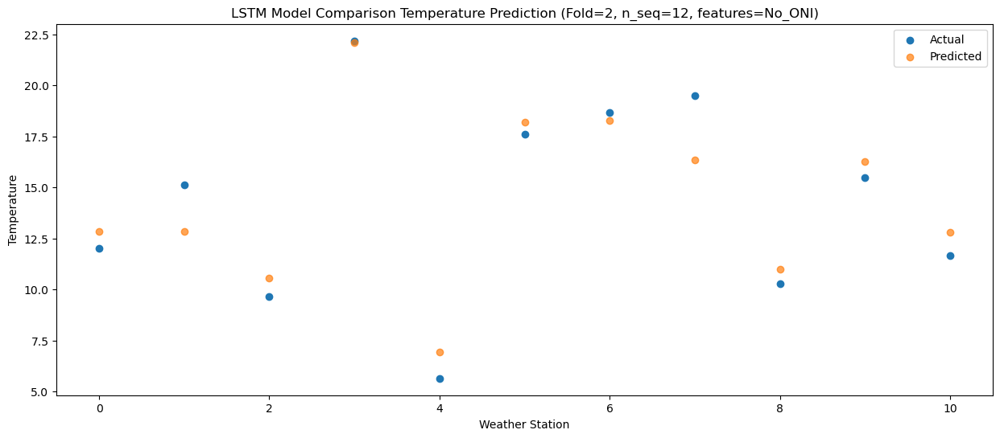

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.11  12.415892
1                 1   12.72  12.409561
2                 2   10.56  10.127525
3                 3   20.26  21.665725
4                 4    9.06   6.522674
5                 5   20.84  17.767936
6                 6   20.94  17.855757
7                 7   16.15  15.926690
8                 8    3.76  10.573460
9                 9   17.39  15.845161
10               10   13.77  12.386694


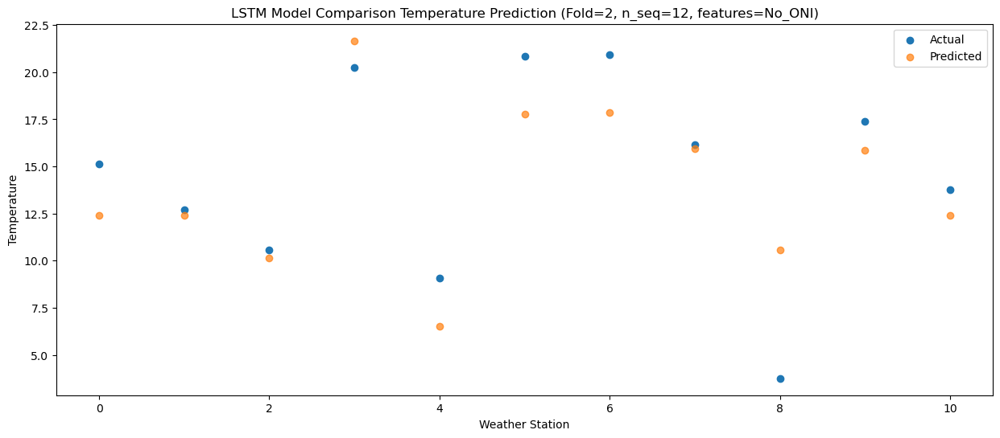

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]
 [29.24 31.56 18.88 36.2  19.03 30.17 32.84 34.16 18.69 31.68 30.06]
 [29.69 32.32 18.93 37.26 19.2  31.28 33.4  33.64 18.29 31.77 30.14]
 [26.39 30.08 17.65 34.09 16.66 28.54 31.13 31.46 16.51 27.66 25.65]
 [21.64 21.82 16.51 30.26 13.92 25.24 26.62 24.9  11.53 24.38 21.89]
 [12.02 15.11  9.66 22.18  5.65 17.6  18.65 19.5  10.27 15.47 11.67]
 [15.11 12.72 10.56 20.26  9.06 20.84 20.94 16.15  3.76 17.39 13.77]]
[[ 6.88970167  6.92813192  4.60104385 16.13799173  0.99756878 12.25358266
  12.36831932 10.4567702   5.08510043 10.35919551  6.88464911]
 [ 3.56294281  3.58690082  1

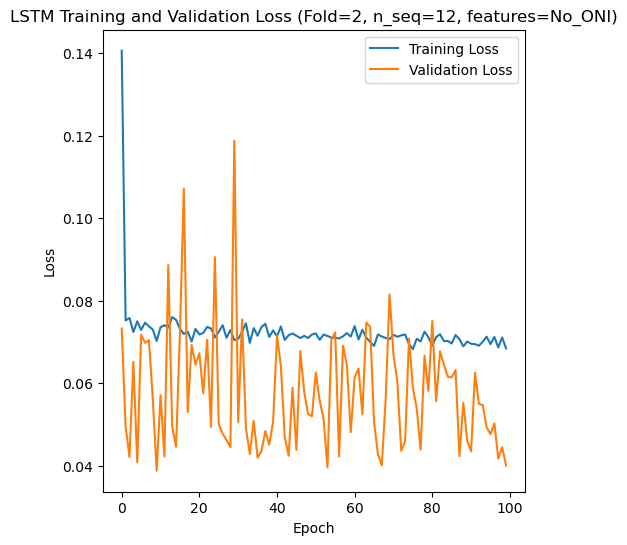

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 47s 349ms/step - loss: 0.1429 - accuracy: 0.6429 - mae: 0.1225 - rmse: 0.1429 - mape: 27.7442 - pearson: 0.7284 - val_loss: 0.0841 - val_accuracy: 0.7000 - val_mae: 0.0673 - val_rmse: 0.0841 - val_mape: 18.0965 - val_pearson: 0.7602
Epoch 2/100
84/84 [==============================] - 22s 267ms/step - loss: 0.0698 - accuracy: 0.7738 - mae: 0.0541 - rmse: 0.0698 - mape: 12.8302 - pearson: 0.8306 - val_loss: 0.0883 - val_accuracy: 0.7000 - val_mae: 0.0710 - val_rmse: 0.0883 - val_mape: 18.8622 - val_pearson: 0.7433
Epoch 3/100
84/84 [==============================] - 24s 280ms/step - loss: 0.0689 - accuracy: 0.7738 - mae: 0.0537 - rmse: 0.0689 - mape: 12.5027 - pearson: 0.8356

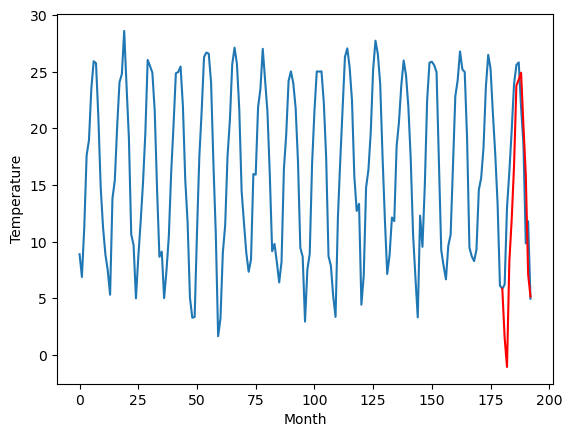

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		7.22		-0.53
4.03		4.65		0.62
16.00		13.98		-2.02
17.86		17.68		-0.18
22.08		22.43		0.35
28.79		29.50		0.71
30.10		30.04		-0.06
30.67		30.63		-0.04
27.94		25.95		-1.99
21.34		21.60		0.26
13.63		12.81		-0.82
14.94		10.86		-4.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 7.2181401491165165, 4.645359063148499, 13.980342888832093, 17.683883929252623, 22.431889796257018, 29.50428178310394, 30.0400106549263, 30.628041887283324, 25.94899191856384, 21.604102277755736, 12.814005994796752, 10.859247589111327]


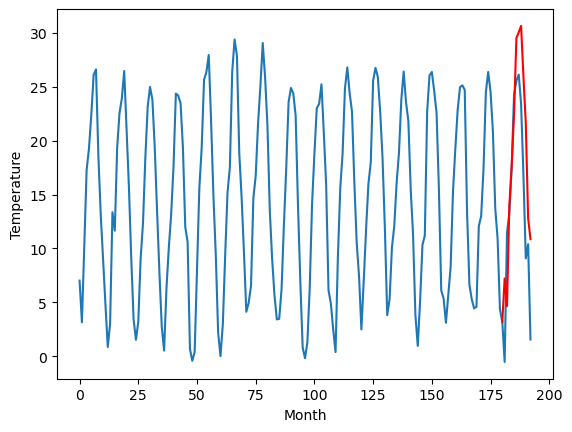

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		5.34		-2.94
10.58		2.77		-7.81
11.73		12.09		0.36
17.46		15.80		-1.66
22.26		20.54		-1.72
27.11		27.61		0.50
30.24		28.15		-2.09
28.04		28.74		0.70
24.73		24.07		-0.66
16.07		19.72		3.65
11.73		10.93		-0.80
7.81		8.98		1.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 5.343721170425415, 2.7715344619750972, 12.09061767578125, 15.79587604522705, 20.53509380340576, 27.614247341156005, 28.145047147274017, 28.740349311828613, 24.066703338623046, 19.719699878692627, 10.929685611724853, 8.976238627433776]


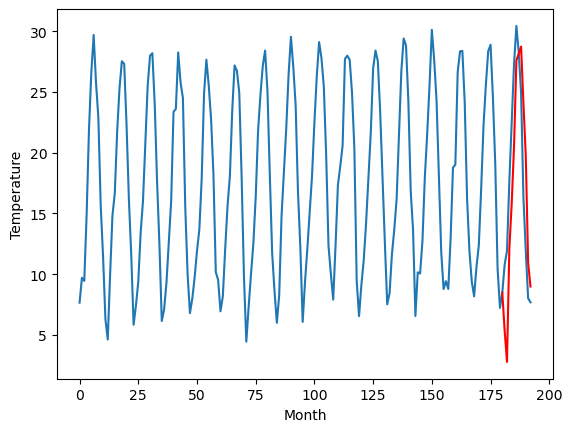

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		5.97		-0.22
4.87		3.40		-1.47
15.08		12.72		-2.36
17.43		16.42		-1.01
21.50		21.17		-0.33
27.42		28.25		0.83
28.41		28.78		0.37
28.93		29.37		0.44
24.80		24.68		-0.12
21.22		20.34		-0.88
11.56		11.55		-0.01
13.05		9.59		-3.46
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 5.969787621498108, 3.3982198476791385, 12.718878531455994, 16.422719740867613, 21.173582339286803, 28.25428512096405, 28.77650054693222, 29.36870410442352, 24.68401172161102, 20.338307642936705, 11.55099799633026, 9.592717313766478]


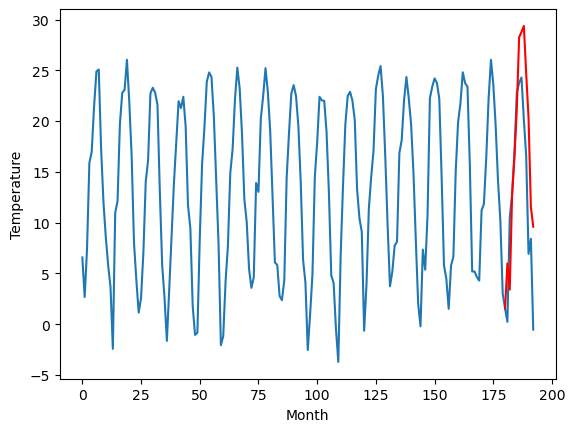

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		4.89		-0.21
1.23		2.32		1.09
14.31		11.65		-2.66
17.60		15.35		-2.25
22.17		20.10		-2.07
29.65		27.19		-2.46
29.65		27.71		-1.94
29.77		28.29		-1.48
26.41		23.61		-2.80
20.99		19.26		-1.73
11.25		10.47		-0.78
10.89		8.52		-2.37
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 4.89081139087677, 2.316420502662659, 11.64965910434723, 15.351375288963318, 20.103457159996033, 27.186418719291687, 27.712823457717896, 28.292479820251465, 23.60619956970215, 19.263399906158448, 10.47453290939331, 8.515012450218201]


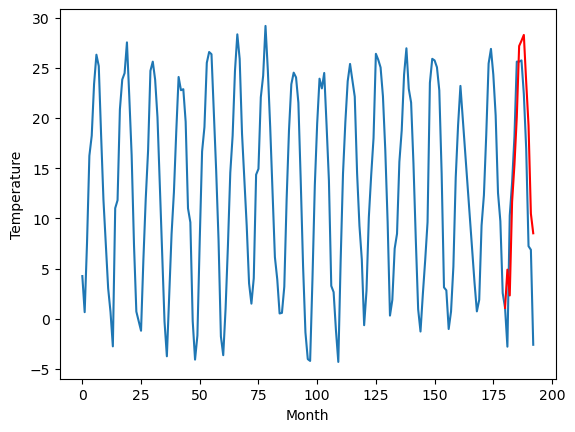

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		2.56		-0.24
0.08		-0.01		-0.09
11.41		9.32		-2.09
14.86		13.02		-1.84
19.14		17.78		-1.36
25.85		24.86		-0.99
26.23		25.39		-0.84
26.55		25.97		-0.58
23.29		21.28		-2.01
18.71		16.94		-1.77
7.86		8.15		0.29
8.91		6.19		-2.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 2.5624996423721313, -0.01058804988861084, 9.321301102638245, 13.020905613899231, 17.776984333992004, 24.85966646671295, 25.390583276748657, 25.969054579734802, 21.28200662136078, 16.940009474754333, 8.149235129356384, 6.186730146408081]


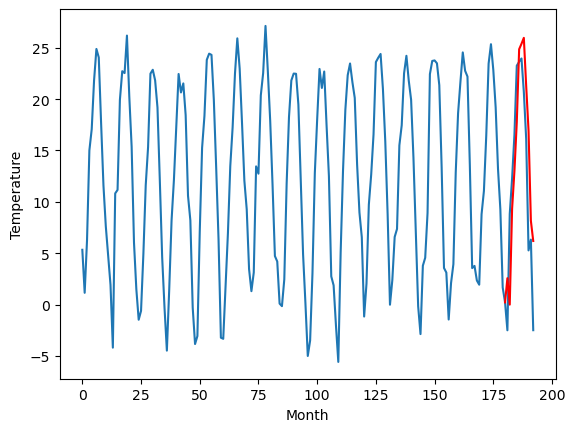

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		3.65		-1.95
5.70		1.07		-4.63
8.67		10.39		1.72
13.45		14.09		0.64
18.50		18.83		0.33
25.89		25.91		0.02
27.73		26.44		-1.29
25.81		27.02		1.21
23.94		22.34		-1.60
15.97		17.99		2.02
13.23		9.20		-4.03
8.47		7.24		-1.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 3.647073941230774, 1.0679475831985474, 10.392631726264954, 14.087124304771423, 18.829935030937193, 25.905718283653258, 26.440499799251555, 27.016908483505247, 22.337598161697386, 17.98591216087341, 9.19962580680847, 7.2419102954864485]


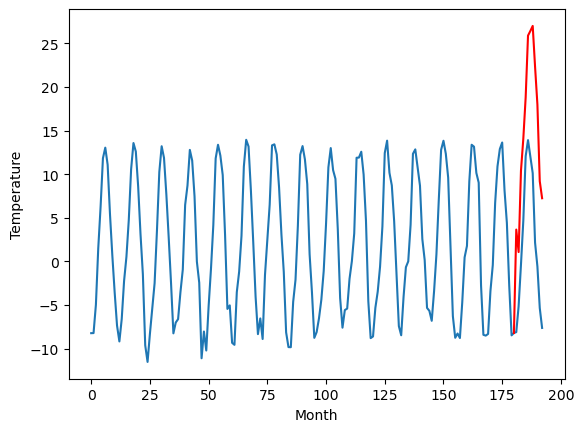

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-9.92		-2.23
-4.84		-12.50		-7.66
-3.24		-3.18		0.06
4.73		0.52		-4.21
9.16		5.26		-3.90
16.80		12.34		-4.46
17.88		12.88		-5.00
16.65		13.47		-3.18
12.68		8.80		-3.88
2.33		4.44		2.11
-0.19		-4.34		-4.15
-7.46		-6.29		1.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, -9.922915687561035, -12.499687900543213, -3.1801087760925295, 0.5165708160400388, 5.258941898345947, 12.34072566986084, 12.878949234485626, 13.468422183990478, 8.79890609741211, 4.444644222259521, -4.33959077835083, -6.290082564353943]


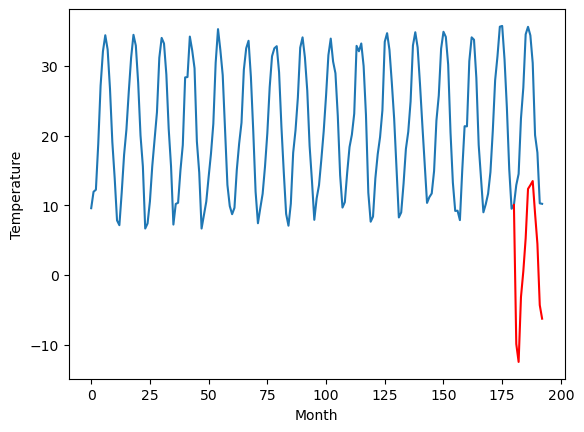

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		7.89		-2.90
11.72		5.31		-6.41
11.50		14.63		3.13
13.69		18.33		4.64
17.98		23.07		5.09
19.68		30.15		10.47
18.86		30.68		11.82
19.41		31.28		11.87
18.86		26.61		7.75
16.10		22.25		6.15
13.28		13.46		0.18
9.58		11.52		1.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 7.891920037269593, 5.314787335395813, 14.626071400642395, 18.33290738582611, 23.073241896629334, 30.15336913585663, 30.681727058887482, 31.27845776796341, 26.609144337177277, 22.252848751544953, 13.462270863056183, 11.515955216884613]


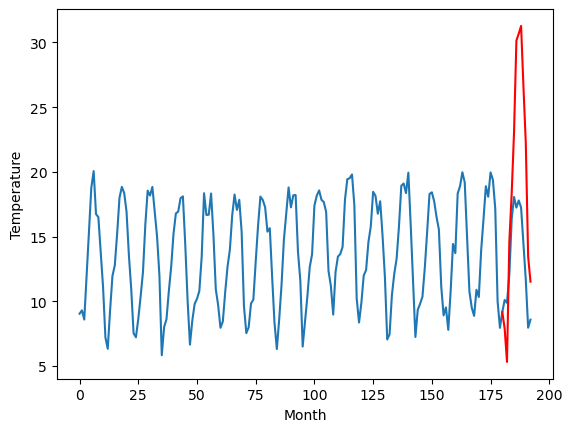

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		7.36		1.34
5.90		4.79		-1.11
10.90		14.11		3.21
15.52		17.82		2.30
20.35		22.56		2.21
26.22		29.65		3.43
28.36		30.19		1.83
28.98		30.78		1.80
25.66		26.10		0.44
21.22		21.76		0.54
12.30		12.97		0.67
10.70		11.03		0.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 7.356768288612365, 4.788865246772765, 14.105503239631652, 17.815022625923156, 22.55983368396759, 29.6519624376297, 30.188093223571776, 30.77942309617996, 26.10179028749466, 21.759063103199004, 12.974411346912383, 11.030756452083587]


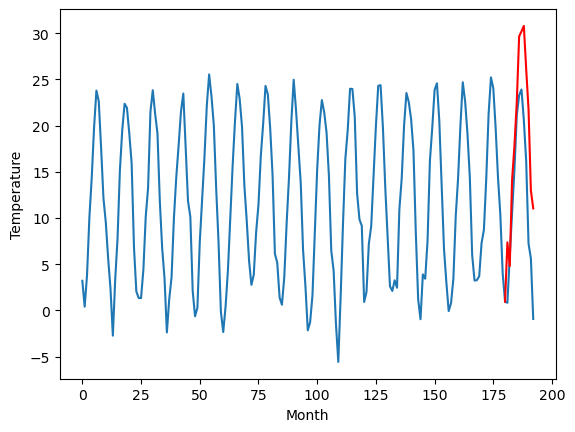

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		1.51		-0.13
0.84		-1.06		-1.90
8.03		8.26		0.23
12.90		11.97		-0.93
17.16		16.72		-0.44
23.33		23.82		0.49
24.97		24.35		-0.62
24.70		24.94		0.24
20.44		20.26		-0.18
16.32		15.92		-0.40
6.10		7.13		1.03
5.69		5.18		-0.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, 1.5077074289321901, -1.0596539258956907, 8.259874653816222, 11.971607518196105, 16.720147442817687, 23.816905331611633, 24.353647541999816, 24.941963744163512, 20.26080424785614, 15.921958518028259, 7.133800101280212, 5.180058789253234]


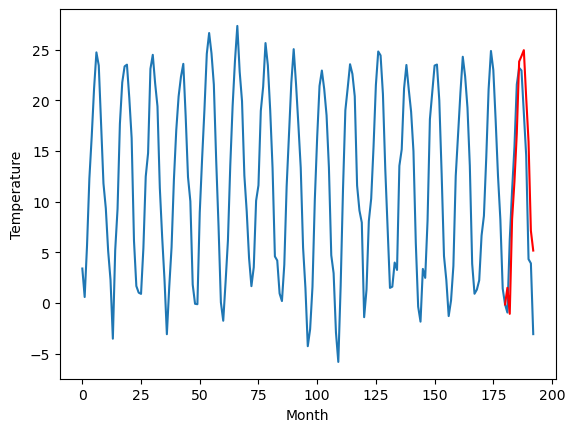

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   1.511886
1                 1    7.75   7.218140
2                 2    8.28   5.343721
3                 3    6.19   5.969788
4                 4    5.10   4.890811
5                 5    2.80   2.562500
6                 6    5.60   3.647074
7                 7   -7.69  -9.922916
8                 8   10.79   7.891920
9                 9    6.02   7.356768
10               10    1.64   1.507707


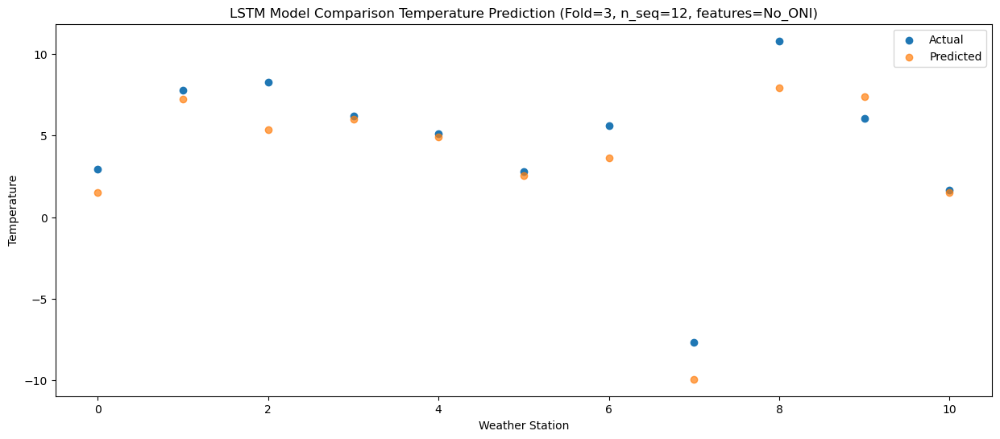

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29  -1.050656
1                 1    4.03   4.645359
2                 2   10.58   2.771534
3                 3    4.87   3.398220
4                 4    1.23   2.316421
5                 5    0.08  -0.010588
6                 6    5.70   1.067948
7                 7   -4.84 -12.499688
8                 8   11.72   5.314787
9                 9    5.90   4.788865
10               10    0.84  -1.059654


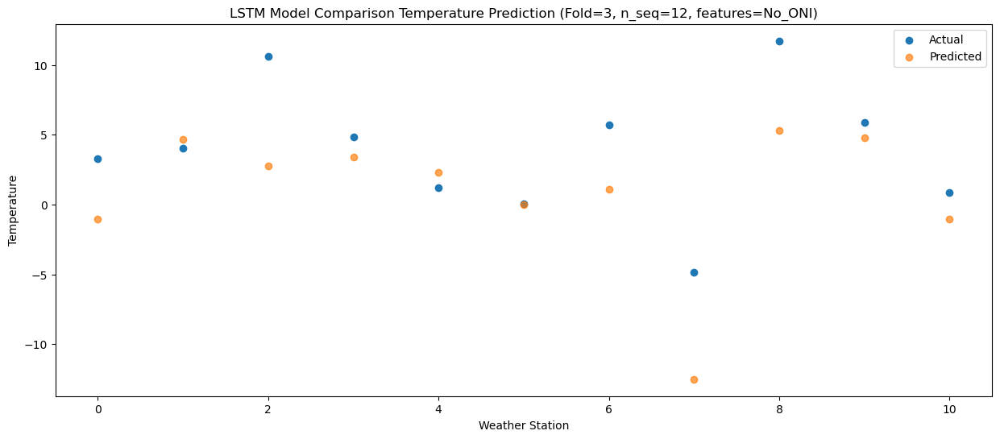

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   8.255066
1                 1   16.00  13.980343
2                 2   11.73  12.090618
3                 3   15.08  12.718879
4                 4   14.31  11.649659
5                 5   11.41   9.321301
6                 6    8.67  10.392632
7                 7   -3.24  -3.180109
8                 8   11.50  14.626071
9                 9   10.90  14.105503
10               10    8.03   8.259875


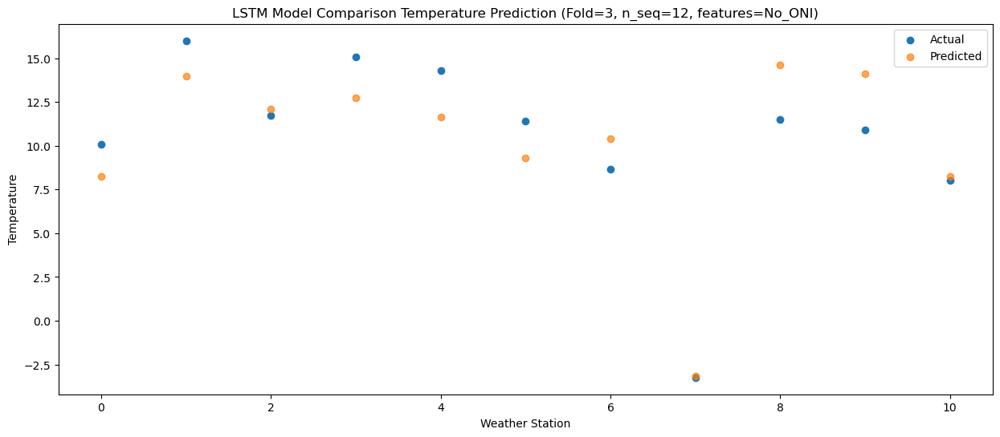

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25  11.957614
1                 1   17.86  17.683884
2                 2   17.46  15.795876
3                 3   17.43  16.422720
4                 4   17.60  15.351375
5                 5   14.86  13.020906
6                 6   13.45  14.087124
7                 7    4.73   0.516571
8                 8   13.69  18.332907
9                 9   15.52  17.815023
10               10   12.90  11.971608


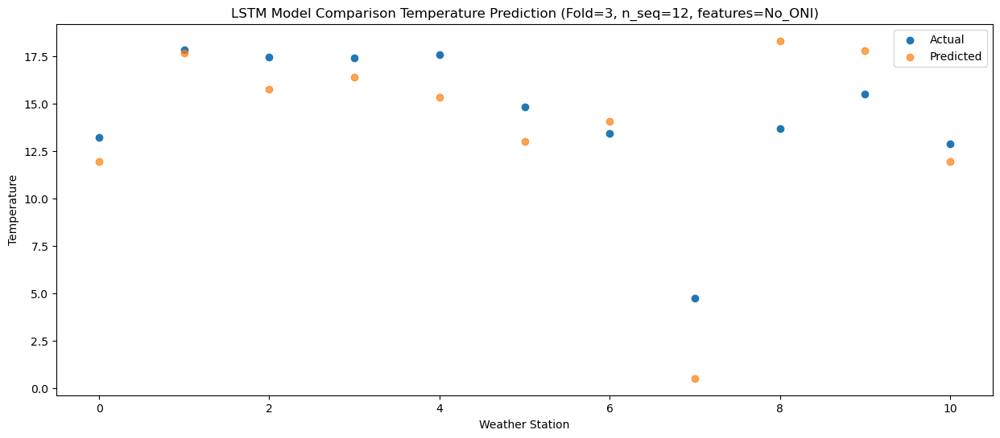

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91  16.701387
1                 1   22.08  22.431890
2                 2   22.26  20.535094
3                 3   21.50  21.173582
4                 4   22.17  20.103457
5                 5   19.14  17.776984
6                 6   18.50  18.829935
7                 7    9.16   5.258942
8                 8   17.98  23.073242
9                 9   20.35  22.559834
10               10   17.16  16.720147


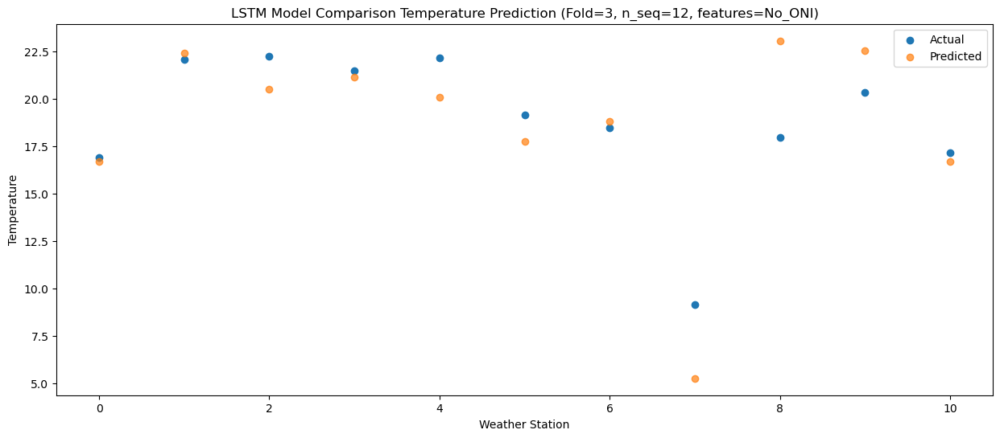

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  23.783866
1                 1   28.79  29.504282
2                 2   27.11  27.614247
3                 3   27.42  28.254285
4                 4   29.65  27.186419
5                 5   25.85  24.859666
6                 6   25.89  25.905718
7                 7   16.80  12.340726
8                 8   19.68  30.153369
9                 9   26.22  29.651962
10               10   23.33  23.816905


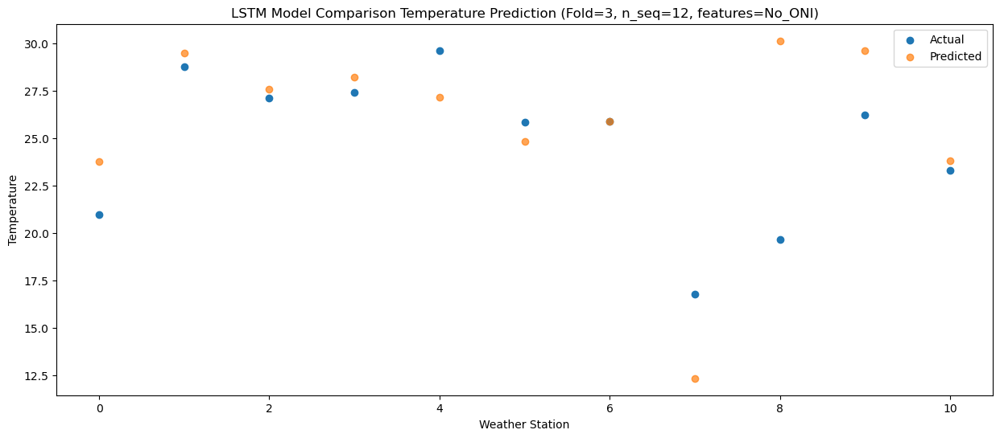

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   22.68  24.321178
1                 1   30.10  30.040011
2                 2   30.24  28.145047
3                 3   28.41  28.776501
4                 4   29.65  27.712823
5                 5   26.23  25.390583
6                 6   27.73  26.440500
7                 7   17.88  12.878949
8                 8   18.86  30.681727
9                 9   28.36  30.188093
10               10   24.97  24.353648


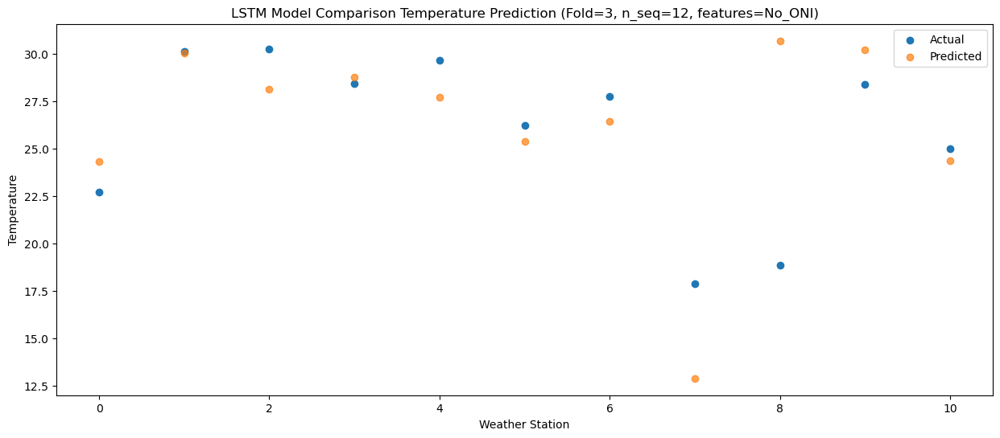

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   22.90  24.921824
1                 1   30.67  30.628042
2                 2   28.04  28.740349
3                 3   28.93  29.368704
4                 4   29.77  28.292480
5                 5   26.55  25.969055
6                 6   25.81  27.016908
7                 7   16.65  13.468422
8                 8   19.41  31.278458
9                 9   28.98  30.779423
10               10   24.70  24.941964


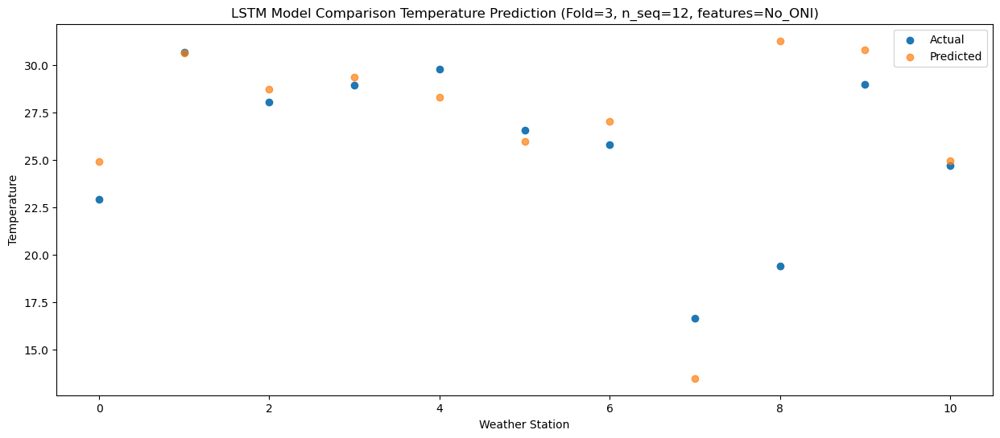

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   18.91  20.242183
1                 1   27.94  25.948992
2                 2   24.73  24.066703
3                 3   24.80  24.684012
4                 4   26.41  23.606200
5                 5   23.29  21.282007
6                 6   23.94  22.337598
7                 7   12.68   8.798906
8                 8   18.86  26.609144
9                 9   25.66  26.101790
10               10   20.44  20.260804


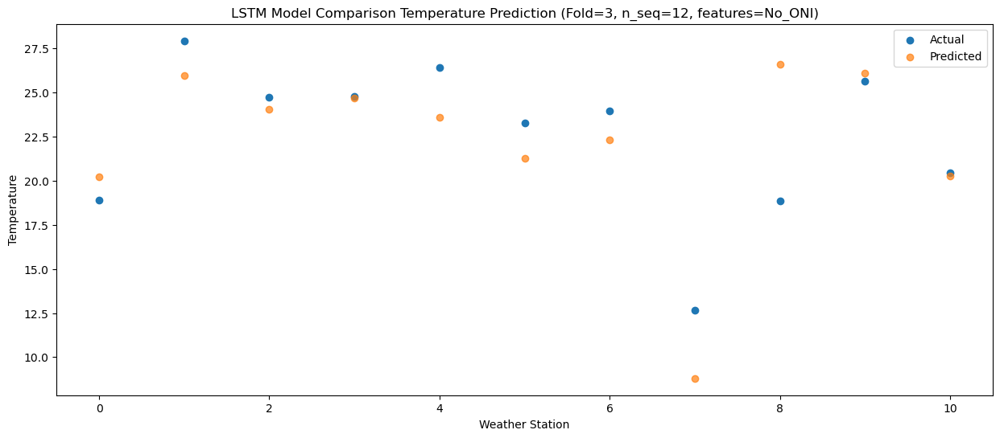

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   15.68  15.900750
1                 1   21.34  21.604102
2                 2   16.07  19.719700
3                 3   21.22  20.338308
4                 4   20.99  19.263400
5                 5   18.71  16.940009
6                 6   15.97  17.985912
7                 7    2.33   4.444644
8                 8   16.10  22.252849
9                 9   21.22  21.759063
10               10   16.32  15.921959


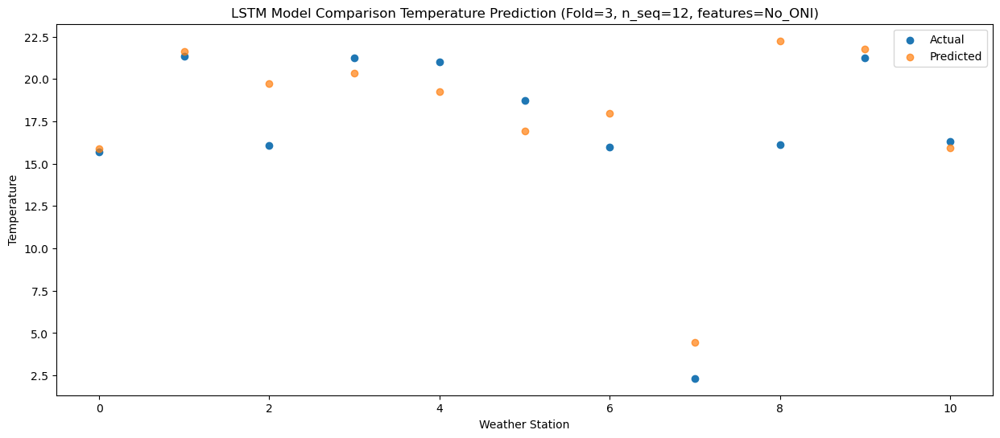

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.92   7.111901
1                 1   13.63  12.814006
2                 2   11.73  10.929686
3                 3   11.56  11.550998
4                 4   11.25  10.474533
5                 5    7.86   8.149235
6                 6   13.23   9.199626
7                 7   -0.19  -4.339591
8                 8   13.28  13.462271
9                 9   12.30  12.974411
10               10    6.10   7.133800


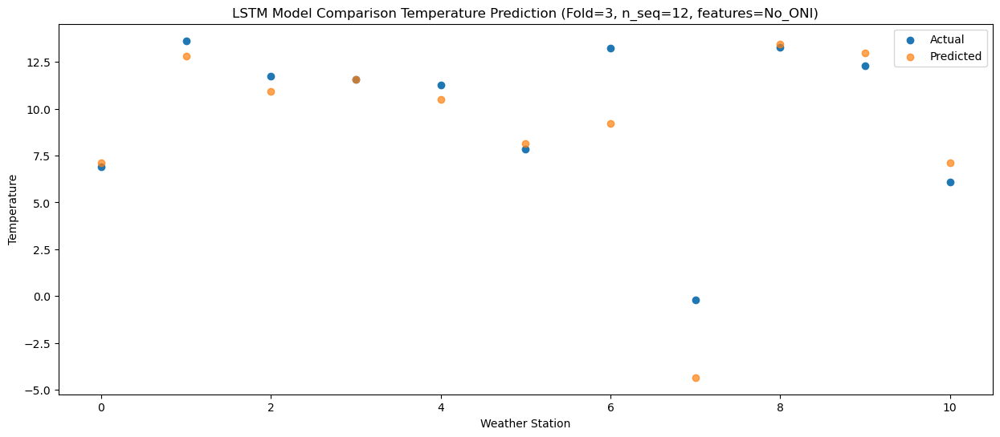

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.88   5.156431
1                 1   14.94  10.859248
2                 2    7.81   8.976239
3                 3   13.05   9.592717
4                 4   10.89   8.515012
5                 5    8.91   6.186730
6                 6    8.47   7.241910
7                 7   -7.46  -6.290083
8                 8    9.58  11.515955
9                 9   10.70  11.030756
10               10    5.69   5.180059


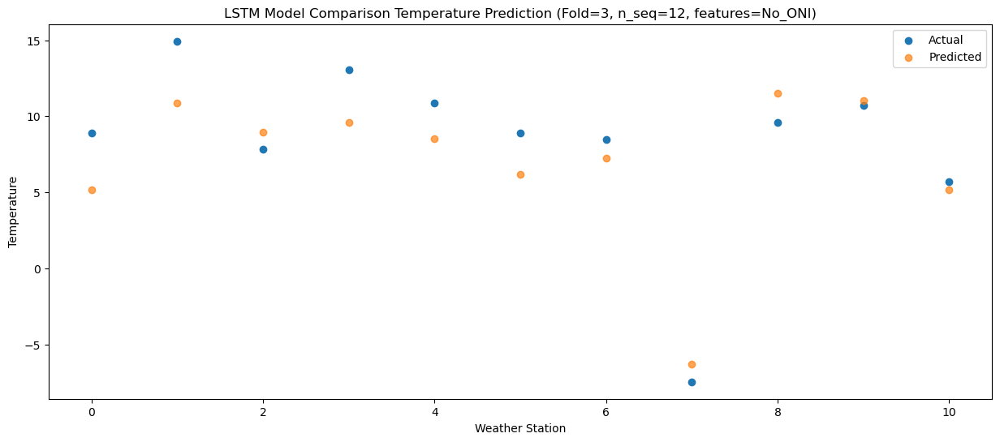

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]
 [22.68 30.1  30.24 28.41 29.65 26.23 27.73 17.88 18.86 28.36 24.97]
 [22.9  30.67 28.04 28.93 29.77 26.55 25.81 16.65 19.41 28.98 24.7 ]
 [18.91 27.94 24.73 24.8  26.41 23.29 23.94 12.68 18.86 25.66 20.44]
 [15.68 21.34 16.07 21.22 20.99 18.71 15.97  2.33 16.1  21.22 16.32]
 [ 6.92 13.63 11.73 11.56 11.25  7.86 13.23 -0.19 13.28 12.3   6.1 ]
 [ 8.88 14.94  7.81 13.05 10.89  8.91  8.47 -7.46  9.58 10.7   5.69]]
[[ 1.51188643e+00  7.21814015e+00  5.34372117e+00  5.96978762e+00
   4.89081139e+00  2.56249964e+00  3.64707394e+00 -9.92291569e+00
   7.89192004e+00  7.35676829e+00

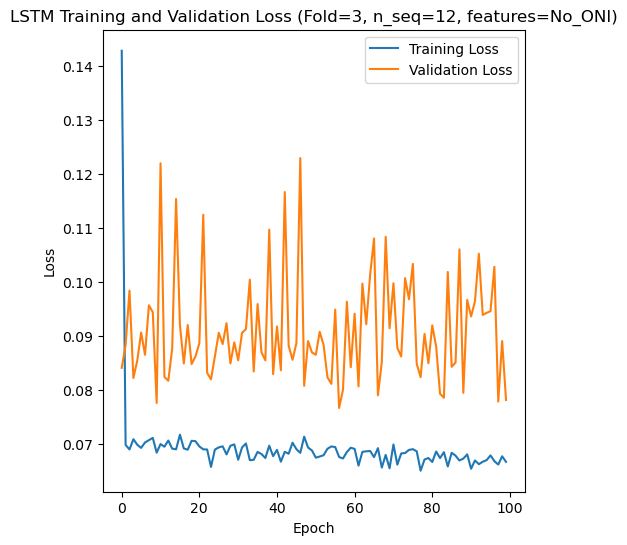

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 46s 351ms/step - loss: 0.1969 - accuracy: 0.5595 - mae: 0.1654 - rmse: 0.1969 - mape: 35.8424 - pearson: 0.6355 - val_loss: 0.0741 - val_accuracy: 0.7000 - val_mae: 0.0582 - val_rmse: 0.0741 - val_mape: 13.2872 - val_pearson: 0.8357
Epoch 2/100
84/84 [==============================] - 22s 257ms/step - loss: 0.0712 - accuracy: 0.6905 - mae: 0.0559 - rmse: 0.0712 - mape: 12.4717 - pearson: 0.7994 - val_loss: 0.0815 - val_accuracy: 0.7000 - val_mae: 0.0654 - val_rmse: 0.0815 - val_mape: 15.6518 - val_pearson: 0.8102
Epoch 3/100
84/84 [==============================] - 23s 270ms/step - loss: 0.0722 - accuracy: 0.6905 - mae: 0.0569 - rmse: 0.0722 - mape: 12.6447 - pearson: 0.7936

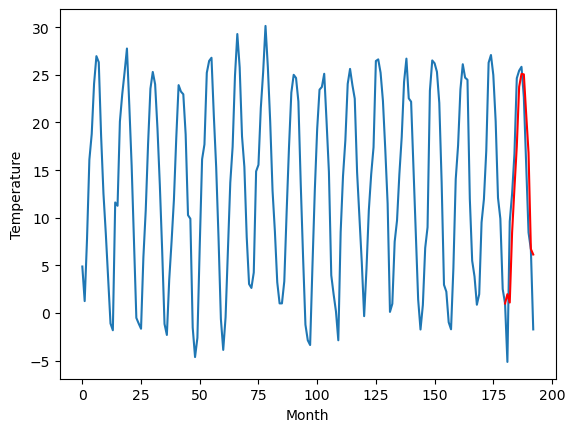

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		3.24		-2.35
9.02		2.38		-6.64
10.62		9.70		-0.92
12.06		14.36		2.30
16.10		18.73		2.63
17.73		24.97		7.24
18.10		26.35		8.25
18.38		26.30		7.92
17.09		22.11		5.02
15.25		18.05		2.80
8.09		7.97		-0.12
9.89		7.42		-2.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 3.2439899587631222, 2.380836679935455, 9.70415992975235, 14.355819418430329, 18.725587561130524, 24.965559198856354, 26.346317484378815, 26.302890493869782, 22.110161497592927, 18.054437353610993, 7.971326544284821, 7.419772102832795]


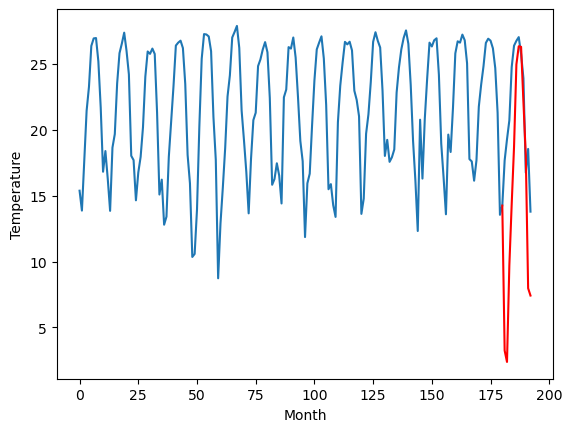

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		13.74		-1.67
13.49		12.87		-0.62
22.82		20.19		-2.63
23.89		24.83		0.94
28.36		29.22		0.86
32.62		35.45		2.83
33.28		36.83		3.55
33.93		36.79		2.86
30.81		32.59		1.78
27.42		28.53		1.11
18.75		18.45		-0.30
22.26		17.90		-4.36
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 13.739358429908753, 12.869128530025483, 20.193954770565036, 24.834741895198825, 29.217805688381198, 35.451871221065524, 36.83172291994095, 36.78969104319811, 32.58989341288805, 28.53366477519274, 18.44532306224108, 17.90036548405886]


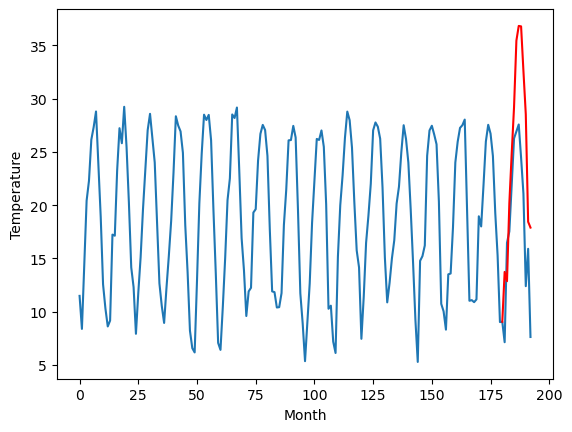

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		9.86		-0.71
7.11		8.97		1.86
18.07		16.30		-1.77
19.76		20.94		1.18
23.92		25.32		1.40
29.60		31.56		1.96
31.19		32.94		1.75
31.56		32.91		1.35
28.77		28.72		-0.05
24.12		24.66		0.54
16.12		14.57		-1.55
18.12		14.01		-4.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 9.861076583862305, 8.972686638832092, 16.30194365024567, 20.937185635566713, 25.32227837085724, 31.563466420173647, 32.94333182811737, 32.90512032225728, 28.720875689536335, 24.659564921408894, 14.569766947776081, 14.010377535372974]


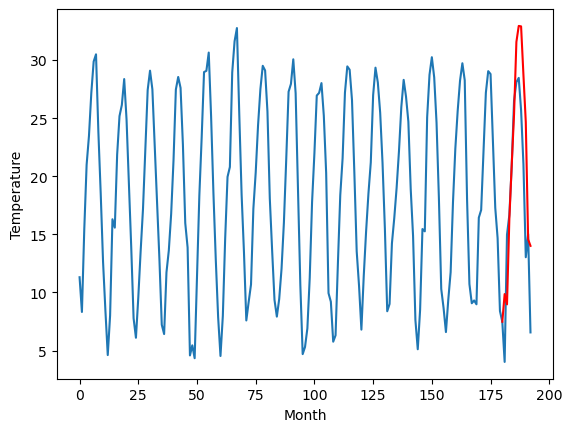

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		9.68		-1.03
6.82		8.79		1.97
17.74		16.12		-1.62
19.92		20.75		0.83
23.45		25.13		1.68
30.30		31.38		1.08
31.79		32.76		0.97
32.16		32.72		0.56
28.73		28.54		-0.19
23.86		24.48		0.62
16.02		14.39		-1.63
17.76		13.83		-3.93
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 9.682212767601014, 8.78736918926239, 16.11631244182587, 20.748799262046816, 25.131394324302676, 31.378014025688174, 32.75930994510651, 32.72027040034533, 28.54237628489733, 24.479334121048453, 14.388897185623648, 13.826752846539023]


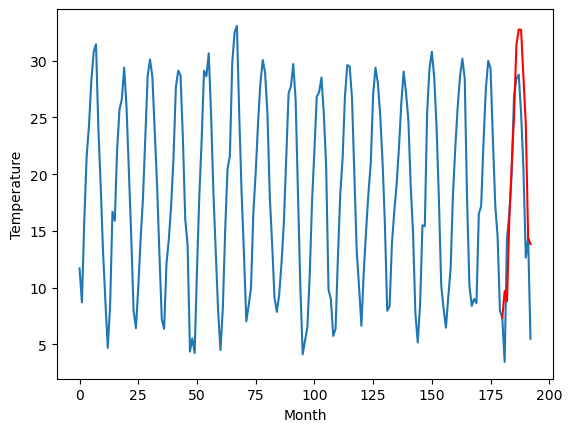

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		10.07		-0.52
9.02		9.18		0.16
18.27		16.50		-1.77
20.50		21.15		0.65
25.99		25.53		-0.46
30.95		31.77		0.82
30.69		33.16		2.47
31.01		33.12		2.11
30.32		28.93		-1.39
24.62		24.87		0.25
17.68		14.79		-2.89
18.09		14.22		-3.87
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 10.066429438591003, 9.178134682178497, 16.500785114765165, 21.146654369831083, 25.527614834308622, 31.77234292268753, 33.15689599752426, 33.115168257206676, 28.929934664219616, 24.868586702793834, 14.793290300816295, 14.222787065953014]


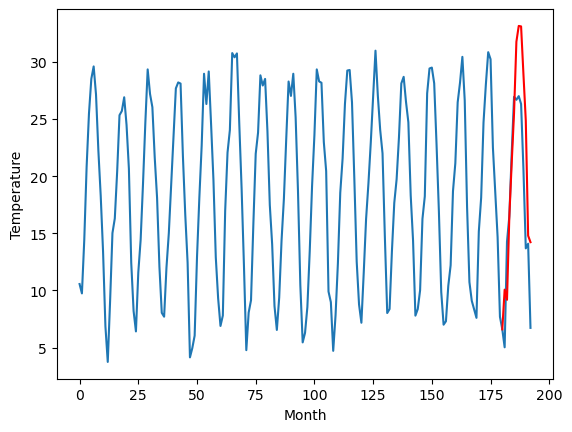

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		8.92		-1.87
11.46		8.03		-3.43
17.86		15.35		-2.51
20.59		20.00		-0.59
24.04		24.37		0.33
28.06		30.62		2.56
29.80		32.01		2.21
29.93		31.97		2.04
25.96		27.77		1.81
22.16		23.72		1.56
14.00		13.64		-0.36
15.91		13.08		-2.83
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 8.918518600463868, 8.030928251743317, 15.346305010318757, 20.002200720310213, 24.373887655735018, 30.62256538629532, 32.01049732923508, 31.96724889561534, 27.774843671768906, 23.72185848042369, 13.639062383621933, 13.08064720913768]


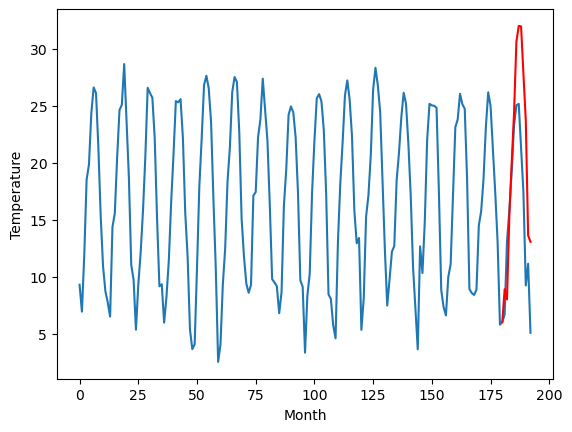

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		7.69		0.04
4.04		6.80		2.76
16.31		14.13		-2.18
18.21		18.78		0.57
22.25		23.15		0.90
28.55		29.40		0.85
29.84		30.78		0.94
30.36		30.74		0.38
27.32		26.55		-0.77
21.55		22.49		0.94
13.61		12.40		-1.21
15.07		11.84		-3.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 7.689000673294068, 6.799282319545746, 14.126192815303803, 18.77535272359848, 23.15356422185898, 29.399075276851654, 30.775292999744416, 30.73727575287223, 26.545411262363196, 22.48995080932975, 12.399227771610022, 11.838191065639258]


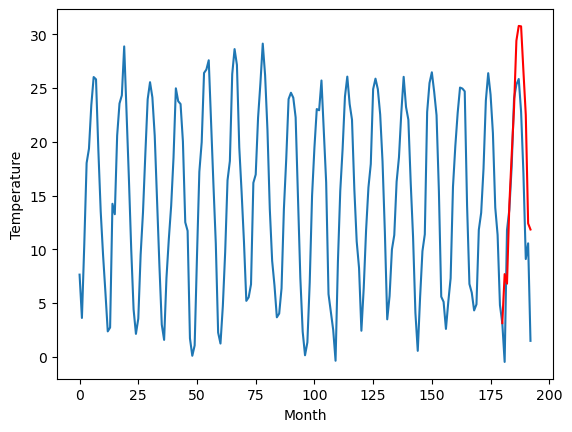

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.00		-0.06
2.70		5.11		2.41
14.67		12.44		-2.23
18.32		17.10		-1.22
22.73		21.48		-1.25
29.97		27.73		-2.24
30.54		29.10		-1.44
31.40		29.06		-2.34
27.91		24.87		-3.04
22.56		20.82		-1.74
11.70		10.72		-0.98
12.02		10.16		-1.86
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 6.00430025100708, 5.114762439727783, 12.443426742553712, 17.099210872650147, 21.478144302368165, 27.731655254364014, 29.102037444114686, 29.05890085488558, 24.86691334038973, 20.81747486382723, 10.718907854855061, 10.161638579666615]


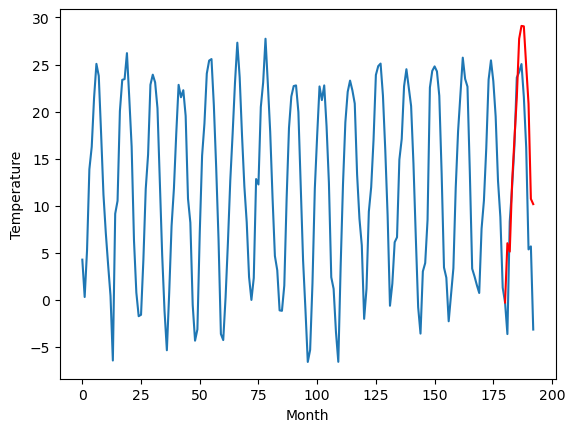

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		2.62		0.39
-2.21		1.73		3.94
11.65		9.06		-2.59
15.36		13.72		-1.64
20.14		18.11		-2.03
27.53		24.36		-3.17
27.24		25.73		-1.51
27.52		25.68		-1.84
24.41		21.48		-2.93
18.95		17.43		-1.52
8.64		7.32		-1.32
8.39		6.76		-1.63
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 2.622898230552673, 1.7311411595344541, 9.061479160785675, 13.718199322223663, 18.105134556293486, 24.36388022661209, 25.725244233608244, 25.67976087167859, 21.483112273961304, 17.42751544550061, 7.322467265874145, 6.762421487122772]


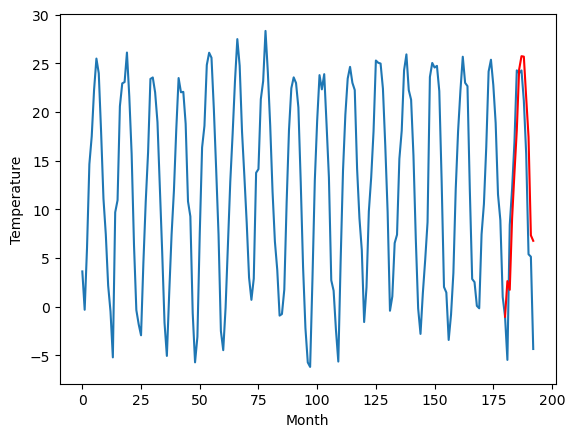

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		1.97		0.27
-0.54		1.09		1.63
9.35		8.41		-0.94
13.15		13.08		-0.07
17.68		17.46		-0.22
24.57		23.73		-0.84
24.73		25.09		0.36
25.93		25.05		-0.88
21.64		20.85		-0.79
18.11		16.81		-1.30
7.71		6.71		-1.00
6.85		6.15		-0.70
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 1.9690167856216432, 1.085401828289032, 8.407149608135224, 13.077724750041963, 17.46111422300339, 23.726233298778535, 25.092640097141267, 25.045322093069554, 20.84713903337717, 16.806146773397924, 6.705940398275853, 6.1531380143761645]


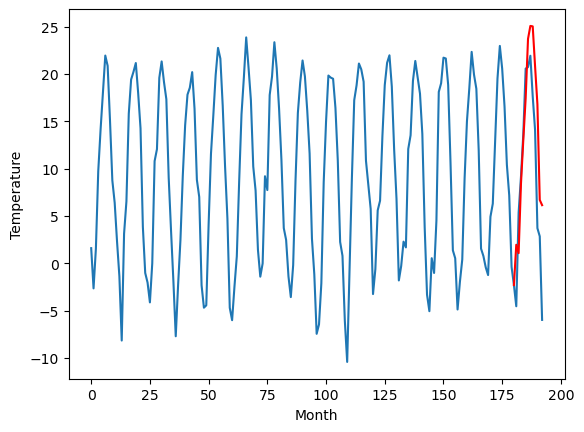

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   1.988368
1                 1    5.59   3.243990
2                 2   15.41  13.739358
3                 3   10.57   9.861077
4                 4   10.71   9.682213
5                 5   10.59  10.066429
6                 6   10.79   8.918519
7                 7    7.65   7.689001
8                 8    6.06   6.004300
9                 9    2.23   2.622898
10               10    1.70   1.969017


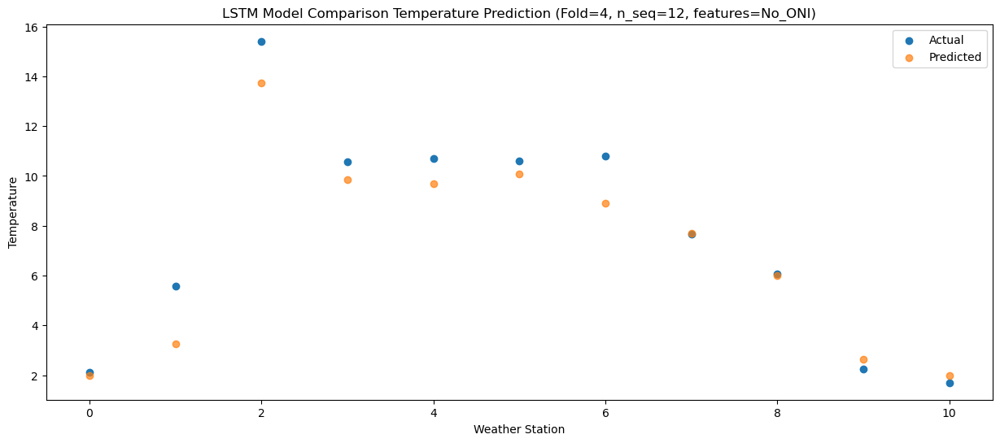

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02   1.111111
1                 1    9.02   2.380837
2                 2   13.49  12.869129
3                 3    7.11   8.972687
4                 4    6.82   8.787369
5                 5    9.02   9.178135
6                 6   11.46   8.030928
7                 7    4.04   6.799282
8                 8    2.70   5.114762
9                 9   -2.21   1.731141
10               10   -0.54   1.085402


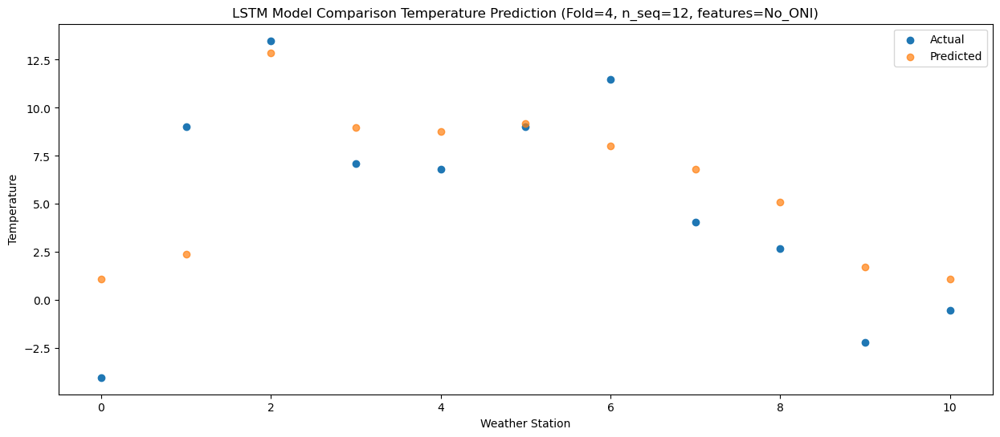

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71   8.450662
1                 1   10.62   9.704160
2                 2   22.82  20.193955
3                 3   18.07  16.301944
4                 4   17.74  16.116312
5                 5   18.27  16.500785
6                 6   17.86  15.346305
7                 7   16.31  14.126193
8                 8   14.67  12.443427
9                 9   11.65   9.061479
10               10    9.35   8.407150


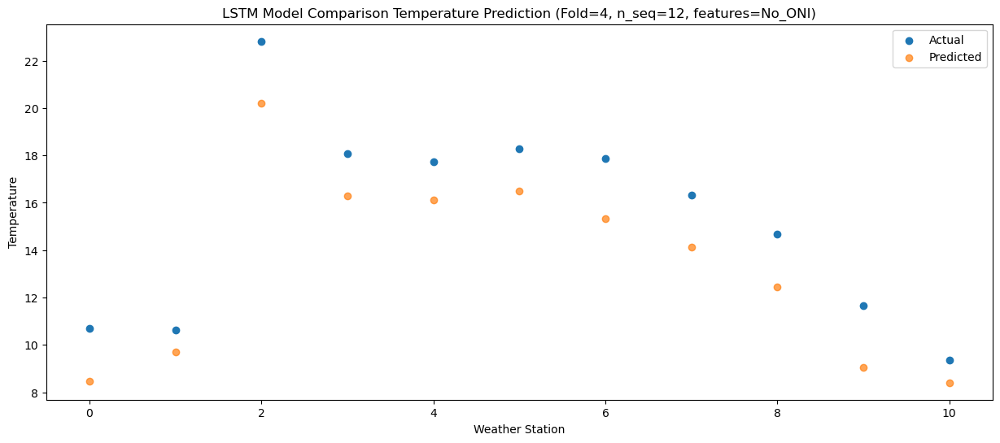

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  13.106267
1                 1   12.06  14.355819
2                 2   23.89  24.834742
3                 3   19.76  20.937186
4                 4   19.92  20.748799
5                 5   20.50  21.146654
6                 6   20.59  20.002201
7                 7   18.21  18.775353
8                 8   18.32  17.099211
9                 9   15.36  13.718199
10               10   13.15  13.077725


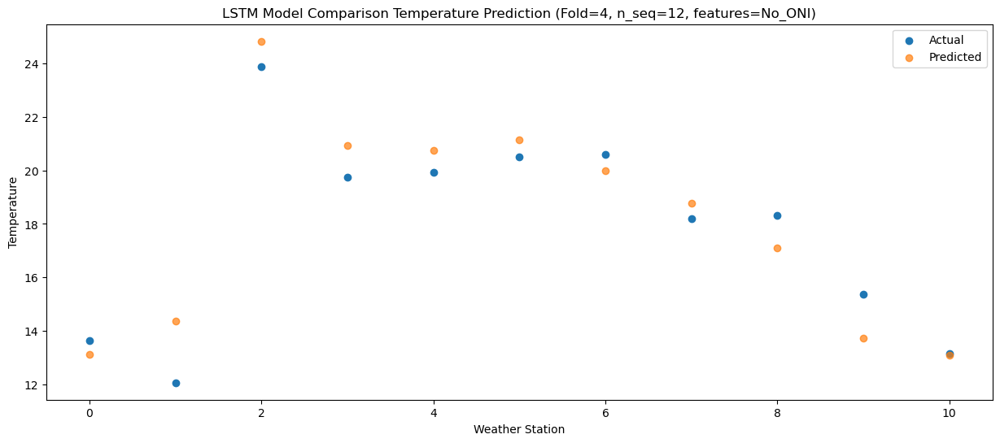

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  17.495902
1                 1   16.10  18.725588
2                 2   28.36  29.217806
3                 3   23.92  25.322278
4                 4   23.45  25.131394
5                 5   25.99  25.527615
6                 6   24.04  24.373888
7                 7   22.25  23.153564
8                 8   22.73  21.478144
9                 9   20.14  18.105135
10               10   17.68  17.461114


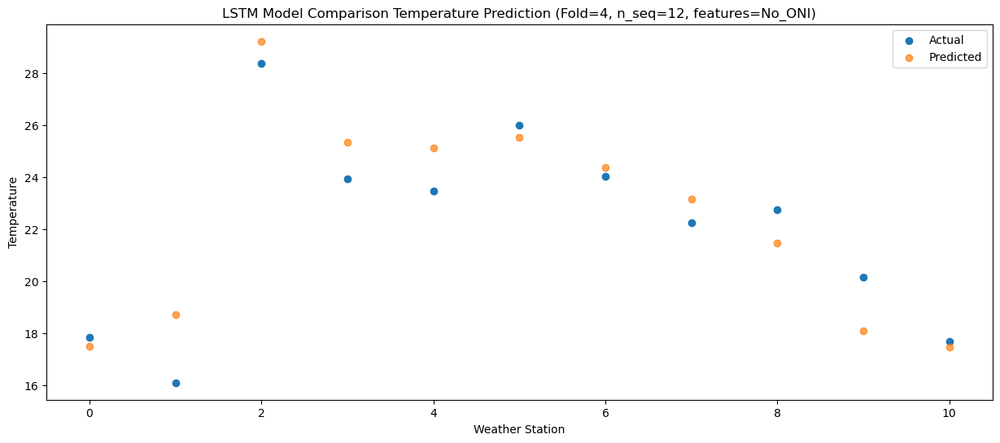

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  23.737289
1                 1   17.73  24.965559
2                 2   32.62  35.451871
3                 3   29.60  31.563466
4                 4   30.30  31.378014
5                 5   30.95  31.772343
6                 6   28.06  30.622565
7                 7   28.55  29.399075
8                 8   29.97  27.731655
9                 9   27.53  24.363880
10               10   24.57  23.726233


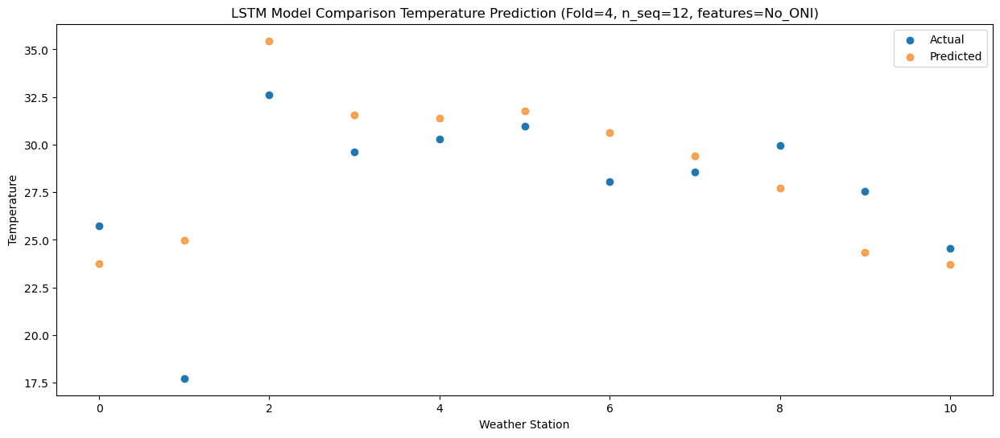

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   26.54  25.095711
1                 1   18.10  26.346317
2                 2   33.28  36.831723
3                 3   31.19  32.943332
4                 4   31.79  32.759310
5                 5   30.69  33.156896
6                 6   29.80  32.010497
7                 7   29.84  30.775293
8                 8   30.54  29.102037
9                 9   27.24  25.725244
10               10   24.73  25.092640


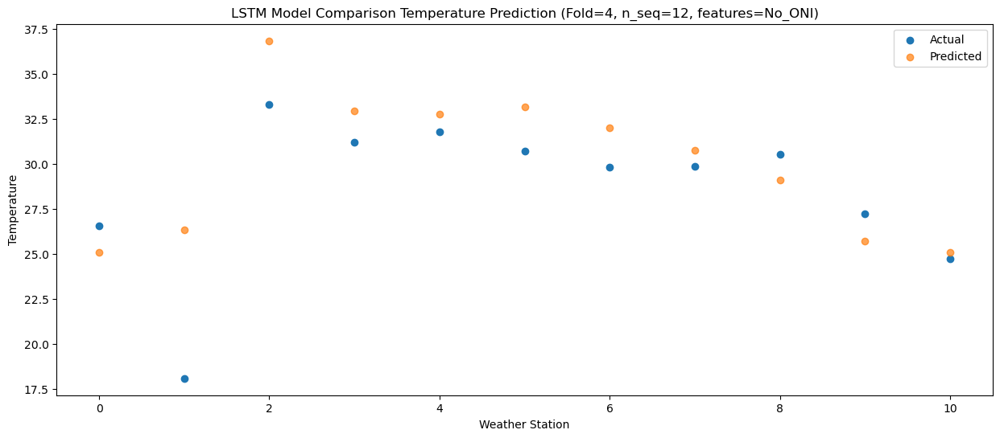

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   26.94  25.049936
1                 1   18.38  26.302890
2                 2   33.93  36.789691
3                 3   31.56  32.905120
4                 4   32.16  32.720270
5                 5   31.01  33.115168
6                 6   29.93  31.967249
7                 7   30.36  30.737276
8                 8   31.40  29.058901
9                 9   27.52  25.679761
10               10   25.93  25.045322


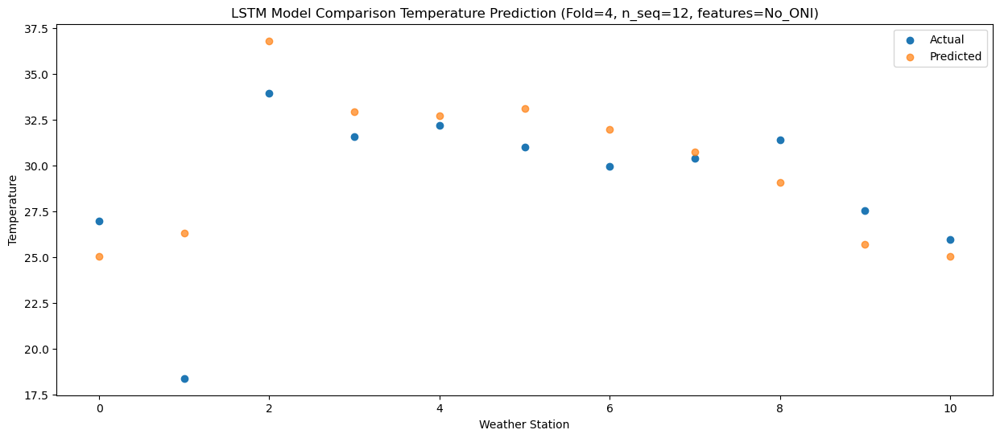

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.75  20.867998
1                 1   17.09  22.110161
2                 2   30.81  32.589893
3                 3   28.77  28.720876
4                 4   28.73  28.542376
5                 5   30.32  28.929935
6                 6   25.96  27.774844
7                 7   27.32  26.545411
8                 8   27.91  24.866913
9                 9   24.41  21.483112
10               10   21.64  20.847139


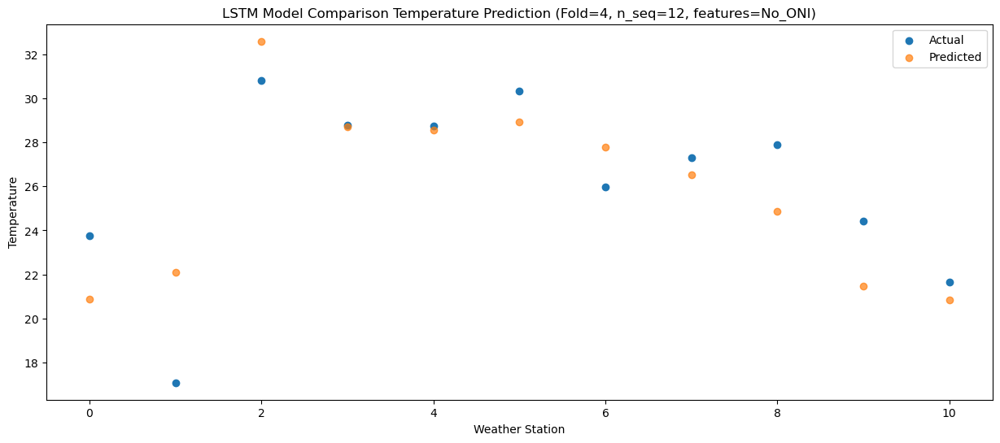

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.62  16.817215
1                 1   15.25  18.054437
2                 2   27.42  28.533665
3                 3   24.12  24.659565
4                 4   23.86  24.479334
5                 5   24.62  24.868587
6                 6   22.16  23.721858
7                 7   21.55  22.489951
8                 8   22.56  20.817475
9                 9   18.95  17.427515
10               10   18.11  16.806147


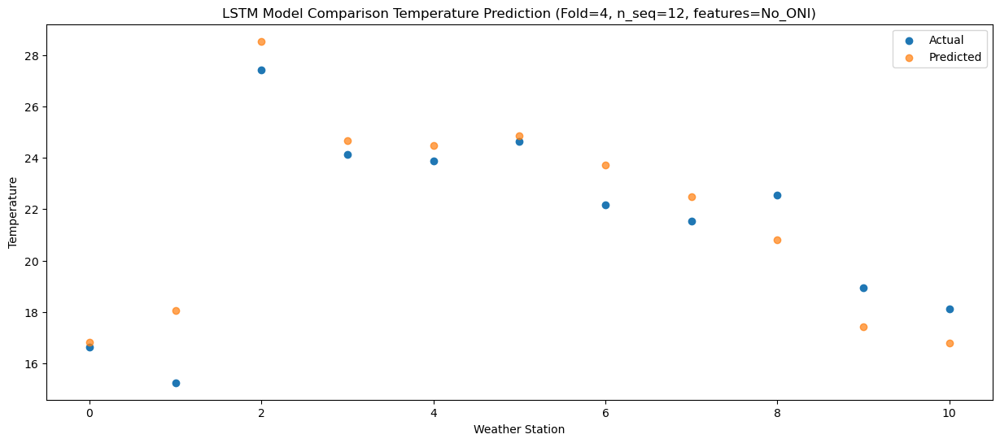

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    9.56   6.720805
1                 1    8.09   7.971327
2                 2   18.75  18.445323
3                 3   16.12  14.569767
4                 4   16.02  14.388897
5                 5   17.68  14.793290
6                 6   14.00  13.639062
7                 7   13.61  12.399228
8                 8   11.70  10.718908
9                 9    8.64   7.322467
10               10    7.71   6.705940


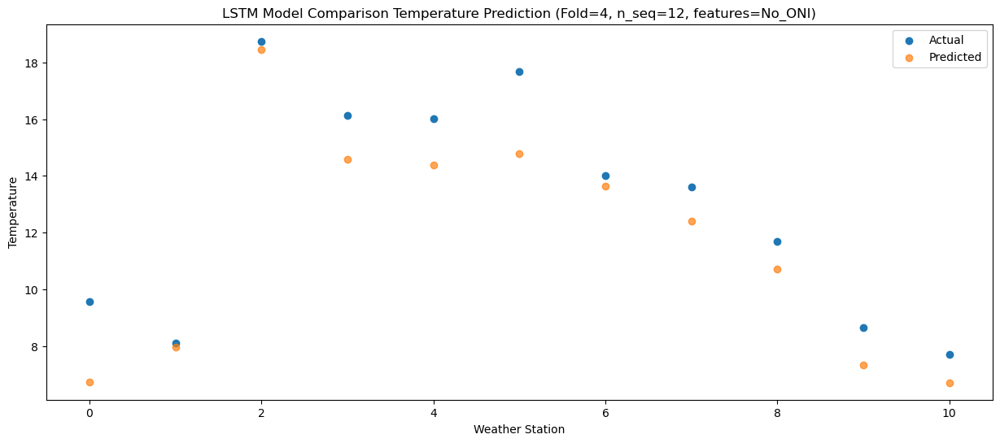

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.77   6.147340
1                 1    9.89   7.419772
2                 2   22.26  17.900365
3                 3   18.12  14.010378
4                 4   17.76  13.826753
5                 5   18.09  14.222787
6                 6   15.91  13.080647
7                 7   15.07  11.838191
8                 8   12.02  10.161639
9                 9    8.39   6.762421
10               10    6.85   6.153138


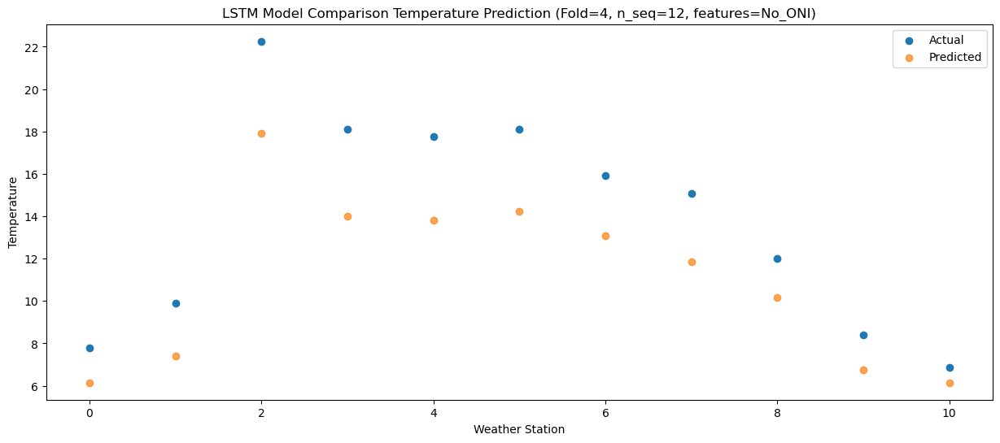

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]
 [26.54 18.1  33.28 31.19 31.79 30.69 29.8  29.84 30.54 27.24 24.73]
 [26.94 18.38 33.93 31.56 32.16 31.01 29.93 30.36 31.4  27.52 25.93]
 [23.75 17.09 30.81 28.77 28.73 30.32 25.96 27.32 27.91 24.41 21.64]
 [16.62 15.25 27.42 24.12 23.86 24.62 22.16 21.55 22.56 18.95 18.11]
 [ 9.56  8.09 18.75 16.12 16.02 17.68 14.   13.61 11.7   8.64  7.71]
 [ 7.77  9.89 22.26 18.12 17.76 18.09 15.91 15.07 12.02  8.39  6.85]]
[[ 1.98836779  3.24398996 13.73935843  9.86107658  9.68221277 10.06642944
   8.9185186   7.68900067  6.00430025  2.62289823  1.96901679]
 [ 1.11111128  2.38083668 12

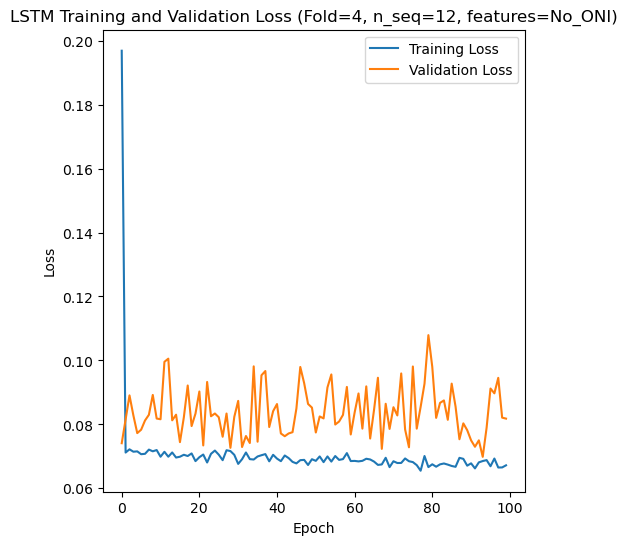

[[2.3623236335142157], [1.8673430450629187], [4.036760784333035], [2.976812083406046], [2.3247471814060723]]
[[array(2.36232363)], [array(1.86734305)], [array(4.03676078)], [array(2.97681208)], [array(2.32474718)]]
[[1.9196871144211656], [1.4728572870508736], [2.9246869804281173], [2.0170004015619103], [1.7902394747858246]]
[[0.13902509408673672], [0.08809983576602998], [0.21295842071247228], [0.3692394405168551], [0.16036460796305443]]
[[0.9098072047258517], [0.9378395817484606], [0.7814789795207459], [0.8890270072653749], [0.9308088568157512]]
[[array(0.09184519)], [array(0.08809984)], [array(0.21295842)], [array(0.00729689)], [array(0.06839914)]]
[[array(0.93038908)], [array(0.94925519)], [array(0.86159154)], [array(0.91410515)], [array(0.93803155)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 24.44 24.55 20.97 16.95  8.19 11.57
 12.87 12.78 17.84 19.24 23.26 26.74 27.96 28.3  26.17 23.54 18.03 17.79
 15.34 16.2  22.18 23.82 27.8  31.94 33.7  33.98 30.41 26.53 18.17 20.35
  9.    7.43 15.3

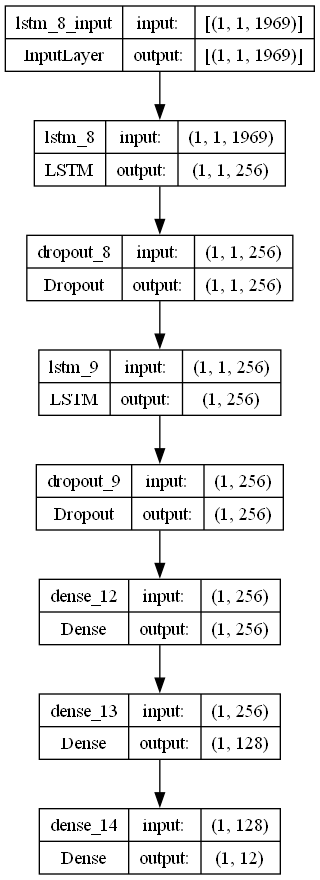

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr = 0.012583806596462462 
    optimizer = SGD(learning_rate = lr)
    activation_function = 'sigmoid'
    lstm_units = 256
    dropout_rate = 0.18933335146113747

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S12_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)